# Week 4 - Semantic & Influence Networks

## Answer from Qian Zhang

This week, we explore the representation and analysis of semantic and influence networks. We begin by introducing you to some straightforward approaches to network analysis. We then begin to illustrate them with word networks that we can analyze to understand the structure of how words connect with one another, and the dynamics of how their meanings flow through a discursive system. For example, we can define links between words as a function of their co-presence within a document, chapter, paragraph, sentence, noun phrase or continuous bag of words. We can also define links as a function of words that rely on one another within a directed dependency parse, or links between extracted Subjects, Verbs and Objects, or nouns and the adjectives that modify them (or verbs and the adverbs that modify them). Rendering words linked as a network or discrete topology allows us to take advantage of the network analysis metrics like centrality and community.

Texts also represent moves in a social game, and we can analyze the interchange of words and phrases within them in order to understand more about the relationships between people, groups and organizations that interact with one another. For example, who influences whom? And in a singular conversation--like a discussion of tweets on comments in Facebook--or over vast stretches of time (e.g., How much was Kant influenced by Aristotle? by Plato? Was _Chinatown_ director Robert Towne influenced by Sophocles?) We will do this by extracting conversational moves from text. But note that the similarity measures from last week's homework can also be used to represent a matrix of similarities--and potential influences--from one document to another. Rendering social actors or documentary events (e.g., a book) linked as a network or discrete topology allows us to take advantage of the wide range of metrics and models developed for network analysis. These include measurement of network centrality, density and modularity, "block modeling" structurally equivalent relationships, and sophisticated graphical renderings of networks or network partitions that allow us to visually interrogate their structure and complexity of social relations. Moreover, we can link explicit social interactions (e.g., "friendship" on Facebook, coupling in a romantic relationship, etc.) with semantic networks to better make sense of how pepole (inter)act in the world. 

For this notebook we will use the following packages:

In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud_2020 #pip install -U git+git://github.com/Computational-Content-Analysis-2020/lucem_illud_2020.git

#All these packages need to be installed from pip

#This will be doing most of the work
import networkx as nx

import sklearn #For generating some matrices
import pandas #For DataFrames
import numpy as np #For arrays
import matplotlib.pyplot as plt #For plotting
import seaborn #Makes the plots look nice
import scipy #Some stats
import nltk #a little language code
from IPython.display import Image #for pics

import pickle #if you want to save layouts
import os

%matplotlib inline

# An Introduction to networks in *networkx*

We will primarily be dealing with graphs in this notebook, so lets first go over how to use them.

To start with, let's create an undirected graph:

In [2]:
g = nx.Graph()
g

We can add nodes. These are all named, like entries in a dictionary.

In [3]:
g.add_node(1)
g.add_node(2)
g.add_node(3)

Now we have 3 vertices:

In [4]:
len(g.nodes)

3

Or if we want to get more information about the graph:

In [5]:
print(nx.info(g))

Name: 
Type: Graph
Number of nodes: 3
Number of edges: 0
Average degree:   0.0000


We can give nodes properties, like name or type

In [6]:
g.nodes[1]

{}

In [7]:
g.nodes[1]['type'] = 'NN'

In [8]:
g.nodes[1]

{'type': 'NN'}

In [9]:
g.nodes[2]['name'] = 'dog'

In [10]:
g.nodes[2]

{'name': 'dog'}

Still pretty boring...

Lets add a couple of edges. Notice that we use the ids, but not any of the properties:

In [11]:
g.add_edges_from([(1, 2), (2, 3), (3, 1), (1,4)])
print(nx.info(g))

Name: 
Type: Graph
Number of nodes: 4
Number of edges: 4
Average degree:   2.0000


Note how the summary has changed. Moreover, there's one additional node, because we asked for an edge to 4.

We can also give the edges properties like weights:

In [12]:
g.edges[1, 2]['weight'] = 2
g.edges[1, 4]['weight'] = 2
g.edges[1, 4]

{'weight': 2}

Let's visualize our graph now:

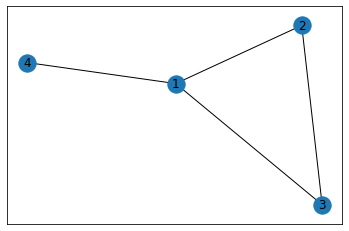

In [13]:
nx.draw_networkx(g)
plt.savefig("test.png")

Very exciting :-).

There are many things to do with the graph once we have created it, some of which we will explore here with a word semantic network.

First let's load some data: the Grimmer Senate press release corpus:

In [14]:
senReleasesDF = pandas.read_csv('../data/senReleasesTraining.csv', index_col = 0)
senReleasesDF[:3]

,download_url,html_url,name,path,text,targetSenator
0,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,01Apr2005Kennedy14.txt,raw/Kennedy/01Apr2005Kennedy14.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE...,Kennedy
1,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,01Aug2005Kennedy12.txt,raw/Kennedy/01Aug2005Kennedy12.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE...,Kennedy
2,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,01Aug2006Kennedy10.txt,raw/Kennedy/01Aug2006Kennedy10.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE ...,Kennedy


We will be extracting sentences, as well as tokenizing and stemming. (You should be able to do this in your sleep now).

In [15]:
senReleasesDF['tokenized_sents'] = senReleasesDF['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
senReleasesDF['normalized_sents'] = senReleasesDF['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

Let's begin by looking at words that co-occur in the sentences:

In [16]:
def wordCooccurrence(sentences, makeMatrix = False):
    words = set()
    for sent in sentences:
        words |= set(sent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in sentences:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        return g

I'm going to explain the function defined above line by line. But before we look at the function, let's first look at the structure of the data that we use here, senReleasesDF['normalized_sents']. 

In [17]:
senReleasesDF['normalized_sents']

0      [[immediate, release, immediate, release, cont...
1      [[immediate, release, immediate, release, cont...
2      [[immediate, release, immediate, release], [wa...
3      [[immediate, release, immediate, release], [wa...
4      [[immediate, release, immediate, release, cont...
                             ...                        
995    [[immediate, release, department, house, urban...
996    [[immediate, release], [welcome, today, s], [i...
997    [[immediate, release, immediate, release], [wa...
998    [[immediate, release, immediate, release], [wa...
999    [[immediate, release, immediate, release], [co...
Name: normalized_sents, Length: 999, dtype: object

As you can see, senReleasesDF['normalized_sents'] is a pandas series, i.e., one-dimensional labeled array that contains any type of data. Each array is comprised of a list of lists. In particular, each array is a list of sentences, each of which is also a list of words. 

In [18]:
senReleasesDF['normalized_sents'][0] #each array is a list of sentences

[['immediate', 'release', 'immediate', 'release', 'contact'],
 ['melissa', 'wagoner'],
 ['brent', 'carney'],
 ['boston'],
 ['ma',
  'senator',
  'edward',
  'be',
  'kennedy',
  'announce',
  'today',
  'worcester',
  'polytechnic',
  'institute',
  'receive',
  'grant',
  'business',
  'international',
  'education',
  'program',
  'u',
  's',
  'department',
  'education',
  'wpi',
  'use',
  'fund',
  'project',
  'south',
  'africa',
  'improve',
  'understand',
  'south',
  'africa',
  'economy',
  'enable',
  'wpi',
  'student',
  'study',
  'south',
  'africa',
  'strengthen',
  'new',
  'england',
  'company',
  'involvement',
  'south',
  'africa'],
 ['wpi',
  'receive',
  'federal',
  'fund',
  'past',
  'year',
  'business',
  'international',
  'education',
  'program',
  'project',
  'focus',
  'namibia'],
 ['senator',
  'kennedy',
  'say',
  'principle',
  'challenge',
  'face',
  'country',
  'economy',
  'today',
  'globalization'],
 ['grant',
  'enable',
  'wpi',
  'wo

In [19]:
senReleasesDF['normalized_sents'][0][4] #each sentence is a list of words

['ma',
 'senator',
 'edward',
 'be',
 'kennedy',
 'announce',
 'today',
 'worcester',
 'polytechnic',
 'institute',
 'receive',
 'grant',
 'business',
 'international',
 'education',
 'program',
 'u',
 's',
 'department',
 'education',
 'wpi',
 'use',
 'fund',
 'project',
 'south',
 'africa',
 'improve',
 'understand',
 'south',
 'africa',
 'economy',
 'enable',
 'wpi',
 'student',
 'study',
 'south',
 'africa',
 'strengthen',
 'new',
 'england',
 'company',
 'involvement',
 'south',
 'africa']

So, what do we want to do with this data? First, we want a list of words that occurred at least once in this corpus. Then, second, we want a word-word co-occurrence matrix. This is a square matrix (i.e. matrix with the name number of rows and columns), the rows and columns of which are words, and the entries of which refer to how many times these two words appeared together in sentences.

Let's start with the first task: getting a complete list of words in the corpus. 

(1) a complete list of unique words that appeared in this corpus

Since the data is a nested list (words are elements of sentences (which are lists) that are elements of lists (documents), we need to get each sentence out of each document and then get each word out of each sentence. So we do "for sent in sentences" to get each sentence out of each document, one by one, to extract word(s) that appeared in each sentence. But, in some sentences, same word appears more than once. So we use set() function, which converts a list (which, here, is each sentence) into a set. What is a set? It's the same old set that we know in mathematics: an unordered collection of items. Each element in a set is unique. Thus, using set(), we can get unique elements (that are, here, words) of each sentence. 

What is the "|=" here? This works as union operation when used with sets (just like +=). Then, we use list() to convert this set of words into a list. 

Then we assign index to each word. You'll see why we do it in the next step--to make the word-word co-occurrence matrix. So we do "wordIndices = {w: i for i, w in enumerate(wordLst)}", which will give us a dictionary whose keys are words and values are indices that we assigned to each word.

(2) word co-occurrence matrix

Now we have the complete list of words that appeared at least once in the corpus (with index assigned to each word). Using this, we want to make word-word co-occurrence matrix.

We first make an empty matrix, the size of which is n x n, where n refers to the number of unique words in the corpus. coOcMat is the empty matrix that we made by "coOcMat = np.zeros((len(wordIndices), len(wordIndices)))"

Then we'll count how many times each pair of words co-occurred in the corpus. So, we do another loop. Each sentence ("sent") has word(s). We want to select each word in a sentence, and find which words co-occurred with this word in each sentence, and then we move on to the next word in a sentence, do the same thing, until we get to the last word in this list (which is, here, a sentence); and, we iterate the whole process for every sentence. 

How did we do it? Let's look at the second loop. By doing "for i, word1 in enumerate(sent):", we select each word in each sentence ("sent"). Then we get the index of this word that we assigned above in the word list (here, be careful, we have two indices here, one refers to the index that we assigned in "wordIndices", and the other to the temporary index in each sentence that we got from "enumerate(sent)"--here, the "index" refers to the former, the one we can find in the wordIndices), by doing: "word1Index = wordIndices[word1]". Then, we count how many times the words next to this word in this list ("sent[i +1:]") co-occurred with this word, and update it to the coOcMat matrix.  

By the way, why do we do "coOcMat = coOcMat.T + coOcMat"?

If you go back and see what the loop does, and think about the characteristics of word-word co-occurrence matrix, it would make sense. Think about the structural characteristics of word-word co-occurrence matrix: it is a square matrix; it's a symmetric matrix (i.e. a square matrix that is equal to its transpose); and, it's main diagonal is zero. That said, in this matrix, let's say A, Aij and Aji are identical. This makes sense since the co-occurrence of i and j and the same as the co-occurrence of j and i. 

Let's go back to the loop we did above, especially how we counted the co-occurrence of each pair of words. We got the index of a word, let's say i, with another words, let's say j, and then we added 1 to Aij, rather than Aji. So, to make this matrix, coOcMat, a word-word co-occurrence matrix, we should add coOcMat and the transpose of this matrix (coOcMat.T).

First, build a graph based on word cooccurences in the first 100 press releases.

In [20]:
g = wordCooccurrence(senReleasesDF['normalized_sents'][:100].sum())

Why do we do .sum() here? This is because senReleasesDF['normalized_sents'] is, as I mentioned above, a pandas series, and the wordCooccurrence function that we defined above takesa list rather than pandas series. So, by doing senReleasesDF['normalized_sents'].sum(), we combine all the arrays into a list (of course, of lists).

Total number of vertices:

In [21]:
len(g.nodes)

4710

Total number of edges:

In [22]:
len(g.edges)

179328

A part of the adjacency matrix of cleaned word by press releases:

In [23]:
nx.to_numpy_matrix(g)[:10, :10]

matrix([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 2., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

We can save the graph and read it later, although this is slow if there are many edges or nodes, so we will filter first, as we will demonstrate below.

In [24]:
#nx.write_graphml(g, '../data/Obama_words.graphml')

Alternatively, we can build graphs starting with a two-mode network. Let's use the document-word frequency matrix.

In [25]:
def tokenize(text):
    tokenlist = lucem_illud_2020.word_tokenize(text)
    normalized = lucem_illud_2020.normalizeTokens(tokenlist)
    return normalized

In [26]:
import sklearn.feature_extraction
# in case we get a module not found error

In [27]:
senVectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)
senVects_incidence = senVectorizer.fit_transform(senReleasesDF['text'][:100])

In [28]:
senVects_incidence.shape

(100, 4710)

We need to turn the incidence matrix into a network. Note the use of bipartite as an attribute--this is how you need to tell networkx the graph is bipartite:

In [29]:
g_2mode = nx.Graph()

#define all the nodes
g_2mode.add_nodes_from((senVectorizer.get_feature_names()[i] for i in range(senVects_incidence.shape[1])), bipartite = 'word')
g_2mode.add_nodes_from(range(senVects_incidence.shape[0]), bipartite = 'doc')

#add all the edges
g_2mode.add_edges_from(((d, senVectorizer.get_feature_names()[w], {'weight' : senVects_incidence[d, w]}) for d, w in zip(*senVects_incidence.nonzero())))

In [30]:
print(nx.info(g_2mode))

Name: 
Type: Graph
Number of nodes: 4810
Number of edges: 21005
Average degree:   8.7339


A very popular layout algorithm for visualizing graphs is the Fruchterman-Reingold Algorithm (or spring layout), which uses a physical metaphor for lay-out. Nodes repel one another, and edges draw connected elements together like springs. The algorithm attempts to minimize the energy in such a system. For a large graph, however, the algorithm is computational demanding. 

Let's plot the bipartite network with a quick spring layout:

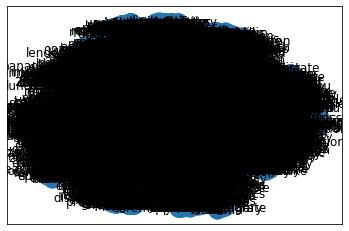

In [31]:
nx.draw_networkx(g_2mode)

With no filtering, this will not bring insight (see below). If we want even faster computation and tunable visualizations, check out [Pajek](http://mrvar.fdv.uni-lj.si/pajek/) or [gephi](https://gephi.org/).

A two-mode network can be easily transformed into two one-mode network, enabling words to be connected to other words via the number of documents that share them, or documents to be connected to other documents via the words they share:

In [32]:
def contractNetwork(g, targetType):
    g_mono = nx.Graph()
    g_mono.add_nodes_from(((n, d) for n, d in g_2mode.nodes(data = True) if d['bipartite'] == targetType))
    
    for n_outside in (n for n, d in g_2mode.nodes(data = True) if d['bipartite'] != targetType):
        neighbors = list((n for n in g.neighbors(n_outside) if g.nodes[n]['bipartite'] == targetType))
        for i, n1 in enumerate(neighbors):
            for n2 in neighbors[i+1:]:
                try:
                    g_mono.edges[n1, n2]['weight'] += 1
                except KeyError:
                    g_mono.add_edge(n1, n2, weight = 1)
    return g_mono

In [33]:
gDoc = contractNetwork(g_2mode, 'doc')

Let's first take a look at the document-to-document network:

In [34]:
print(nx.info(gDoc))

Name: 
Type: Graph
Number of nodes: 100
Number of edges: 4950
Average degree:  99.0000


Let's construct a visualization. It is not surprising that almost every document is connected to every other. We can use edge weight to distinguish document distance (modeled as attraction):

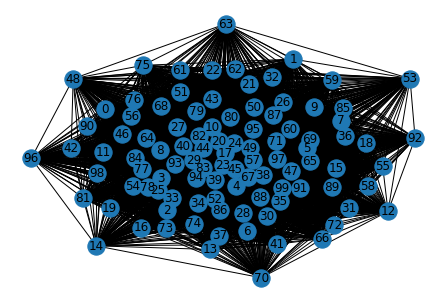

In [35]:
layout = nx.spring_layout(gDoc, k = 1/3, weight='weight', iterations= 50)
nx.draw(gDoc, pos = layout, labels = {n:n for n in gDoc.nodes()}) #Getting labels is a bit annoying

Lets draw the graph with high and low weight edges distinguished:

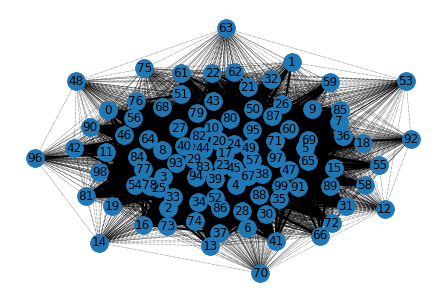

In [36]:
wMedian = np.median([d['weight'] for n1, n2, d in gDoc.edges(data = True)])
edgesHigh = [(n1, n2) for n1, n2, d in gDoc.edges(data = True) if d['weight'] > wMedian]
edgesLow = [(n1, n2) for n1, n2, d in gDoc.edges(data = True) if d['weight'] <= wMedian]
nx.draw(gDoc, pos = layout, labels = {n:n for n in gDoc.nodes()}, edgelist = edgesLow, style='dotted', width=.5)
nx.draw(gDoc, pos = layout, nodelist=None, edgelist = edgesHigh, width=2)

Now we can see why 53 and 63 are on the outside, while 39 and 23 are at the center. We can look at them:

In [37]:
print(len(senReleasesDF.iloc[63]['text']),"words:","\n",senReleasesDF.iloc[63]['text'].strip().replace('  ', '\n'))

314 words: 
 FOR IMMEDIATE RELEASE

Senator Kennedy issued the following statement this evening following Senator Kerrys apology

John Kerry s statement says it all
I wish the Bush administration brought as much energy and focus to trying to correct their mistakes in Iraq as it did in going after John Kerry


By the way, what's "iloc" here? iloc is used to select rows and columns in Pandas DataFrame. So,  senReleasesDF.iloc[63] gives the 63th row of senReleasesDF; and since we also specified the column (['text']), it gives us the text of the 63th row.

In [38]:
print(len(senReleasesDF.iloc[23]['text']),"words:","\n",senReleasesDF.iloc[23]['text'].strip().replace('  ', '\n'))

20603 words: 
 FOR IMMEDIATE RELEASE
REID

 We re sorry that we re starting a little bit late
but the House has some votes going
and so Leader Pelosi will be here and Congresswoman Solis real soon

 I m reminded of the story I learned as a little boy
When the kid was watching the sheep and he was supposed to yell
Wolf
when the wolf was coming
And he yelled
Wolf
as we know

Wolf
Wolf
and there was never any wolf
And finally when a wolf showed up
no one came

 And no matter how hard we try to be bipartisan here in Washington
with President Bush it s the proverbial cry for wolf

 As I said leaving the chamber last night
whatever he says
it s just the opposite

 And we re here today to talk about health care
But the cry of wolf is once again ringing in my ears because he keeps talking about how he wants to improve health care and we re now five years into this and there s been no improvement

 In fact
I hope the president mentions when he s in Tennessee today that there s almost a million 

Ah...those documents with the **most** words are unsprisingly the most central in this simple document network.

Now let's turn it around and look at the word-to-word network by documents. 

In [39]:
gWord = contractNetwork(g_2mode, 'word')
print(nx.info(gWord))

Name: 
Type: Graph
Number of nodes: 4710
Number of edges: 2063890
Average degree: 876.3864


First, let's reduce the number of words to a manageable size.

In [40]:
wMean = np.mean([d['weight'] for n1, n2, d in gWord.edges(data = True)])
wMean

1.7778965933261948

We are going to return to the sentence cooccurence graph, as it suggests many more meaningful (more local) associations. But without filtering, it is too large. Let's first drop all the edges with weight below 25, then drop all the isolates. You are recommended to play with the weight here to see how the graph might look different.

In [41]:
g = wordCooccurrence(senReleasesDF['normalized_sents'][:100].sum())

In [42]:
len(g)

4710

In [43]:
g.remove_edges_from([(n1, n2) for n1, n2, d in g.edges(data = True) if d['weight'] <= 25])

In [44]:
g.remove_nodes_from(list(nx.isolates(g))) #since we are changing the graph list() evaluates the isolates first

In [45]:
def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)

In [46]:
giant = max(connected_component_subgraphs(g), key=len) # keep just the giant connected component
print(nx.info(giant))

Name: 
Type: Graph
Number of nodes: 158
Number of edges: 458
Average degree:   5.7975


A bit smaller now, Now, let's visualize it: 

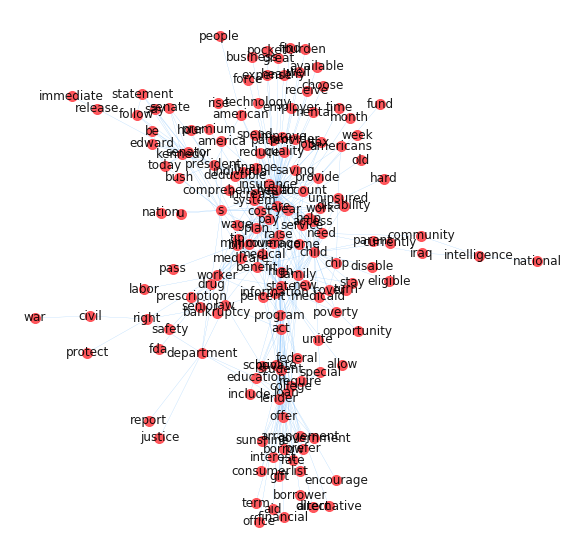

In [47]:
layout = nx.spring_layout(giant, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

In [48]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(giant))

Let us use this oppurtunity to introduce a concept of finding communities in graphs: a popular one is the modularity measure, introduced in: Clauset, A., Newman, M. E., & Moore, C. “Finding community structure in very large networks.” Physical Review E 70(6), 2004.

networkx implements this through the above method. It yields sets of nodes, one for each community.

In [49]:
c

[frozenset({'access',
            'account',
            'act',
            'aid',
            'allow',
            'alternative',
            'america',
            'american',
            'americans',
            'arrangement',
            'available',
            'bankruptcy',
            'be',
            'benefit',
            'bill',
            'borrow',
            'borrower',
            'burden',
            'bush',
            'business',
            'care',
            'child',
            'chip',
            'choose',
            'civil',
            'college',
            'community',
            'comprehensive',
            'consumer',
            'cost',
            'cover',
            'coverage',
            'currently',
            'deductible',
            'department',
            'direct',
            'disability',
            'disable',
            'drug',
            'education',
            'edward',
            'eligible',
            'employer',
            '

We can also remove those words that show up in many documents...those with many connections (note that this has a similar effect to selecting those with a high tf.idf score). Note that for this case we get the same graph; this is just to demonstrate the different kinds of node dropping and graph changes we can do.

In [50]:
giant = nx.Graph(giant)

In [51]:
giant.remove_nodes_from([n for n in giant.nodes if len(set(giant.neighbors(n))) >= 2000]) 
giant.remove_nodes_from(list(nx.isolates(giant)))
print(nx.info(giant))

Name: 
Type: Graph
Number of nodes: 158
Number of edges: 458
Average degree:   5.7975


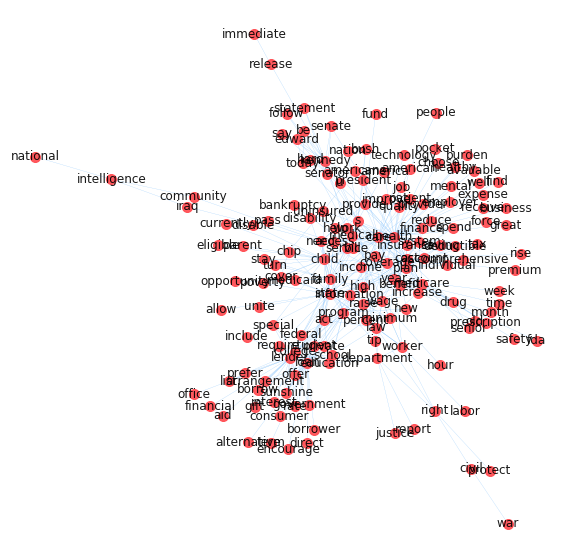

In [52]:
layout = nx.spring_layout(giant, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

We can continue to trim globally to investigate the structure of words at alternative slices of network density. 

Moreover, we can find cliques, or completely connected sets of nodes. 

In [53]:
print(', '.join(max(nx.clique.find_cliques(giant), key = lambda x: len(x))))

health, care, child, family, year, state, need


Now lets look at a subgraph of the network, those nodes that are within 1 or 2 network steps of 'america'. 

In [54]:
americanNeighbors = giant.neighbors('american')
g_american = giant.subgraph(americanNeighbors)
print(nx.info(g_american))

Name: 
Type: Graph
Number of nodes: 5
Number of edges: 11
Average degree:   4.4000


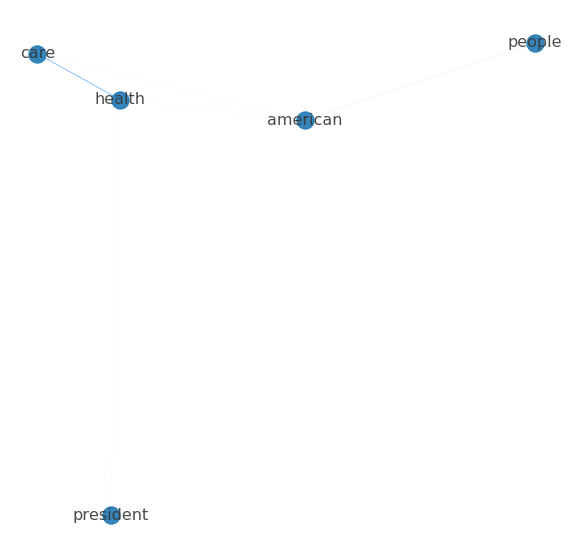

In [55]:
layout_amer = nx.spring_layout(g_american, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
maxWeight = max((d['weight'] for n1, n2, d in g_american.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_american.edges(data = True)))
nx.draw(g_american, ax = ax, pos = layout_amer, labels = {n:n for n in g_american.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_american.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma')) 

In [56]:
americanNeighbors = gWord.neighbors('american')
americanNeighborsPlus1 = set(americanNeighbors)
for n in americanNeighbors:
    americanNeighborsPlus1 |= set(giant.neighbors(n))
    
#for x in americanNeighborsPlus1:
#    print(x)

In [57]:
g_american2 = giant.subgraph(americanNeighborsPlus1)
print(nx.info(g_american2))

Name: 
Type: Graph
Number of nodes: 154
Number of edges: 447
Average degree:   5.8052


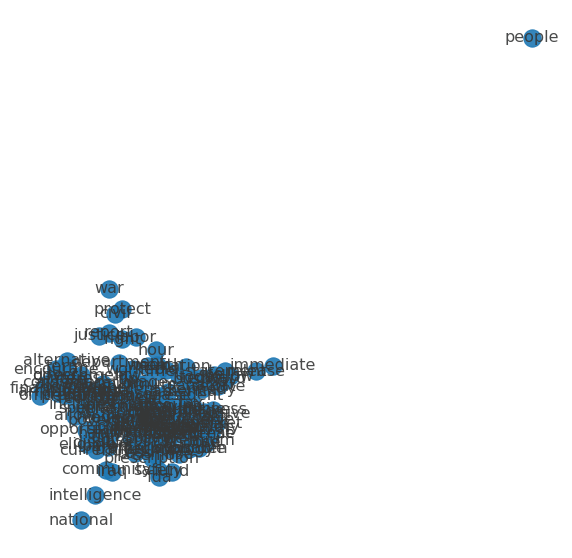

In [58]:
layout_amer = nx.spring_layout(g_american2, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
centralities_amer = nx.eigenvector_centrality(g_american2)
maxC = max(centralities_amer.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in g_american2.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_american2.edges(data = True)))
nx.draw(g_american2, ax = ax, pos = layout_amer, labels = {n:n for n in g_american2.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_american2.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma')) 

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Construct cells immediately below this that render networks to meaningfully characterize the structure of words and documents (or subdocuments like chapters or paragraphs) from your corpus. What are useful filters and thresholds and what semantic structures do they reveal that give insight into the social world and social game inscribed in your corpus? Interrogate interesting subgraphs of your network and detail what they reveal about the semantic space involved.

I will keep using the corpus of the campaign speeches by Trump.

In [59]:
import zipfile

# load the corpus

corpus_speech = "/Users/timqzhang/Desktop/UChicago/MACSS_Spring_2020/content_local/Corpus_Speeches"

def loadcorpus(corpus_name):
    texts_raw = {}
    for file in os.listdir(corpus_name + "/"):
        
        if 'Trump' in file:
            zfile = zipfile.ZipFile(corpus_name + "/" + file)
            for file in zfile.namelist():
                if 'txt' in file[6:] and 'SX' not in file:
                    texts_raw[file[6:]] = []
                    with zfile.open(file) as f:
                        for line in f:
                            texts_raw[file[6:]].append(line)
    return texts_raw

speech_raw=loadcorpus(corpus_speech)

# clean the non-relevant parts

import re #for regexs

def clean_raw_text2(raw_texts):
    clean_texts = []
    for text in raw_texts:
        try:
            text = text.decode("utf-8")
            
            if 'TRUMP' in text:

                clean_text = text.replace("\\'m", "'m").replace("\\'ll", "'ll").replace("\\'re", "'re").replace("\\'s", "'s").replace("\\'re", "'re").replace(" n\'t", "n't").replace("\\'ve", "'ve").replace("\\'d", "'d")
                clean_text= re.sub(r'\n','',clean_text)
                clean_text= re.sub(r'\<\S+\>','',clean_text)
                clean_text= re.sub(r'\<\D+\>','',clean_text)
                
                clean_texts.append(clean_text[1:])
        except AttributeError:
            # print("ERROR CLEANING")
            # print(text)
            continue
        except UnicodeDecodeError:
            # print("Unicode Error, Skip")
            continue
    return clean_texts

In [60]:
# transfer to the dataframe

# here context is a column to indicate the context and purpose of the speech

trump_dict={'source':[],'context':[],'text':[]}

for key,value in speech_raw.items():
    trump_dict['source'].append(key)
    for content in value:
        temp=content.decode('utf-8')
        break
    trump_dict['context'].append(temp[temp.index('=')+2:temp.index('\"',20)])
    trump_dict['text'].append(''.join(clean_raw_text2(value)))
    
trump_df=pandas.DataFrame(trump_dict)
trump_df

,source,context,text
0,Trump_2016-10-10-A.txt,"Donald Trump, Republican Presidential Candidat...",Thank you. Thank you. Thank you. And we love B...
1,Trump_2016-07-26.txt,"Donald Trump, Republican Presidential Candidat...","Thank you very much, everybody. Wow. Thank you..."
2,Trump_2016-10-17.txt,"Donald Trump, Republican Presidential Candidat...","start by thanking the fire marshal. days, w..."
3,Trump_2016-09-07-A.txt,"Donald Trump, Republican Presidential Candidat...","We want to achieve a stable, peaceful world wi..."
4,Trump_2016-10-10-B.txt,"Donald Trump, Republican Presidential Candidat...","Wow. Thank you very much, everybody. I don't k..."
...,...,...,...
77,Trump_2016-07-27-A.txt,"Donald Trump, Republican presidential candidat...","So, it's been 235 days since crooked Hillary C..."
78,Trump_2016-10-27.txt,"Donald Trump, Republican Presidential Candidat...","Wow, tremendous. Wow. Thank you very much. Tha..."
79,Trump_2016-09-09-B.txt,"Donald Trump, Republican Presidential Candidat...",The fact that so many encrusted old political ...
80,Trump_2016-09-12-A.txt,"Donald Trump, Republican Presidential Candidat...","Thank you, everybody. Thank you. Wow, it's a l..."


In [61]:
# tokenizing and normalizing

trump_df['tokenized_sents'] = trump_df['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
trump_df['normalized_sents'] = trump_df['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

In [62]:
# define func for co-occur words in sentences

def wordCooccurrence(sentences, makeMatrix = False):
    words = set()
    for sent in sentences:
        words |= set(sent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in sentences:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        return g

In [63]:
# start with two mode network and firstly build a speech-word frequency matrix

def tokenize(text):
    tokenlist = lucem_illud_2020.word_tokenize(text)
    normalized = lucem_illud_2020.normalizeTokens(tokenlist)
    return normalized

import sklearn.feature_extraction
# in case we get a module not found error

In [64]:
trump_Vectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)
trump_Vects_incidence = trump_Vectorizer.fit_transform(trump_df['text'])

trump_Vects_incidence.shape

(82, 6436)

In [65]:
# turn the incidence matrix into a network

g_2mode = nx.Graph()

#define all the nodes
g_2mode.add_nodes_from((trump_Vectorizer.get_feature_names()[i] for i in range(trump_Vects_incidence.shape[1])), bipartite = 'word')
g_2mode.add_nodes_from(range(trump_Vects_incidence.shape[0]), bipartite = 'speech')

#add all the edges
g_2mode.add_edges_from(((d, trump_Vectorizer.get_feature_names()[w], {'weight' : trump_Vects_incidence[d, w]}) for d, w in zip(*trump_Vects_incidence.nonzero())))

In [66]:
print(nx.info(g_2mode))

Name: 
Type: Graph
Number of nodes: 6518
Number of edges: 56383
Average degree:  17.3007


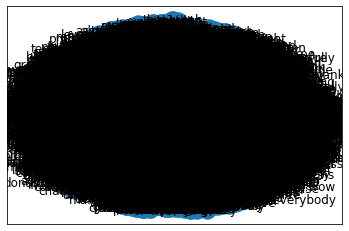

In [67]:
nx.draw_networkx(g_2mode)

### Comment/Inference

With no filtering, this chart makes no sense and it cannot bring much insight. Therefore, we will further check speech-to-speech and word-to-word network.

In [68]:
# check the speech-to-speech network

def contractNetwork(g, targetType):
    g_mono = nx.Graph()
    g_mono.add_nodes_from(((n, d) for n, d in g_2mode.nodes(data = True) if d['bipartite'] == targetType))
    
    for n_outside in (n for n, d in g_2mode.nodes(data = True) if d['bipartite'] != targetType):
        neighbors = list((n for n in g.neighbors(n_outside) if g.nodes[n]['bipartite'] == targetType))
        for i, n1 in enumerate(neighbors):
            for n2 in neighbors[i+1:]:
                try:
                    g_mono.edges[n1, n2]['weight'] += 1
                except KeyError:
                    g_mono.add_edge(n1, n2, weight = 1)
    return g_mono

g_speech = contractNetwork(g_2mode, 'speech')

In [69]:
print(nx.info(g_speech))

Name: 
Type: Graph
Number of nodes: 82
Number of edges: 3321
Average degree:  81.0000


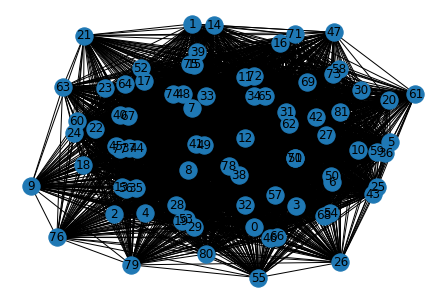

In [70]:
# check the network graph

layout_speech = nx.spring_layout(g_speech, k = 1/3, weight='weight', iterations= 50)
nx.draw(g_speech, pos = layout_speech, labels = {n:n for n in g_speech.nodes()}) #Getting labels is a bit annoying

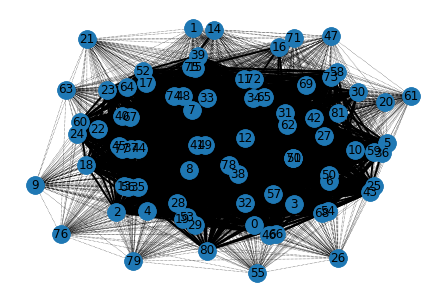

In [71]:
# draw the graph with high and low weight edges distinguished

wMedian = np.median([d['weight'] for n1, n2, d in g_speech.edges(data = True)])
edgesHigh = [(n1, n2) for n1, n2, d in g_speech.edges(data = True) if d['weight'] > wMedian]
edgesLow = [(n1, n2) for n1, n2, d in g_speech.edges(data = True) if d['weight'] <= wMedian]
nx.draw(g_speech, pos = layout_speech, labels = {n:n for n in g_speech.nodes()}, edgelist = edgesLow, style='dotted', width=.5)
nx.draw(g_speech, pos = layout_speech, nodelist=None, edgelist = edgesHigh, width=2)

### Comment/Inference

It seems that the node 26, 55, 47, 21, 63 and 1 are outside, while nodes of 62, 12, 8 and 49 are in the center. I would like to check why they are in the center or outside.

In [329]:
# check the node in the center

# as the speech is quite long, for the content, just extract the first 1000 characters

center_node=[62,12,8,49]

for node in center_node:
    print('node {}\n'.format(node), len(trump_df.iloc[node]['text']),"words:",'\nText from: ', trump_df.iloc[node]['context'], '\n\nFirst 1000 characters: ', trump_df.iloc[node]['text'].strip().replace('  ', '\n')[:1000])
    print()

node 62
 37606 words: 
Text from:  Donald Trump, Republican Presidential Candidate, delivers remarks at a campaign event in Grand Rapids, Michigan 

First 1000 characters:  Thank you, Coach. Boy, oh boy.
He's something, Coach Knight.
No games, right? With him there's no games. Thank you, Coach. Thank you, General. What a combination those two are right?
Boy this is a great group. You know, we set this up about 24 hours ago, because I hear we're going great in Michigan -- we're gonna win Michigan.
We're doing great in every poll, I mean we're doing amazing.
We're winning in Ohio. We're winning in Iowa. We're winning in North Carolina.
We're winning in Florida.We're winning big in Texas -- you know, they were saying Texas is -- Texas is setting new voting records. We're winning all over the place, folks. This is going to be something special. In eight days we're going to win the great state of Michigan...
... and we are going to win back the White House. One hundred percent. Let me start

In [73]:
# check the node outside 

# as the speech is quite long, for the content, just extract the first 1000 characters

out_node=[26, 55, 47, 21, 63, 1]

for node in out_node:
    print('node {}\n'.format(node), len(trump_df.iloc[node]['text']),"words:",'\nText from: ', trump_df.iloc[node]['context'], '\n\nFirst 1000 characters: ', trump_df.iloc[node]['text'].strip().replace('  ', '\n')[:1000])
    print()

node 26
 14378 words: 
Text from:  Donald Trump, Republican Presidential Candidate, participates in a Fox News townhall event 

First 1000 characters:  Absolutely it is. And we're not taking it, uh, we're not taking it to them and we have to take it to them. You know, I didn't want to go into Iraq, I said, now he's a civilian, so I would say not too many people cared what I wanted to do. But that was a terrible mistake. Our terrible mistake number two was getting out the way we got out. President Obama, Hillary Clinton, the way they got out was absolutely insane. It will be talked about for many, many years and it really led to the formation of ISIS. Uh, we have problems in this country. We're letting thousands and thousands of people come into our country. We have no idea who they are, where they come from. There's no paperwork. Nobody knows what they're doing. And they're coming in by the thousands. And Hillary Clinton, it was announced recently that she wants to allow 550 percent mo

### Comment/Inference

ah..It seems that my conclusion is the same as in the demo, as the speech with most words (30000+) will be at the center, while the speech with just around 10000 words will be on the outside. It is not a surprise, so I will further check the word-to-word network.

In [74]:
# check the word-to-word network

gWord_trump = contractNetwork(g_2mode, 'word')
print(nx.info(gWord_trump))

Name: 
Type: Graph
Number of nodes: 6436
Number of edges: 5741451
Average degree: 1784.1675


In [75]:
# reduce the number of the words

wMean_trump = np.mean([d['weight'] for n1, n2, d in gWord_trump.edges(data = True)])
wMean_trump

3.552951858336856

In [76]:
g_trump=wordCooccurrence(trump_df['normalized_sents'].sum())
print(len(g_trump))
g_trump.remove_edges_from([(n1, n2) for n1, n2, d in g_trump.edges(data = True) if d['weight'] <= 100])
g_trump.remove_nodes_from(list(nx.isolates(g))) #since we are changing the graph list() evaluates the isolates first

5922


In [77]:
def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)

giant_trump = max(connected_component_subgraphs(g_trump), key=len) # keep just the giant connected component
print(nx.info(giant_trump))

Name: 
Type: Graph
Number of nodes: 78
Number of edges: 172
Average degree:   4.4103


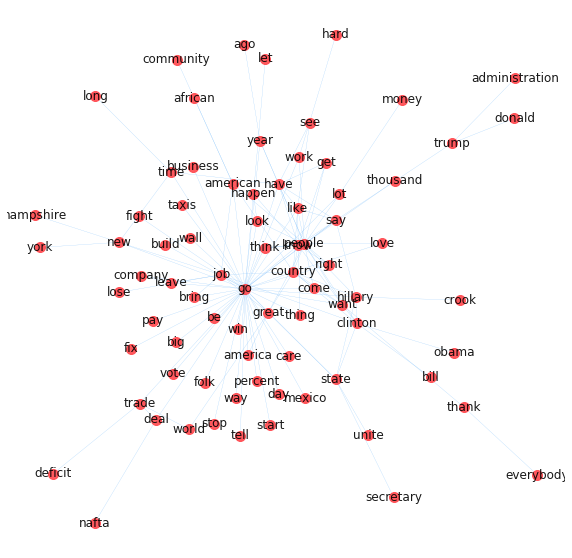

In [78]:
# visualize the graph

layout_trump1 = nx.spring_layout(giant_trump, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_trump, ax = ax, pos = layout_trump1, labels = {n:n for n in giant_trump.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

### Comment/Inference

The filtering by weight is quite good. It is quite interesting to see that the verb "go" is at the center, which really indicates the colloquial speech style of Trump. The words at the center mostly reveal the patterns ans style of Trump's speech, like "great", 'america' (MAGA slogan), "win", "work", etc. Maybe the simple-word expressions to some degrees help Trump win the election :). It also shows some semantic sturctures of speech, as many nouns indicating topics on the outside are linked via some basic verbs or conceptions in the center. 

In [79]:
# find communities in graph

from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(giant_trump))
c

[frozenset({'administration',
            'african',
            'ago',
            'america',
            'american',
            'be',
            'big',
            'bill',
            'bring',
            'build',
            'business',
            'care',
            'clinton',
            'come',
            'community',
            'company',
            'country',
            'crook',
            'day',
            'deal',
            'deficit',
            'donald',
            'everybody',
            'fight',
            'fix',
            'folk',
            'get',
            'go',
            'great',
            'hampshire',
            'happen',
            'hard',
            'have',
            'hillary',
            'job',
            'know',
            'leave',
            'let',
            'like',
            'long',
            'look',
            'lose',
            'lot',
            'love',
            'mexico',
            'money',
            'nafta',
    

In [80]:
# as there are 82 speeches, we try to drop words that show up in more than half, namely 40 speeches.

giant2 = nx.Graph(giant_trump)
giant2.remove_nodes_from([n for n in giant2.nodes if len(set(giant2.neighbors(n))) >= 40]) 
giant2.remove_nodes_from(list(nx.isolates(giant2)))
print(nx.info(giant2))

Name: 
Type: Graph
Number of nodes: 65
Number of edges: 122
Average degree:   3.7538


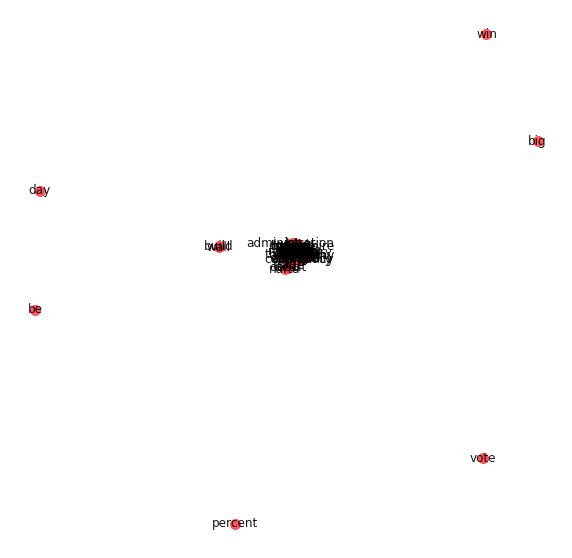

In [81]:
# Visualize this graph 

layout_trump2 = nx.spring_layout(giant2, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant2, ax = ax, pos = layout_trump2, labels = {n:n for n in giant2.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

### Comment/Inference

It seems that after removing words that show up in many speeches, some words like "big", "vote", "be" are on the outside, but we may not get some useful insight from them. One reason for them to be outside may be that they are words with no substantial meanings. 

In [82]:
# check the completely connected sets of nodes

print(', '.join(max(nx.clique.find_cliques(giant2), key = lambda x: len(x))))

people, country, want, clinton, hillary


In [83]:
# check the words directly around "job"

jobNeighbors = giant2.neighbors('job')
g_job = giant2.subgraph(jobNeighbors)
print(nx.info(g_job))

Name: 
Type: Graph
Number of nodes: 9
Number of edges: 17
Average degree:   3.7778


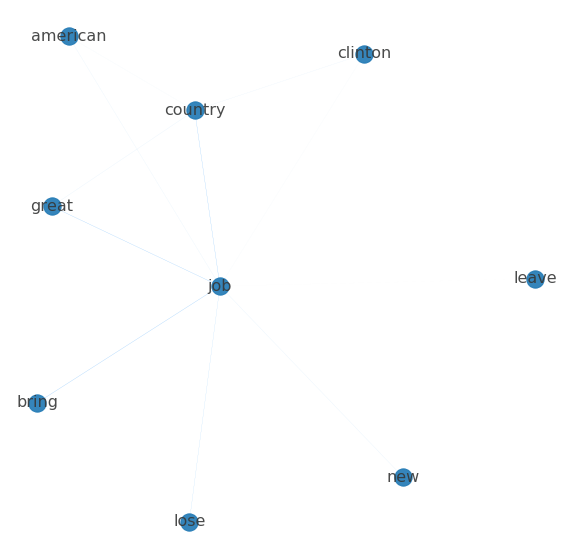

In [84]:
layout_job1 = nx.spring_layout(g_job, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
maxWeight = max((d['weight'] for n1, n2, d in g_job.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_job.edges(data = True)))
nx.draw(g_job, ax = ax, pos = layout_job1, labels = {n:n for n in g_job.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_job.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma')) 

In [85]:
jobNeighbors = gWord_trump.neighbors('job')
jobNeighborsPlus1 = set(jobNeighbors)
for n in jobNeighbors:
    jobNeighborsPlus1 |= set(giant2.neighbors(n))
    
#for x in americanNeighborsPlus1:
#    print(x)

In [86]:
g_job2 = giant2.subgraph(jobNeighborsPlus1)
print(nx.info(g_job2))

Name: 
Type: Graph
Number of nodes: 64
Number of edges: 113
Average degree:   3.5312


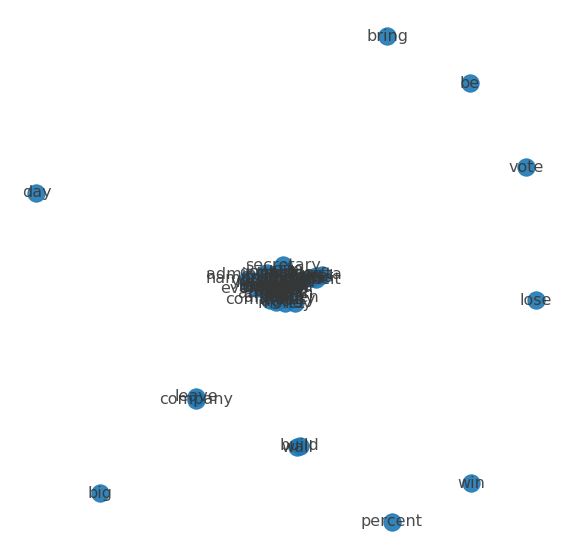

In [87]:
layout_job = nx.spring_layout(g_job2, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
centralities_job = nx.eigenvector_centrality(g_job2)
maxC = max(centralities_job.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in g_job2.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_job2.edges(data = True)))
nx.draw(g_job2, ax = ax, pos = layout_job, labels = {n:n for n in g_job2.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_job2.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma')) 

### Comment/Inference

From the two charts above, we know the words around "job". The first chart, which reveals direct linkage to "job", shows that Trump wants to bring the jobs and create new jobs, which accords to his political promises. In the second chart showing the 1 or 2 level of linkage of "job", we see that words are clustering around "job", and many words are isolated. These isolated words actually more or less have some connections to "job" like the word "lose", "bring", etc.

# Network Statistics
We can often gain more insight into our semantic network through statistics that describe the positions of words within it.

We begin with measures of centrality. The concept of centrality is that some nodes (words or documents) are more *central* to the network than others. The most straightforward is the notion of degree centrality: those nodes that have the highest number of connections are the most central. Here our measure normalizes the number of connections by those with the most connections.

In [88]:
dcentralities = nx.degree_centrality(giant)

In [89]:
dcentralities['american']

0.038216560509554146

In [90]:
sorted(dcentralities.items(), reverse = True, key = lambda x:x[1])

[('health', 0.43312101910828027),
 ('care', 0.21656050955414013),
 ('lender', 0.20382165605095542),
 ('loan', 0.20382165605095542),
 ('child', 0.19745222929936307),
 ('state', 0.1910828025477707),
 ('family', 0.1656050955414013),
 ('cost', 0.15923566878980894),
 ('year', 0.15286624203821658),
 ('program', 0.11464968152866242),
 ('s', 0.11464968152866242),
 ('plan', 0.10828025477707007),
 ('kennedy', 0.09554140127388536),
 ('need', 0.089171974522293),
 ('college', 0.089171974522293),
 ('senator', 0.089171974522293),
 ('student', 0.08280254777070065),
 ('wage', 0.08280254777070065),
 ('medicare', 0.08280254777070065),
 ('act', 0.07643312101910829),
 ('worker', 0.07006369426751592),
 ('bill', 0.07006369426751592),
 ('drug', 0.07006369426751592),
 ('law', 0.06369426751592357),
 ('department', 0.06369426751592357),
 ('high', 0.05732484076433121),
 ('private', 0.05732484076433121),
 ('work', 0.05732484076433121),
 ('minimum', 0.05732484076433121),
 ('coverage', 0.050955414012738856),
 ('educ

In [91]:
max(dcentralities.items(), key = lambda x : x[1])

('health', 0.43312101910828027)

By the way, why do we have .items() here? This is because decentralities is a dictionary.

We can color and size the nodes by betweenness centrality, it's much faster to redraw since we aren't redoing the layout.

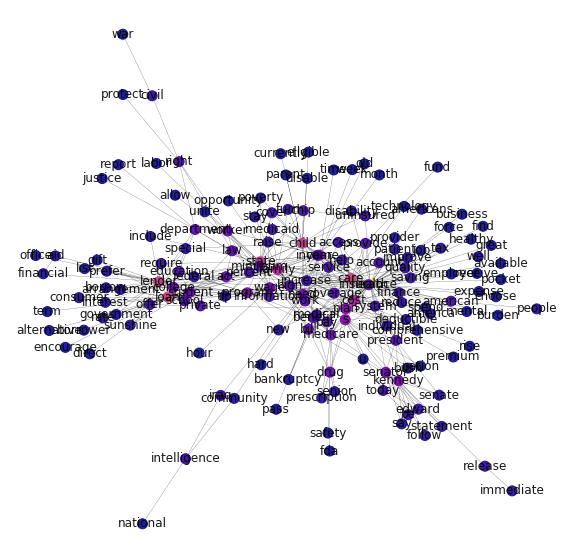

In [92]:
layout = nx.spring_layout(giant, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities.items(), key = lambda x : x[1])[1]
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [dcentralities[n] / maxC for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

Another way to visualize the graph involes the use of size to represent degree centrality and edge weight:

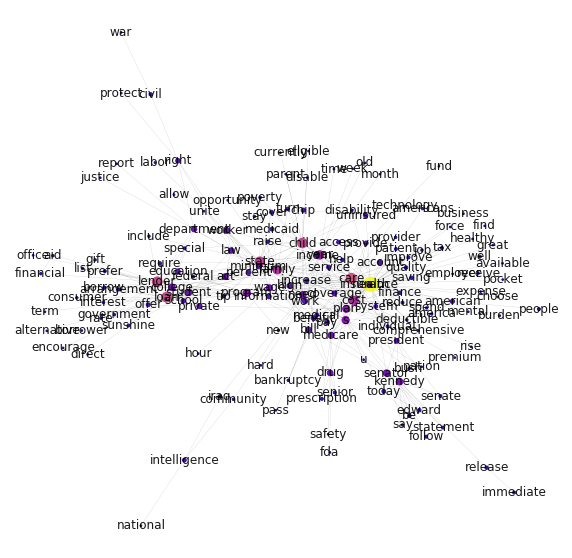

In [93]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gWord.edges(data = True)], 
        alpha = .9, 
        node_color = [dcentralities[n] / maxC for n in giant.nodes],
        node_size = [dcentralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

The distrubution of degree centrality is:

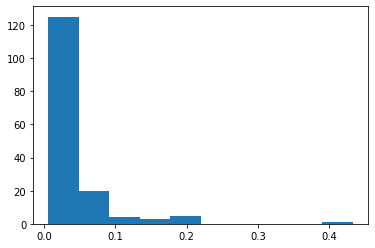

In [94]:
plt.hist(list(dcentralities.values()))
plt.show()

What are the top and bottom ten words in terms of degree?

In [95]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.43312101910828027),
 ('care', 0.21656050955414013),
 ('lender', 0.20382165605095542),
 ('loan', 0.20382165605095542),
 ('child', 0.19745222929936307),
 ('state', 0.1910828025477707),
 ('family', 0.1656050955414013),
 ('cost', 0.15923566878980894),
 ('year', 0.15286624203821658),
 ('program', 0.11464968152866242)]

In [96]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('force', 0.006369426751592357),
 ('eligible', 0.006369426751592357),
 ('pocket', 0.006369426751592357),
 ('available', 0.006369426751592357),
 ('national', 0.006369426751592357),
 ('currently', 0.006369426751592357),
 ('hard', 0.006369426751592357),
 ('nation', 0.006369426751592357),
 ('fda', 0.006369426751592357),
 ('direct', 0.006369426751592357)]

Consider another very different measure, which is *betweenness* centrality. Betweenness centrality distinguishes nodes that require the most shortest pathways between all other nodes in the network. Semantically, words with a high betweenness centrality may link distinctive domains, rather than being "central" to any one. In other words, high *betweenness centrality* nodes may not have the highest *degree centrality*.

In [97]:
centralities = nx.betweenness.betweenness_centrality(giant)

In [98]:
centralities['american']

0.012738853503184714

In [99]:
max(centralities.items(), key = lambda x : x[1])

('health', 0.42036210248253647)

We can color and size the nodes by betweenness centrality:

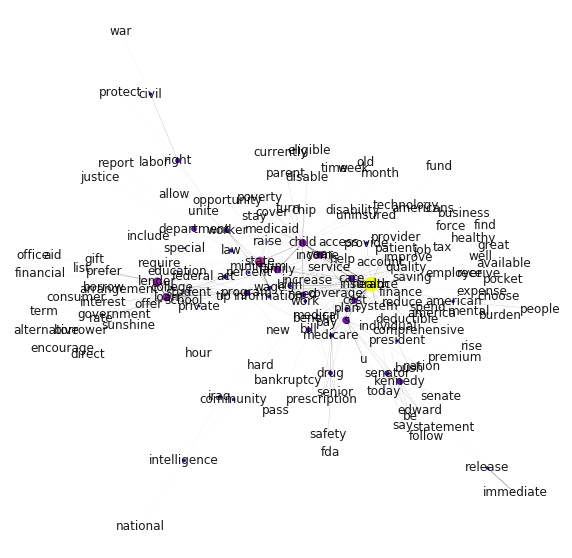

In [100]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

The distrubution of betweenness centrality is:

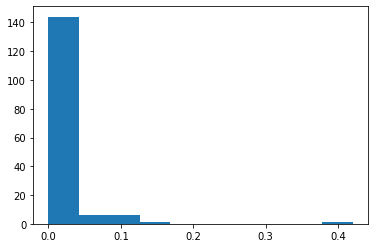

In [101]:
plt.hist(list(centralities.values()))
plt.show()

This is an exponential distrubution, but you might need to add more nodes to see it clearly.

What are the top ten words in terms of betweenness?

In [102]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.43312101910828027),
 ('care', 0.21656050955414013),
 ('lender', 0.20382165605095542),
 ('loan', 0.20382165605095542),
 ('child', 0.19745222929936307),
 ('state', 0.1910828025477707),
 ('family', 0.1656050955414013),
 ('cost', 0.15923566878980894),
 ('year', 0.15286624203821658),
 ('program', 0.11464968152866242)]

Here it appears that "health"/"care", "family"/"children" are key concepts that connect others in the broader network. This is interesting in that they seem to be domain-specific rather than linking words like "state".

What are words lower down?

In [103]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[50:60]

[('medicaid', 0.03184713375796178),
 ('today', 0.03184713375796178),
 ('medical', 0.03184713375796178),
 ('intelligence', 0.03184713375796178),
 ('access', 0.03184713375796178),
 ('be', 0.025477707006369428),
 ('saving', 0.025477707006369428),
 ('require', 0.025477707006369428),
 ('iraq', 0.025477707006369428),
 ('raise', 0.025477707006369428)]

We can also look at closeness centrality, or the average Euclidean or path distance between a node and all others in the network. A node with the highest closeness centrality is most likely to send a signal with the most coverage to the rest of the network.

In [104]:
centralities = nx.closeness_centrality(giant)

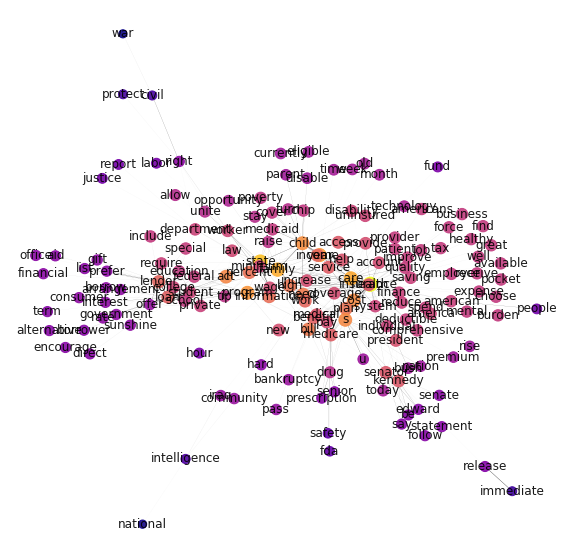

In [105]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

Top and bottom:

In [106]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.5508771929824562),
 ('state', 0.5048231511254019),
 ('family', 0.4845679012345679),
 ('care', 0.4801223241590214),
 ('year', 0.4658753709198813),
 ('program', 0.46176470588235297),
 ('child', 0.4563953488372093),
 ('cost', 0.4511494252873563),
 ('s', 0.44857142857142857),
 ('act', 0.4472934472934473)]

In [107]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('report', 0.26837606837606837),
 ('people', 0.26610169491525426),
 ('safety', 0.25363489499192243),
 ('fda', 0.25363489499192243),
 ('intelligence', 0.2353823088455772),
 ('civil', 0.22753623188405797),
 ('protect', 0.22687861271676302),
 ('immediate', 0.22081575246132207),
 ('national', 0.19076549210206561),
 ('war', 0.18557919621749408)]

Or eignvector centrality, an approach that weights degree by the centrality of those to whom one is tied (and the degree to whom they are tied, etc.) In short, its an $n$th order degree measure.

In [108]:
centralities = nx.eigenvector_centrality(giant)

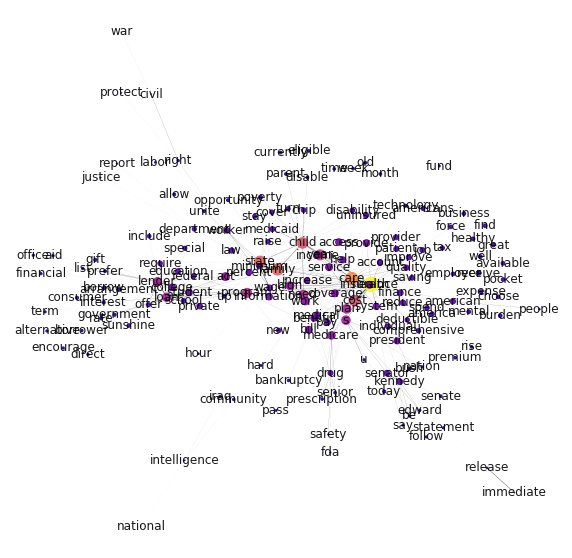

In [109]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

Note how the colors reveal a much more graduate distribution here. Let's look at it directly.

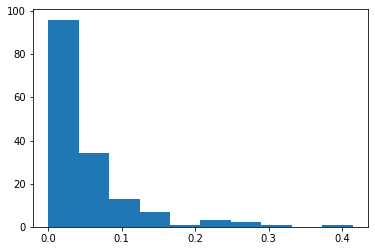

In [110]:
plt.hist(list(centralities.values()))
plt.show()

Top and bottom:

In [111]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.41421797822651263),
 ('care', 0.2977697413193448),
 ('family', 0.2502951111949895),
 ('state', 0.24969793403288462),
 ('child', 0.22995111817868857),
 ('cost', 0.21729639645054502),
 ('year', 0.21491308448333515),
 ('program', 0.17137587976970214),
 ('need', 0.16062048482015306),
 ('plan', 0.1533942472000899)]

In [112]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('safety', 0.0037606774496355038),
 ('fda', 0.0037606774496355038),
 ('justice', 0.002536534495916524),
 ('report', 0.002536534495916524),
 ('intelligence', 0.0017995098835093789),
 ('civil', 0.0008701062371919273),
 ('protect', 0.0008046732394885573),
 ('immediate', 0.00038960838254329045),
 ('national', 0.00012643460042104817),
 ('war', 6.113716692984287e-05)]

We can now filter our network by a centrality measure. Let's define a function and experiment with it:

In [113]:
def filterWords(G, minWeight = 3, filter_ = "betweenness", rule = "number", value_of_rule = 200):
    """Function to filter network by degree centrality measures"""
    G = G.copy()
    try:
        G.remove_edges_from([(n1,n2) for n1, n2, d in G.edges(data = True) if d['weight'] < minWeight])
    except:
        print("weight might be missing from one or more edges")
        raise
    if filter_ =="betweenness":
        index = nx.betweenness_centrality(G) #betweeness centrality score
    elif filter_ == "closeness":
        index = nx.closeness_centrality(G) #closeness centrality score
    elif filter_ == "eigenvector":
        index = nx.eigenvector_centrality(G) #eigenvector centrality score
    elif filter_ == "degree":
        index = nx.degree_centrality(G) #degree centrality score
    else:
        raise ValueError("wrong filter paremeter, should be: betweenness/closeness/eigenvector")    
        
    if rule=='number':# if filter by limiting the total number of nodes 
        
        sorted_index = sorted(index.items(), key=lambda x:x[1], reverse=True)
        value_of_rule = np.min([value_of_rule, len(G.nodes)])
        
        nodes_remain = {}
        for word, centr in sorted_index[:value_of_rule]:
            nodes_remain[word] = centr
        G.remove_nodes_from([n for n in index if n not in nodes_remain])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='above':# if filter by limiting the min value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] >=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='below':# if filter by limiting the max value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] <=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G

In [114]:
giant_filtered30 = filterWords(giant, minWeight=3, filter_='betweenness', rule='number', value_of_rule=25)
print(nx.info(giant_filtered30))

Total number of nodes(after filtering) in the graph is 25
Name: 
Type: Graph
Number of nodes: 25
Number of edges: 122
Average degree:   9.7600


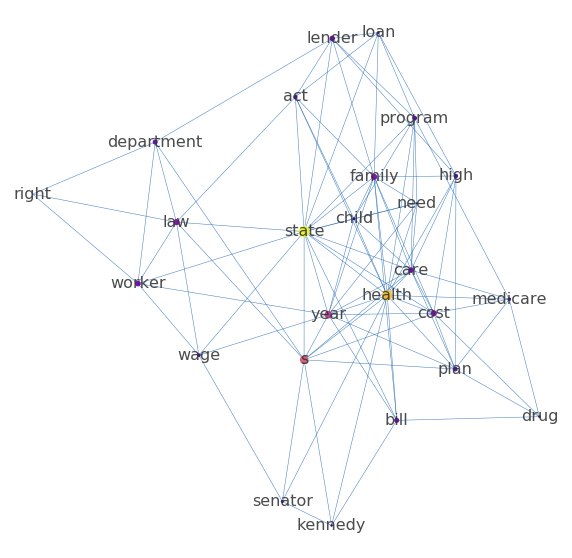

In [115]:
layout_giant_filtered30 = nx.spring_layout(giant_filtered30, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_giant30 = nx.betweenness_centrality(giant_filtered30)
maxC = max(centralities_giant30.items(), key = lambda x : x[1])[1]
nx.draw(giant_filtered30, ax = ax, pos = layout_giant_filtered30, labels = {n: n for n in giant_filtered30.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_giant30[n] / maxC for n in giant_filtered30.nodes],
        node_size = [centralities_giant30[n] / maxC * 100 for n in giant_filtered30.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

We can also look at global statistics, like the density of a network, defined as the number of actual edges divided by the total number of possible edges:

In [116]:
nx.density(giant)

0.03692655002821898

We can also calculate the average degree per node:

In [117]:
np.mean([v for w,v in nx.degree(giant)])

5.7974683544303796

The diameter calculates the average distance between any two nodes in the network:

In [118]:
nx.diameter(giant)

8

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">Construct cells immediately below this that calculate different kinds of centrality for distinct words or documents in a network composed from your corpus of interest. Which type of words tend to be most and least central? Can you identify how different centrality measures distinguish different kind of words in your corpus? What do these patterns suggest about the semantic content and structure of your documents? Finally, calculate global measure for your network(s) and discuss what they reveal.

In [119]:
# I here modify the previous giant to include a wider range of words by lowering the bar of weight

g_trump=wordCooccurrence(trump_df['normalized_sents'].sum())
print(len(g_trump))
g_trump.remove_edges_from([(n1, n2) for n1, n2, d in g_trump.edges(data = True) if d['weight'] <= 30]) # lower the bar of weight to 30
g_trump.remove_nodes_from(list(nx.isolates(g))) #since we are changing the graph list() evaluates the isolates first

def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)

giant_trump = max(connected_component_subgraphs(g_trump), key=len) # keep just the giant connected component
print(nx.info(giant_trump))

5922
Name: 
Type: Graph
Number of nodes: 378
Number of edges: 1569
Average degree:   8.3016


In [120]:
# calc the degree centrality

dcentralities_trump = nx.degree_centrality(giant_trump)

In [121]:
# check the degree centrality of "job" as we focus before

dcentralities_trump['job']

0.21220159151193632

In [122]:
# check the ranking of words by degree centrality

sorted(dcentralities_trump.items(), reverse = True, key = lambda x:x[1])

[('go', 0.4960212201591512),
 ('people', 0.29973474801061006),
 ('country', 0.29442970822281167),
 ('job', 0.21220159151193632),
 ('hillary', 0.1989389920424403),
 ('want', 0.18037135278514588),
 ('clinton', 0.16710875331564987),
 ('great', 0.16180371352785144),
 ('know', 0.15649867374005305),
 ('say', 0.14058355437665782),
 ('have', 0.1326259946949602),
 ('american', 0.11671087533156498),
 ('state', 0.10875331564986737),
 ('be', 0.09283819628647215),
 ('percent', 0.09018567639257294),
 ('like', 0.09018567639257294),
 ('deal', 0.09018567639257294),
 ('time', 0.08488063660477453),
 ('think', 0.08488063660477453),
 ('get', 0.08222811671087532),
 ('year', 0.07692307692307691),
 ('come', 0.07427055702917772),
 ('world', 0.0716180371352785),
 ('look', 0.0716180371352785),
 ('new', 0.0716180371352785),
 ('$', 0.06896551724137931),
 ('thing', 0.0663129973474801),
 ('right', 0.0663129973474801),
 ('trade', 0.0636604774535809),
 ('win', 0.06100795755968169),
 ('lot', 0.05835543766578249),
 ('bo

In [123]:
max(dcentralities_trump.items(), key = lambda x : x[1])

('go', 0.4960212201591512)

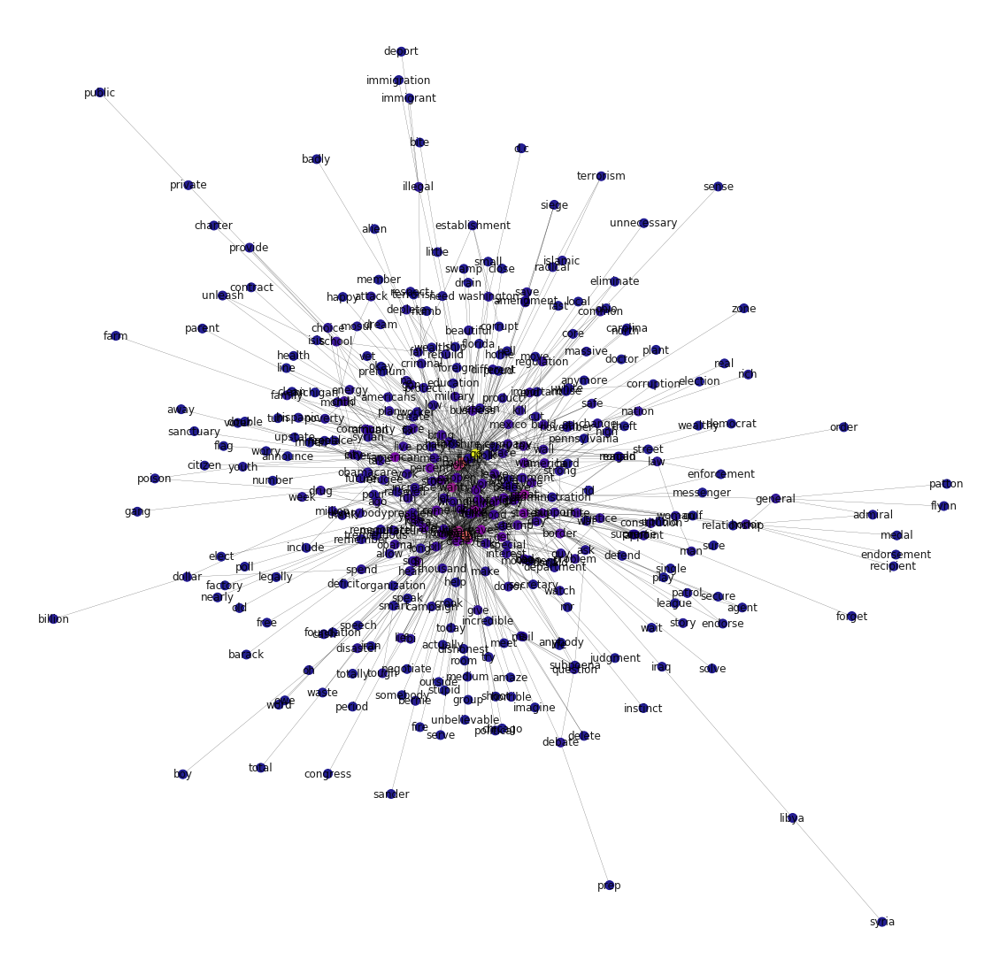

In [124]:
# visualize the plot with degree centrality

layout_trump = nx.spring_layout(giant_trump, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (20,20))
maxC = max(dcentralities_trump.items(), key = lambda x : x[1])[1]
nx.draw(giant_trump, ax = ax, pos = layout_trump, labels = {n:n for n in giant_trump.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [dcentralities_trump[n] / maxC for n in giant_trump.nodes],
        cmap = plt.get_cmap('plasma')) 

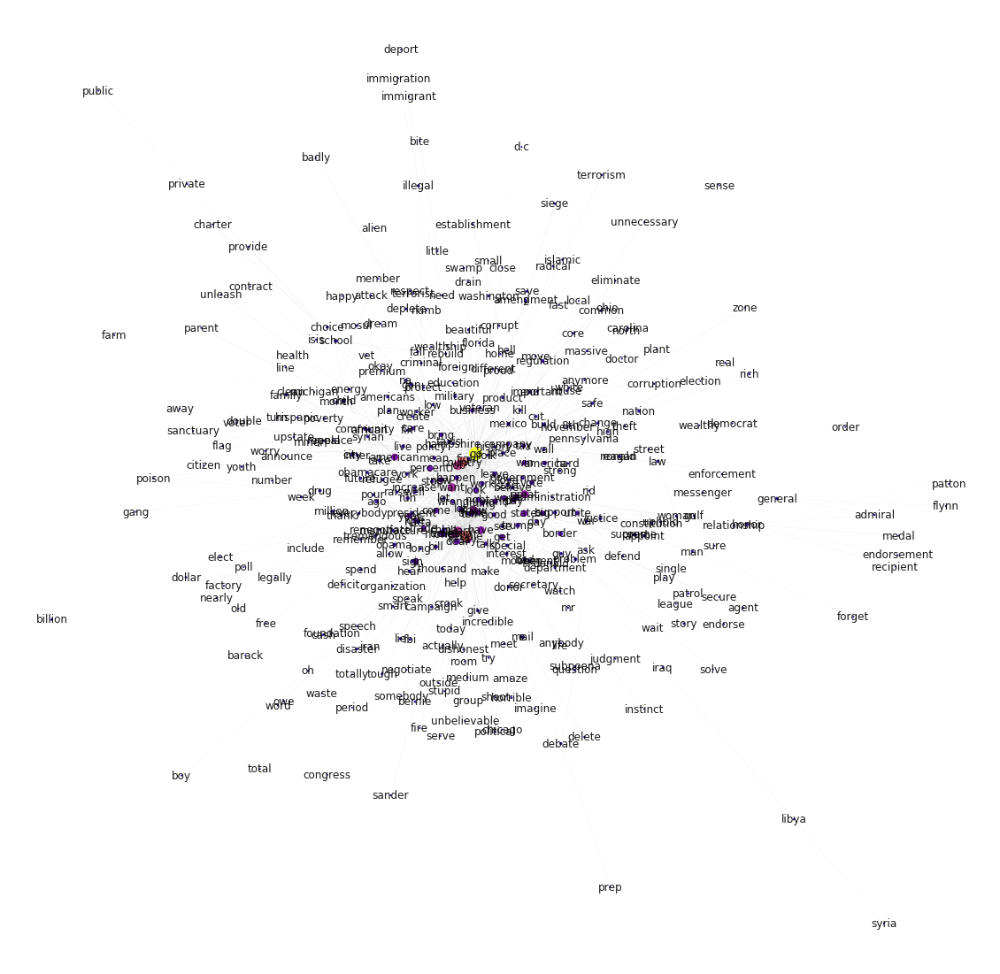

In [125]:
# another approach to plot with the use of size to represent degree centrality and edge weight

fig, ax = plt.subplots(figsize = (20,20))
maxC = max(dcentralities_trump.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant_trump.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant_trump.edges(data = True)))
nx.draw(giant_trump, ax = ax, pos = layout_trump, labels = {n:n for n in giant_trump.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gWord_trump.edges(data = True)], 
        alpha = .9, 
        node_color = [dcentralities_trump[n] / maxC for n in giant_trump.nodes],
        node_size = [dcentralities_trump[n] / maxC * 200 for n in giant_trump.nodes],
        cmap = plt.get_cmap('plasma')) 

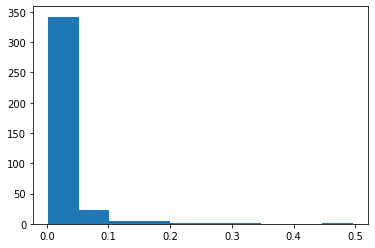

In [126]:
# check the distribution of degree centrality

plt.hist(list(dcentralities_trump.values()))
plt.show()

In [127]:
# top 10 words in terms of degree centrality

sorted(dcentralities_trump.items(), key = lambda x: x[1], reverse = True)[:10]

[('go', 0.4960212201591512),
 ('people', 0.29973474801061006),
 ('country', 0.29442970822281167),
 ('job', 0.21220159151193632),
 ('hillary', 0.1989389920424403),
 ('want', 0.18037135278514588),
 ('clinton', 0.16710875331564987),
 ('great', 0.16180371352785144),
 ('know', 0.15649867374005305),
 ('say', 0.14058355437665782)]

In [128]:
# bottom 10 words in terms of degree centrality

sorted(dcentralities_trump.items(), key = lambda x: x[1], reverse = True)[-10:]

[('miner', 0.002652519893899204),
 ('play', 0.002652519893899204),
 ('serve', 0.002652519893899204),
 ('flynn', 0.002652519893899204),
 ('sense', 0.002652519893899204),
 ('close', 0.002652519893899204),
 ('doctor', 0.002652519893899204),
 ('league', 0.002652519893899204),
 ('election', 0.002652519893899204),
 ('boy', 0.002652519893899204)]

### Comment/Inference

The metric of degree centrality comfirms that the most "central" word is still "go", and just around "go" are the quite frequent words Trump would use like 'america', 'again', 'say', etc. It seems that Trump really likes basic words to deliver his ideas. 

The distribution of centrality makes sense, as it shows exponential trends. 

For the top 10 words, we see that "country", "people" and "job" may be the key conceptions to connect other topics in the broad network, and one thing to notice is that "hillary clinton" are in the list, indicating that Hillary Clinton is among the most common topics in Trump's speech and is linked to many topics in the speech. For the bottom 10 words, it seems a bit surprising for the word "citizen" as I personally think that it should have been mentioned more and more closed to the center but not on the outside in the speeches. 

Also, we can get some insight of the semantic structures in the speeches. It seems that basic verbs like "go", 'want', 'know', 'say' are in the central circle, and then follows some basic nouns ('people','country'), names ('clinton')and popoular topics like "job", 'obamacare' in a larger circle, and then follows other relevant words in the even larger circle. It actually makes sense for speech, as speech itself is quite colloquial, especially for Trump. Therefore, basic verbs and nouns act as the linkage of events and ideas and they together form the structure of the speech.

In [129]:
# for the betweenness centrality

centralities_trump = nx.betweenness.betweenness_centrality(giant_trump)

In [130]:
# still check "job"

centralities_trump['job']

0.055580093203260794

In [131]:
# check the word with the highest betweenness centrality

max(centralities_trump.items(), key = lambda x : x[1])

('go', 0.4498026574722905)

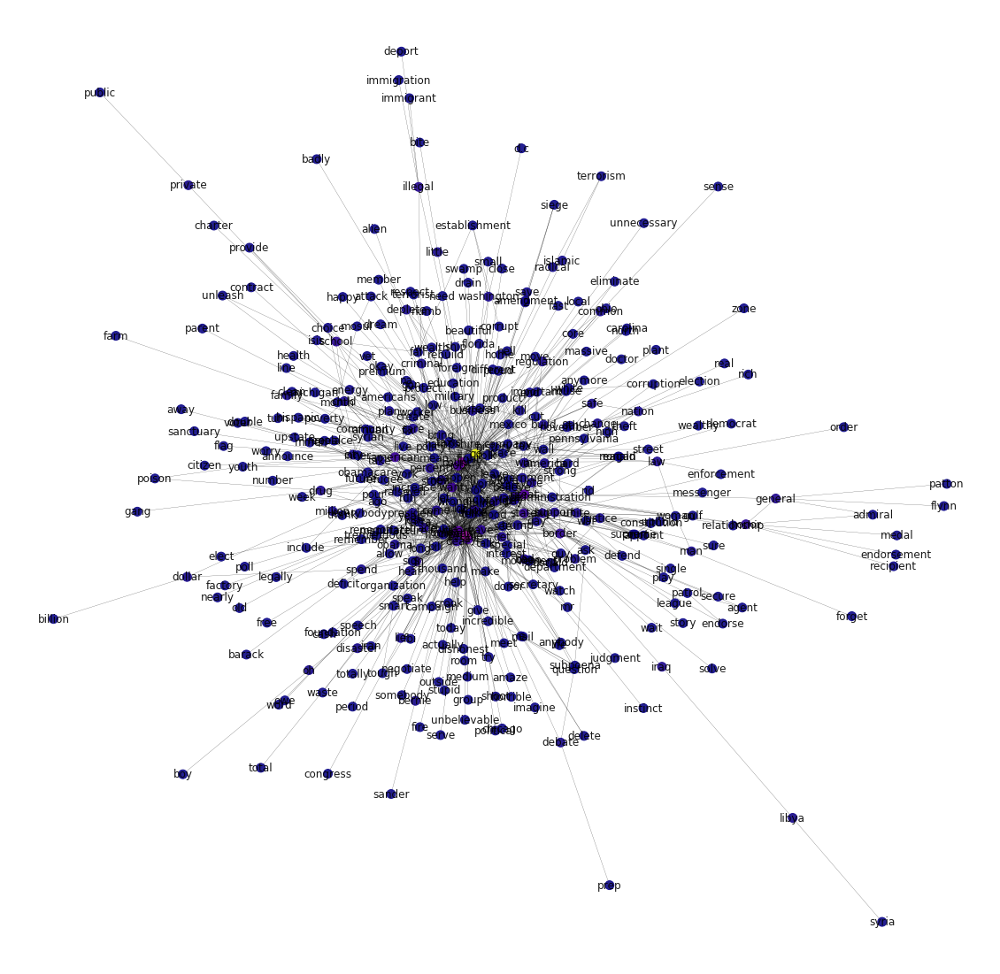

In [132]:
# plot based on betweenness centrality

fig, ax = plt.subplots(figsize = (20,20))
maxC = max(centralities_trump.items(), key = lambda x : x[1])[1]
nx.draw(giant_trump, ax = ax, pos = layout_trump, labels = {n:n for n in giant_trump.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [centralities_trump[n] / maxC for n in giant_trump.nodes],
        cmap = plt.get_cmap('plasma'))

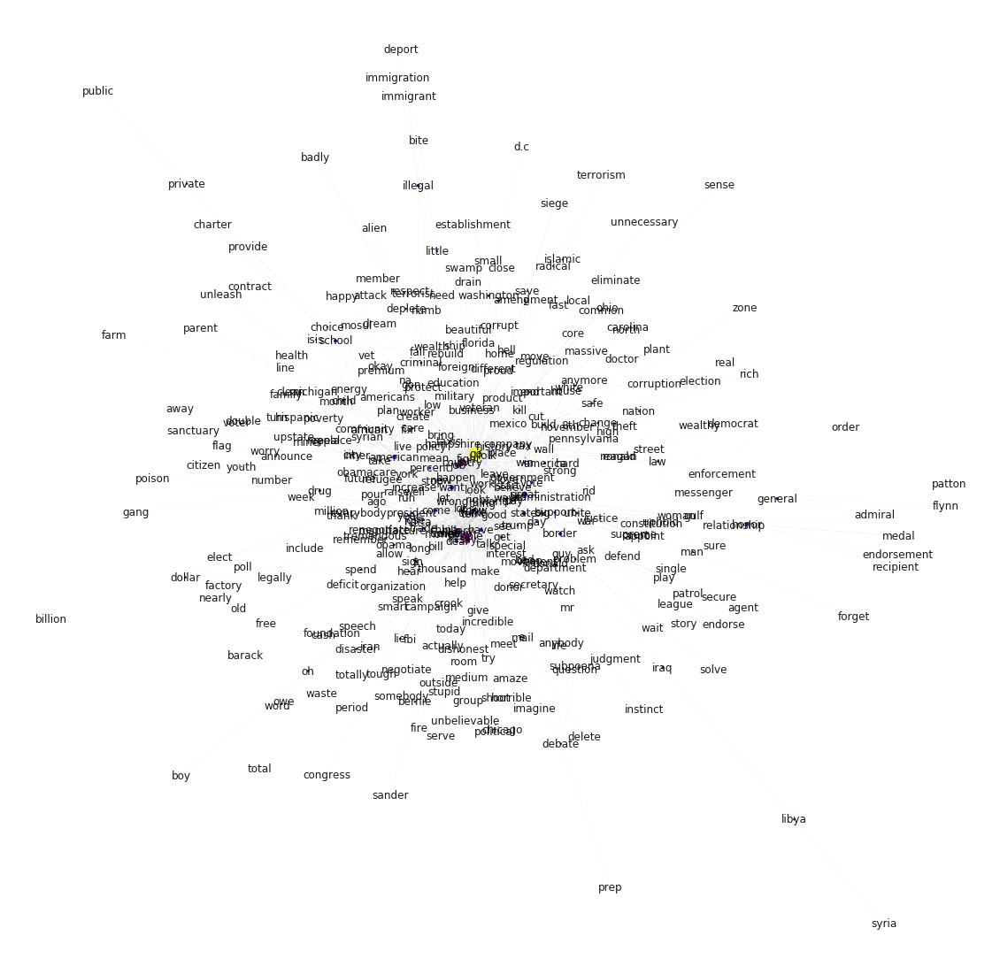

In [133]:
# another approach to plot with the use of size to represent degree centrality and edge weight based on betweenness centrality

fig, ax = plt.subplots(figsize = (20,20))
maxC = max(centralities_trump.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant_trump.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant_trump.edges(data = True)))
nx.draw(giant_trump, ax = ax, pos = layout_trump, labels = {n:n for n in giant_trump.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gWord_trump.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_trump[n] / maxC for n in giant_trump.nodes],
        node_size = [centralities_trump[n] / maxC * 200 for n in giant_trump.nodes],
        cmap = plt.get_cmap('plasma')) 

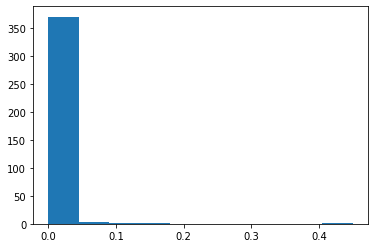

In [134]:
# check the distribution of betweenness centrality

plt.hist(list(centralities_trump.values()))
plt.show()

In [135]:
# check the top 10 words based on betweenness centrality

sorted(centralities_trump.items(), key = lambda x: x[1], reverse = True)[:10]

[('go', 0.4498026574722905),
 ('people', 0.15258384613529458),
 ('country', 0.1293557140204724),
 ('hillary', 0.06929458270511452),
 ('great', 0.06645370158792772),
 ('job', 0.055580093203260794),
 ('clinton', 0.04795710015942715),
 ('say', 0.044918517134725694),
 ('american', 0.03933197153503615),
 ('want', 0.03885063547762995)]

In [136]:
# check the bottom 10 words based on betweenness centrality

sorted(centralities_trump.items(), key = lambda x: x[1], reverse = True)[-10:]

[('flynn', 0.0),
 ('sense', 0.0),
 ('close', 0.0),
 ('story', 0.0),
 ('doctor', 0.0),
 ('worker', 0.0),
 ('league', 0.0),
 ('thank', 0.0),
 ('election', 0.0),
 ('boy', 0.0)]

### Comment/Inference

The analysis based on the betweenness centrality has similar result comparied to the degree centrality, as they have similar top and bottom 10 words based on the score. The words like "go", "people", etc. are still on the list. Also,  the colors in graph and the charts are similar with degree centrality. Note that the word "american" become the top 10 word here, indicating that this word has linked to many distinct domains although its degree centrality is not that high. It makes sense, as "american" could act as adjective to modify many kinds of nouns in speeches.

In [137]:
# check the closeness centrality

centralities_trump_close = nx.closeness_centrality(giant_trump)

In [138]:
# still check "job"

centralities_trump_close['job']

0.5150273224043715

In [139]:
max(centralities_trump_close.items(), key = lambda x : x[1])

('go', 0.6389830508474577)

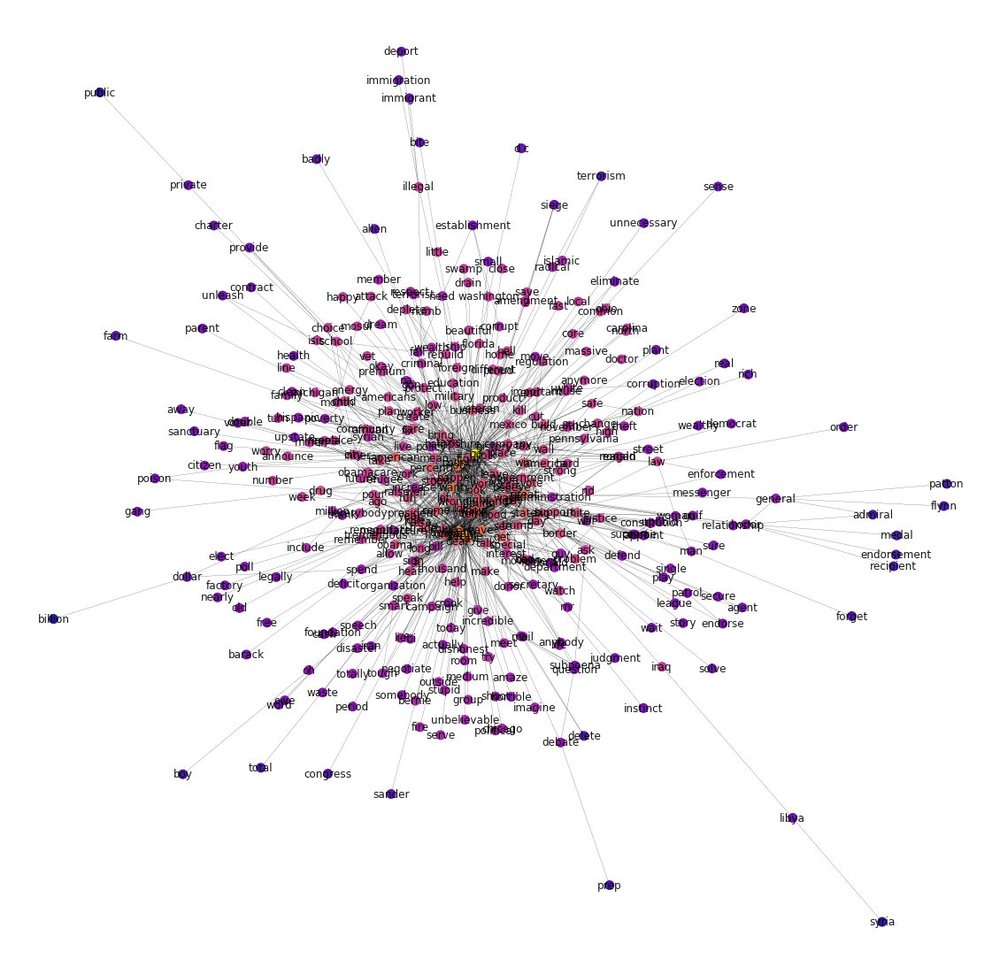

In [140]:
# plot based on closeness centrality

fig, ax = plt.subplots(figsize = (20,20))
maxC = max(centralities_trump_close.items(), key = lambda x : x[1])[1]
nx.draw(giant_trump, ax = ax, pos = layout_trump, labels = {n:n for n in giant_trump.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [centralities_trump_close[n] / maxC for n in giant_trump.nodes],
        cmap = plt.get_cmap('plasma'))

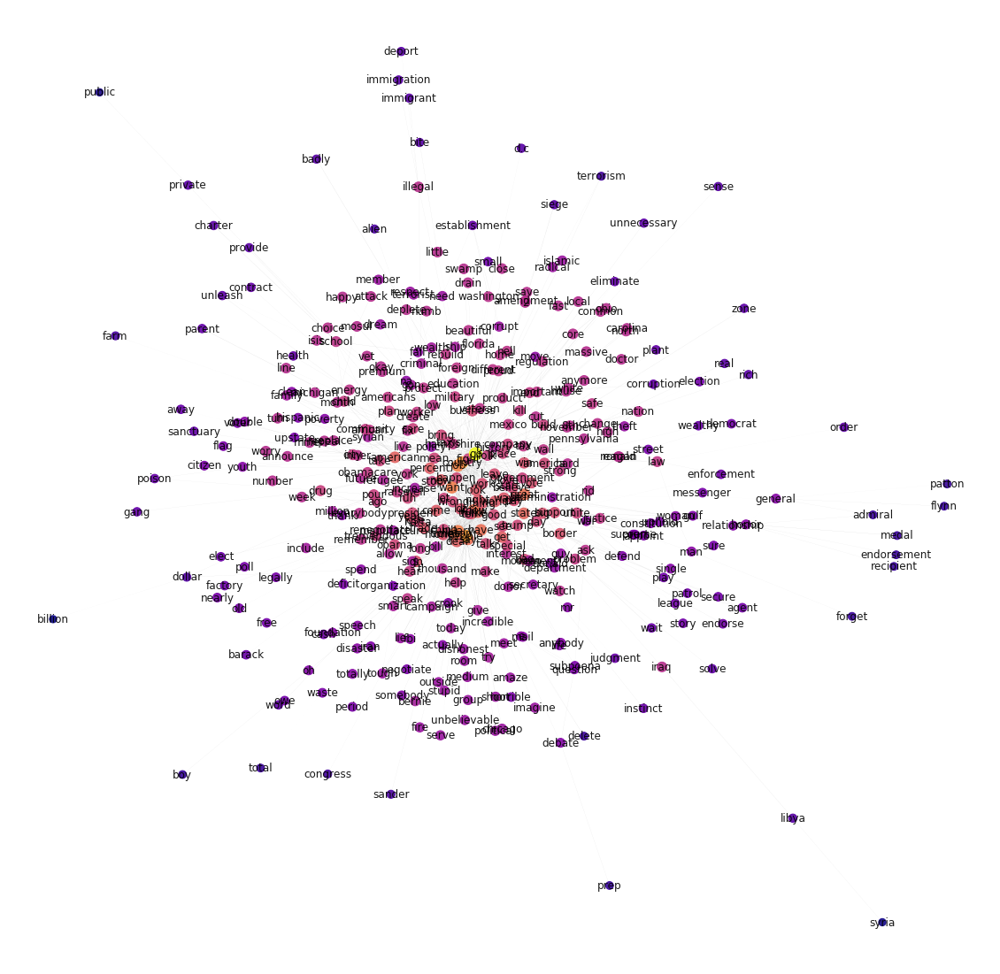

In [141]:
# another approach to plot with the use of size to represent degree centrality and edge weight based on closeness centrality

fig, ax = plt.subplots(figsize = (20,20))
maxC = max(centralities_trump_close.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant_trump.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant_trump.edges(data = True)))
nx.draw(giant_trump, ax = ax, pos = layout_trump, labels = {n:n for n in giant_trump.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gWord_trump.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_trump_close[n] / maxC for n in giant_trump.nodes],
        node_size = [centralities_trump_close[n] / maxC * 200 for n in giant_trump.nodes],
        cmap = plt.get_cmap('plasma')) 

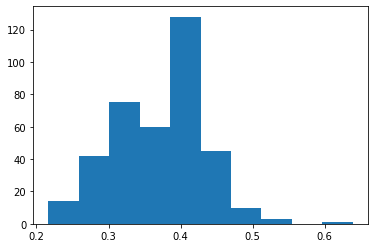

In [142]:
# check the distribution of closeness centrality

plt.hist(list(centralities_trump_close.values()))
plt.show()

In [143]:
# check the top 10 words based on closeness centrality

sorted(centralities_trump_close.items(), key = lambda x: x[1], reverse = True)[:10]

[('go', 0.6389830508474577),
 ('country', 0.5471698113207547),
 ('people', 0.5471698113207547),
 ('job', 0.5150273224043715),
 ('want', 0.5053619302949062),
 ('hillary', 0.5053619302949062),
 ('know', 0.49345549738219896),
 ('clinton', 0.49345549738219896),
 ('great', 0.4908854166666667),
 ('have', 0.4883419689119171)]

In [144]:
# check the bottom 10 words based on closeness centrality

sorted(centralities_trump_close.items(), key = lambda x: x[1], reverse = True)[-10:]

[('endorsement', 0.25166889185580776),
 ('recipient', 0.25166889185580776),
 ('forget', 0.25133333333333335),
 ('patton', 0.24966887417218542),
 ('flynn', 0.24966887417218542),
 ('prep', 0.24802631578947368),
 ('boy', 0.2473753280839895),
 ('public', 0.22334123222748814),
 ('syria', 0.22021028037383178),
 ('billion', 0.21654221711659966)]

### Comment/Inference

From the analysis above we can see that the bottom of closeness centrality score is much higher than the previous two centrality metrics , with the lowest score still about 0.2165. It also affects the distribution, as it is not as exponential as before. The color changes in the graph shows a more gradual distribution, which accords to the distribution chart. The top 10 words are still similar to previous ones, while the bottom 10 words are almost different from before. The reason is that these words are least likely to send a signal with the most coverage to the rest of the network, although they may have good degree and betweenness centrality.

In [145]:
# for the eigenvector centrality

centralities_trump_eig = nx.eigenvector_centrality(giant_trump)

In [146]:
# still check "job"

centralities_trump_eig['job']

0.20931438288512386

In [147]:
max(centralities_trump_eig.items(), key = lambda x : x[1])

('go', 0.3035125842296808)

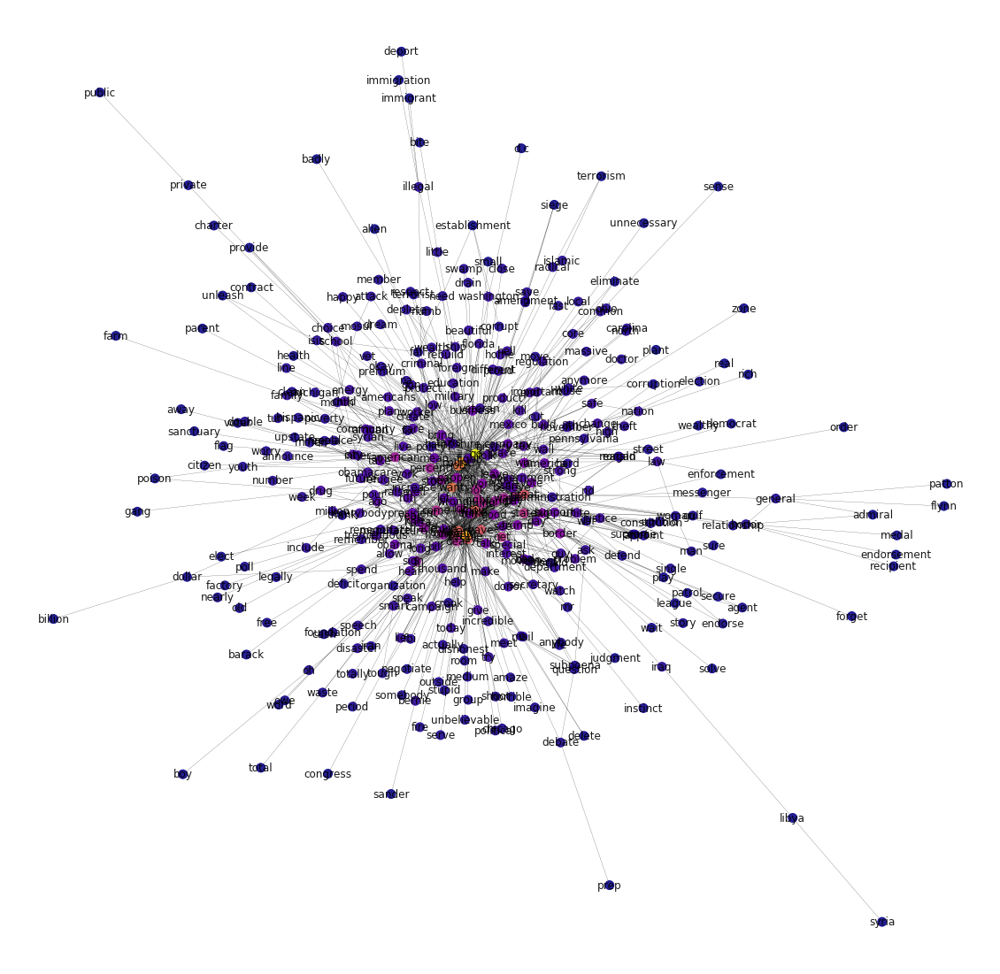

In [148]:
# plot based on eigenvector centrality

fig, ax = plt.subplots(figsize = (20,20))
maxC = max(centralities_trump_eig.items(), key = lambda x : x[1])[1]
nx.draw(giant_trump, ax = ax, pos = layout_trump, labels = {n:n for n in giant_trump.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [centralities_trump_eig[n] / maxC for n in giant_trump.nodes],
        cmap = plt.get_cmap('plasma'))

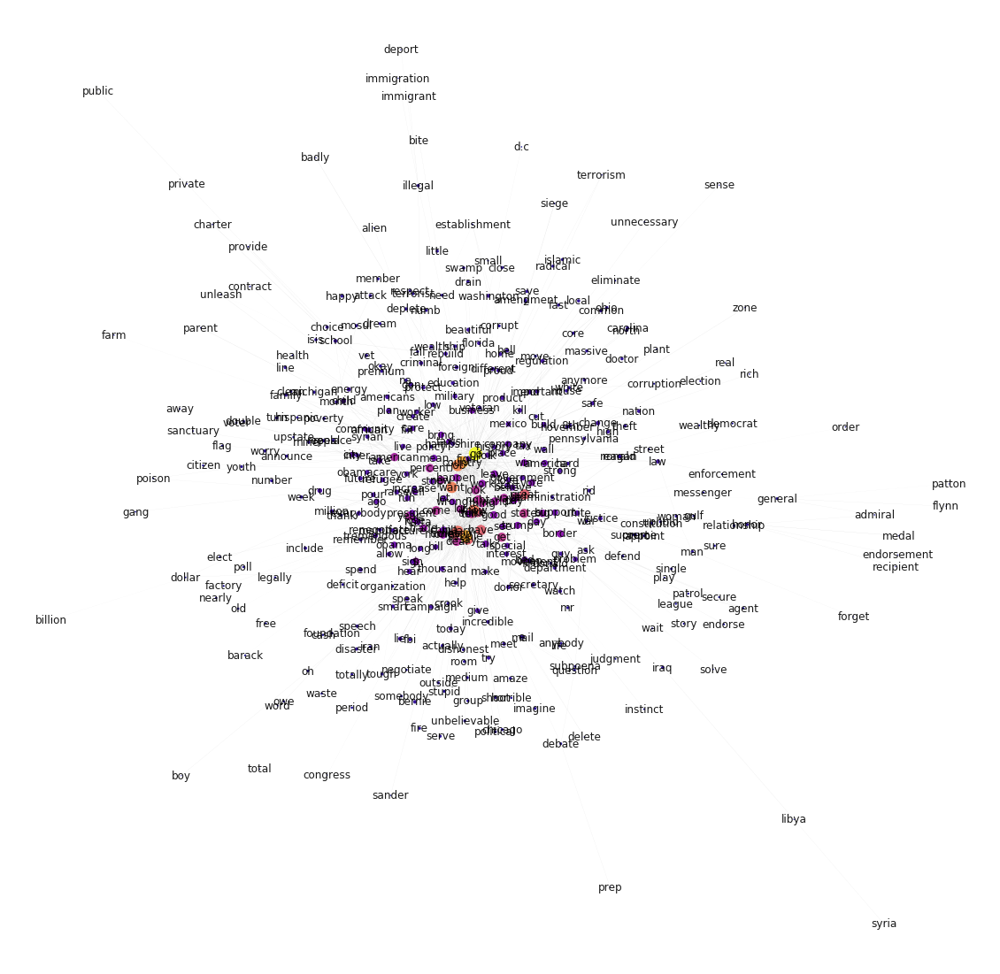

In [149]:
# another approach to plot with the use of size to represent degree centrality and edge weight based on closeness centrality

fig, ax = plt.subplots(figsize = (20,20))
maxC = max(centralities_trump_eig.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant_trump.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant_trump.edges(data = True)))
nx.draw(giant_trump, ax = ax, pos = layout_trump, labels = {n:n for n in giant_trump.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gWord_trump.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_trump_eig[n] / maxC for n in giant_trump.nodes],
        node_size = [centralities_trump_eig[n] / maxC * 200 for n in giant_trump.nodes],
        cmap = plt.get_cmap('plasma')) 

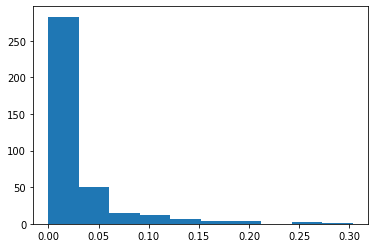

In [150]:
# check the distribution of eigenvector centrality

plt.hist(list(centralities_trump_eig.values()))
plt.show()

In [151]:
# check the top 10 words based on eigenvector centrality

sorted(centralities_trump_eig.items(), key = lambda x: x[1], reverse = True)[:10]

[('go', 0.3035125842296808),
 ('people', 0.250590645267397),
 ('country', 0.24929256078535336),
 ('job', 0.20931438288512386),
 ('want', 0.2038378156097037),
 ('know', 0.19846899537024715),
 ('hillary', 0.18801191716277388),
 ('say', 0.17536634550876),
 ('have', 0.17366840565570268),
 ('great', 0.172361020850686)]

In [152]:
# check the bottom 10 words based on eigenvector centrality

sorted(centralities_trump_eig.items(), key = lambda x: x[1], reverse = True)[-10:]

[('libya', 0.00032925822598080213),
 ('bite', 0.00032890133626889835),
 ('forget', 0.00025663346443137095),
 ('patton', 0.00020578099662269463),
 ('flynn', 0.00020578099662269463),
 ('prep', 0.0002032563824683238),
 ('boy', 0.00019002405009305317),
 ('billion', 4.3003251611275395e-05),
 ('public', 1.9205637182085615e-05),
 ('syria', 1.0831798941039962e-05)]

### Comment/Inference

From the analysis above we can see that the top 10 words based on are still those words like "go", "people", etc. which are similar to previous ones. The bottom ten words are a bit different from previous ones. 

It leads me to have a general comparison among 4 metrics of centrality and I would like to conclude that those top words are with no doubt in the center, as they are always on the top list based on different metrics of centrality. The graphs and their color changes also show that. The distribution here is quite exponential.  

In [153]:
# exercise the filter by centrality measures

def filterWords(G, minWeight = 3, filter_ = "betweenness", rule = "number", value_of_rule = 200):
    """Function to filter network by degree centrality measures"""
    G = G.copy()
    try:
        G.remove_edges_from([(n1,n2) for n1, n2, d in G.edges(data = True) if d['weight'] < minWeight])
    except:
        print("weight might be missing from one or more edges")
        raise
    if filter_ =="betweenness":
        index = nx.betweenness_centrality(G) #betweeness centrality score
    elif filter_ == "closeness":
        index = nx.closeness_centrality(G) #closeness centrality score
    elif filter_ == "eigenvector":
        index = nx.eigenvector_centrality(G) #eigenvector centrality score
    elif filter_ == "degree":
        index = nx.degree_centrality(G) #degree centrality score
    else:
        raise ValueError("wrong filter paremeter, should be: betweenness/closeness/eigenvector")    
        
    if rule=='number':# if filter by limiting the total number of nodes 
        
        sorted_index = sorted(index.items(), key=lambda x:x[1], reverse=True)
        value_of_rule = np.min([value_of_rule, len(G.nodes)])
        
        nodes_remain = {}
        for word, centr in sorted_index[:value_of_rule]:
            nodes_remain[word] = centr
        G.remove_nodes_from([n for n in index if n not in nodes_remain])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='above':# if filter by limiting the min value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] >=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='below':# if filter by limiting the max value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] <=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G

In [154]:
# try value of rule as 25, midweight as 3, rule as number, and filter as closeness

giant_trump_filtered = filterWords(giant_trump, minWeight=3, filter_='closeness', rule='number', value_of_rule=25)
print(nx.info(giant_trump_filtered))

Total number of nodes(after filtering) in the graph is 25
Name: 
Type: Graph
Number of nodes: 25
Number of edges: 258
Average degree:  20.6400


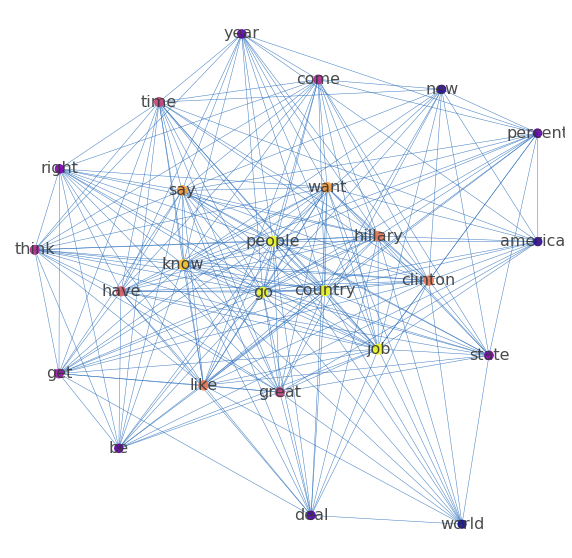

In [155]:
# plot based on closeness centrality

layout_giant_trump_filtered = nx.spring_layout(giant_trump_filtered, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_giant30 = nx.closeness_centrality(giant_trump_filtered)
maxC = max(centralities_giant30.items(), key = lambda x : x[1])[1]
nx.draw(giant_trump_filtered, ax = ax, pos = layout_giant_trump_filtered, labels = {n: n for n in giant_trump_filtered.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_giant30[n] / maxC for n in giant_trump_filtered.nodes],
        node_size = [centralities_giant30[n] / maxC * 100 for n in giant_trump_filtered.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

In [156]:
# calc the global statistics

# calc the density of network

nx.density(giant_trump)

0.02202012546840133

In [157]:
# calc the average degree per node

np.mean([v for w,v in nx.degree(giant_trump)])

8.301587301587302

In [158]:
# calc the average distance between any two nodes in the network (diameter)

nx.diameter(giant_trump)

7

### Comment/Inference

From the global statistics, we can see that the density of network of Trump's speeches are relatively quite small, and the average degree and the diameter are relative large. They all indicate that the words or vocabulary in Trump's speeches are quite diffusive and divergent. It makes sense actually, as the speeches during the campaign would cover a large range of topics like education, medicare, international relations, etc., so the words should be divergent. These various topics are connected and expressed by some central words (ususally basic verbs or key conceptions as discussed before), which reveals the colloquial speaking style of Trump. 

# POS based networks

Now let's look at links between specific parts of speech within a network.



Let's look at nouns co-occurring in sentences using the top 10 (by score) reddit posts on thread topics we have explored in prior sessions:

In [159]:
redditDF = pandas.read_csv('../data/reddit.csv', index_col = 0)

In [160]:
redditTopScores = redditDF.sort_values('score')[-100:]
redditTopScores['sentences'] = redditTopScores['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
redditTopScores.index = range(len(redditTopScores) - 1, -1,-1) #Reindex to make things nice in the future
redditTopScores[:3]

,author,over_18,score,subreddit,text,title,url,sentences
99,jimmy_three_shoes,False,4990,Tales From Tech Support,"This happened a little while ago, when I was c...","We've tried nothing, and we're all out of ideas!",https://www.reddit.com/r/talesfromtechsupport/...,"[[This, happened, a, little, while, ago, when,..."
98,badbfriend,False,5034,Relationships,https://www.reddit.com/r/relationships/comment...,"Me [29 M] with my g/f [27 F] together 4 years,...",https://www.reddit.com/r/relationships/comment...,[[https://www.reddit.com/r/relationships/comme...
97,Fafrdr,False,5146,Relationships,First post: https://www.reddit.com/r/relations...,Update - My [16F] father [59M] acts creepy tow...,https://www.reddit.com/r/relationships/comment...,"[[First, post, https://www.reddit.com/r/relati..."


Let's look at a few things here, especially some things about Pandas that might come in handy later on.

First, sort_values('score'): sort_values is a function used for Pandas DataFrame to literally sort the values. Here, it sorts the values from the lowest one to the highest one. So, by doing "redditDF.sort_values('score')[-100:]", it gets us 100 rows, from the 100th highest one (-99) to the highest one (0). Why not -100 and 1 rather than -99 and 0? That's just how Python works.

Second, .index: it literally gives you the index of the Pandas DataFrame. You can also reindex the indices here. But what does "range(len(redditTopScores) - 1, -1,-1)" do? It generates a range from len(redditTopScores)-1 to -1 by increments of -1. So, a range from 99 to -1, by -1, i.e., 99, 98, 97...0.

Now we'll normalize the tokens through stemming:

In [161]:
redditTopScores['normalized_sents'] = redditTopScores['sentences'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

We will revisit spacy and use it's english language model.

In [162]:
import spacy

In [163]:
nlp = spacy.load('en')

In [164]:
def posCooccurrence(sentences, *posType, makeMatrix = False):
    words = set()
    reducedSents = []
    #Only using the first kind of POS for each word
    wordsMap = {}
    for sent in sentences:
        s = [(w, t) for w, t in lucem_illud_2020.spacy_pos(sent) if t in posType]
        for w, t in s:
            if w not in wordsMap:
                wordsMap[w] = t
        reducedSent = [w for w, t in s]
        words |= set(reducedSent)
        reducedSents.append(reducedSent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in reducedSents:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        for w in g.nodes:
            g.nodes[w]['bipartite'] = wordsMap[w]
        return g

In [165]:
gNN = posCooccurrence(redditTopScores['normalized_sents'].sum(), 'NN')

In [166]:
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 1957
Number of edges: 11931
Average degree:  12.1932


This is a bit too large to effectively visualize, so let's remove the vertices with degree less than or equal to 100:

In [167]:
gNN.remove_nodes_from([n for n in gNN.nodes if len(set(gNN.neighbors(n))) <= 100]) 
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 27
Number of edges: 261
Average degree:  19.3333


And low weight edges:

In [168]:
gNN.remove_edges_from([(n1, n2) for n1, n2, d in gNN.edges(data = True) if d['weight'] <= 2])
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 27
Number of edges: 88
Average degree:   6.5185


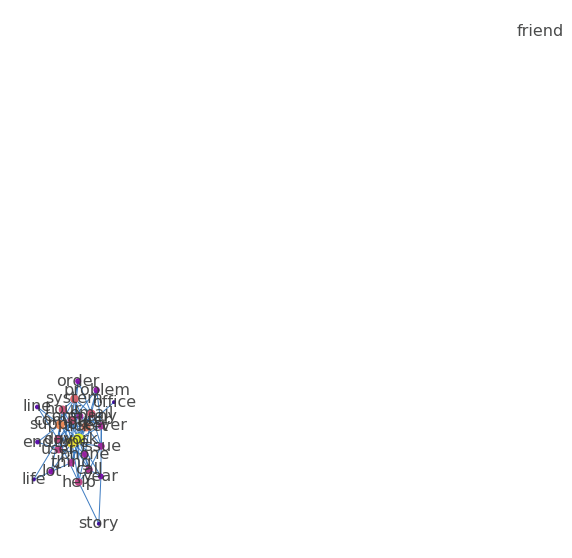

In [169]:
layout_nn = nx.spring_layout(gNN, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nn = nx.eigenvector_centrality(gNN)
maxC = max(centralities_nn.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNN.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNN.edges(data = True)))
nx.draw(gNN, ax = ax, pos = layout_nn, labels = {n: n for n in gNN.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nn[n] / maxC for n in gNN.nodes],
        node_size = [centralities_nn[n] / maxC * 100 for n in gNN.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

This makes sense: people are talking about work, support, computers, time... it's a tech support forum, so these are expected connections.

What if we want to look at noun-verb pairs instead?

In [170]:
gNV = posCooccurrence(redditTopScores['normalized_sents'].sum(), 'NN', 'VB')

`gNV` has co-occurrences between nouns and nouns as well as between verbs and verbs. Let's remove these and make it purely about noun and verb combinations:

In [171]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 2105
Number of edges: 18560
Average degree:  17.6342


In [172]:
gNV.remove_edges_from([(n1,n2) for n1,n2,d in gNV.edges(data = True) if gNV.nodes[n1]['bipartite'] == gNV.nodes[n2]['bipartite']])

In [173]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 2105
Number of edges: 6078
Average degree:   5.7748


Dropping low weight edges and low degree vertices gives us:

In [174]:
gNV.remove_edges_from([(n1, n2) for n1, n2, d in gNV.edges(data = True) if d['weight'] <= 2])
gNV.remove_nodes_from([n for n in gNV.nodes if len(set(gNV.neighbors(n))) <= 5])

In [175]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 22
Number of edges: 66
Average degree:   6.0000


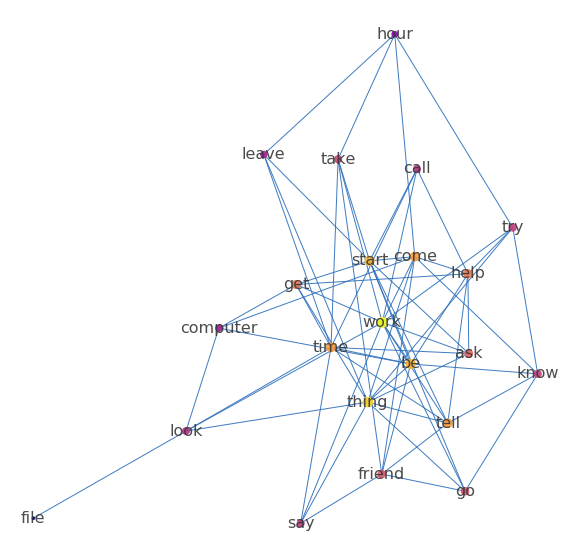

In [176]:
layout_nn = nx.spring_layout(gNV, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nv = nx.eigenvector_centrality(gNV)
maxC = max(centralities_nv.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNV.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNV.edges(data = True)))
nx.draw(gNV, ax = ax, pos = layout_nn, labels = {n: n for n in gNV.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nv[n] / maxC for n in gNV.nodes],
        node_size = [centralities_nv[n] / maxC * 100 for n in gNV.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       ) 

Lets create an "ego network" surrounding a single (important) word, as we did before:

In [177]:
g_i = gNV.subgraph(['work'] + list(gNV.neighbors('work')))

In [178]:
print(nx.info(g_i))

Name: 
Type: Graph
Number of nodes: 12
Number of edges: 11
Average degree:   1.8333


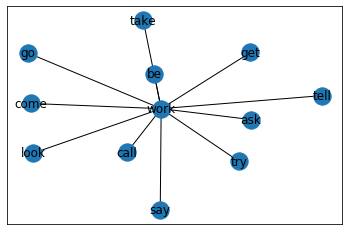

In [179]:
nx.draw_networkx(g_i)

Instead of just nodes connected to a vertex, we can find all those connected to it within 2 hops, lets look at 'look' (+ points for being meta) for this:

In [180]:
storyNeighbors = gNV.neighbors('look')
set(storyNeighbors)

{'computer', 'file', 'thing', 'time', 'work'}

In [181]:
storyNeighbors = set(gNV.neighbors('look'))
storyNeighborsPlus1 = set(storyNeighbors)
for n in storyNeighbors:
    storyNeighborsPlus1 |= set(gNV.neighbors(n))

In [182]:
gNV_story = gNV.subgraph(storyNeighborsPlus1)
print(nx.info(gNV_story))

Name: 
Type: Graph
Number of nodes: 17
Number of edges: 35
Average degree:   4.1176


This is a mid-sized network, but we can interrogate it intelligently by computing some statistics. Degree centrality:

In [183]:
sorted(nx.degree_centrality(gNV_story).items(), key = lambda x: x[1], reverse = True)[:10]

[('work', 0.6875),
 ('thing', 0.625),
 ('time', 0.5625),
 ('look', 0.3125),
 ('computer', 0.25),
 ('get', 0.25),
 ('be', 0.25),
 ('come', 0.1875),
 ('say', 0.1875),
 ('ask', 0.1875)]

Or eigenvector centrality:

In [184]:
sorted(nx.eigenvector_centrality(gNV_story).items(), key = lambda x: x[1], reverse = True)[:10]

[('work', 0.42438748850651115),
 ('thing', 0.3954136021164726),
 ('time', 0.35676114748136667),
 ('look', 0.266774860771901),
 ('get', 0.25723370583024074),
 ('be', 0.25723370583024074),
 ('say', 0.22250581433600003),
 ('ask', 0.22250581433600003),
 ('tell', 0.22250581433600003),
 ('come', 0.18976474662612278)]

Lets plot it:

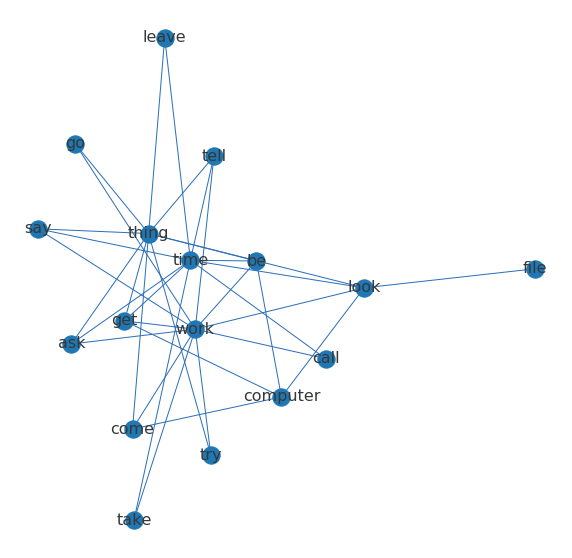

In [185]:
layout_story = nx.spring_layout(gNV_story, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(gNV_story, ax = ax, pos = layout_story, labels = {n: n for n in gNV_story.nodes()},
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
       ) 

Lets create a noun-adjective network:

In [186]:
gNJ = posCooccurrence(redditTopScores['normalized_sents'][:100].sum(), 'NN', 'JJ')
print(nx.info(gNJ))

Name: 
Type: Graph
Number of nodes: 2582
Number of edges: 19723
Average degree:  15.2773


By filtering by a centrality measure we can get a more 'central' set of nodes instead of just the most connected.

In [187]:
gNJ_filtered200 = filterWords(gNJ, minWeight=3, filter_='betweenness', rule='number', value_of_rule=25)
print(nx.info(gNJ_filtered200))

Total number of nodes(after filtering) in the graph is 25
Name: 
Type: Graph
Number of nodes: 25
Number of edges: 76
Average degree:   6.0800


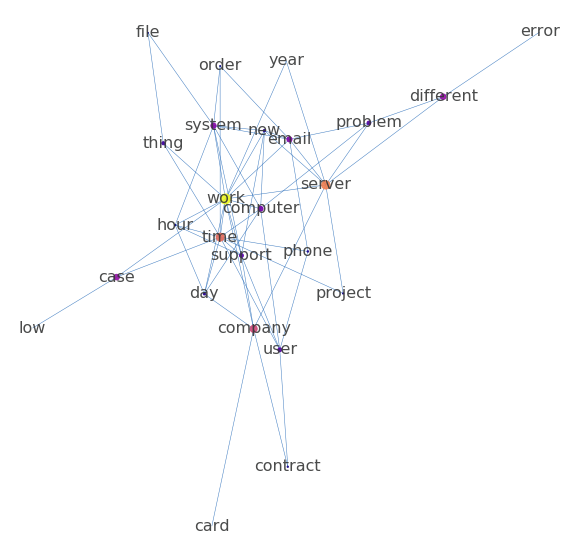

In [188]:
layout_NJ_filtered200 = nx.spring_layout(gNJ_filtered200, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nj200 = nx.betweenness_centrality(gNJ_filtered200)
maxC = max(centralities_nj200.items(), key = lambda x : x[1])[1]
nx.draw(gNJ_filtered200, ax = ax, pos = layout_NJ_filtered200, labels = {n: n for n in gNJ_filtered200.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_nj200[n] / maxC for n in gNJ_filtered200.nodes],
        node_size = [centralities_nj200[n] / maxC * 100 for n in gNJ_filtered200.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">Construct cells immediately below this that construct at least two different networks comprising different combinations of word types, linked by different syntactic structures, which illuminate your corpus and the dynamics you are interested to explore. Graph these networks or subnetworks within them. What are relationships that are meaningful? 

<span style="color:red">***Stretch***: Graph some word-centered "ego-networks" with words one link away, two links away, and three links away (we only did up to two links away above).

I still use the corpus of Trump's speeches.

In [189]:
# Some basic settings

import spacy

nlp = spacy.load('en')

def posCooccurrence(sentences, *posType, makeMatrix = False):
    words = set()
    reducedSents = []
    #Only using the first kind of POS for each word
    wordsMap = {}
    for sent in sentences:
        s = [(w, t) for w, t in lucem_illud_2020.spacy_pos(sent) if t in posType]
        for w, t in s:
            if w not in wordsMap:
                wordsMap[w] = t
        reducedSent = [w for w, t in s]
        words |= set(reducedSent)
        reducedSents.append(reducedSent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in reducedSents:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        for w in g.nodes:
            g.nodes[w]['bipartite'] = wordsMap[w]
        return g

In [190]:
# check the noun-verb pairs relation

gNV_trump = posCooccurrence(trump_df['normalized_sents'].sum(), 'NN', 'VB')

In [191]:
print(nx.info(gNV_trump))

Name: 
Type: Graph
Number of nodes: 3005
Number of edges: 51147
Average degree:  34.0413


In [192]:
# remove the co-occurence between the same word type (NN and VV)

gNV_trump.remove_edges_from([(n1,n2) for n1,n2,d in gNV_trump.edges(data = True) if gNV_trump.nodes[n1]['bipartite'] == gNV_trump.nodes[n2]['bipartite']])

In [193]:
print(nx.info(gNV_trump))

Name: 
Type: Graph
Number of nodes: 3005
Number of edges: 19073
Average degree:  12.6942


In [194]:
# filter by drop low weight edges and low degree vertices

gNV_trump.remove_edges_from([(n1, n2) for n1, n2, d in gNV_trump.edges(data = True) if d['weight'] <= 8])
gNV_trump.remove_nodes_from([n for n in gNV_trump.nodes if len(set(gNV_trump.neighbors(n))) <= 8])

In [195]:
print(nx.info(gNV_trump))

Name: 
Type: Graph
Number of nodes: 47
Number of edges: 263
Average degree:  11.1915


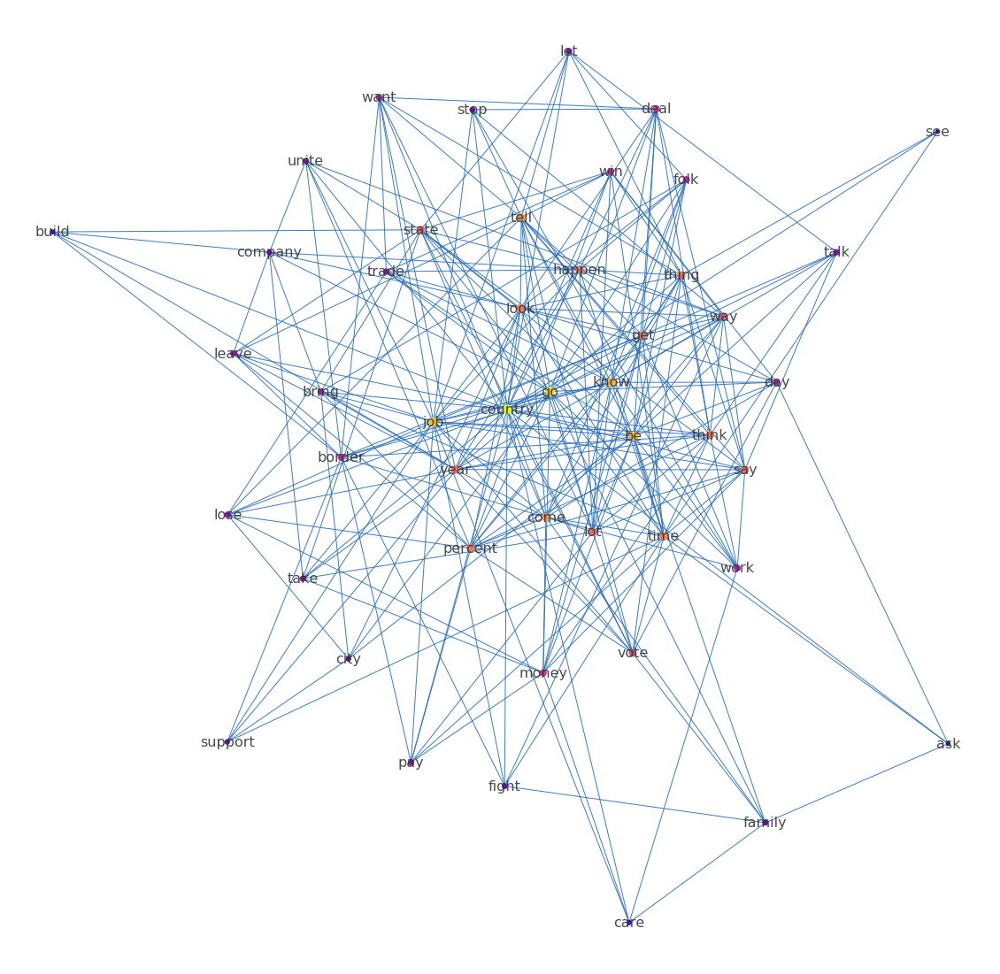

In [196]:
# draw the plot

layout_nv_trump = nx.spring_layout(gNV_trump, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (20,20))
centralities_nv_trump = nx.eigenvector_centrality(gNV_trump)
maxC = max(centralities_nv_trump.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNV_trump.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNV_trump.edges(data = True)))
nx.draw(gNV_trump, ax = ax, pos = layout_nv_trump, labels = {n: n for n in gNV_trump.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nv_trump[n] / maxC for n in gNV_trump.nodes],
        node_size = [centralities_nv_trump[n] / maxC * 100 for n in gNV_trump.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       ) 

In [197]:
# create an ego-network around 'job' - one link away

g_i_job = gNV_trump.subgraph(['job'] + list(gNV_trump.neighbors('job')))
print(nx.info(g_i_job))

Name: 
Type: Graph
Number of nodes: 23
Number of edges: 22
Average degree:   1.9130


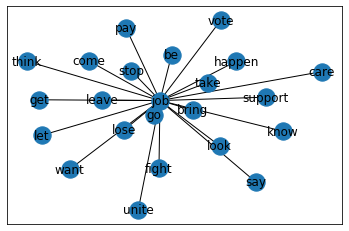

In [198]:
# draw the plot

nx.draw_networkx(g_i_job)

In [199]:
# create an ego-network around 'job' - two links away

jobNeighbors = set(gNV_trump.neighbors('job'))
jobNeighborsPlus1 = set(jobNeighbors)
for n in jobNeighbors:
    jobNeighborsPlus1 |= set(gNV_trump.neighbors(n))

gNV_job = gNV_trump.subgraph(jobNeighborsPlus1)
print(nx.info(gNV_job))

Name: 
Type: Graph
Number of nodes: 43
Number of edges: 241
Average degree:  11.2093


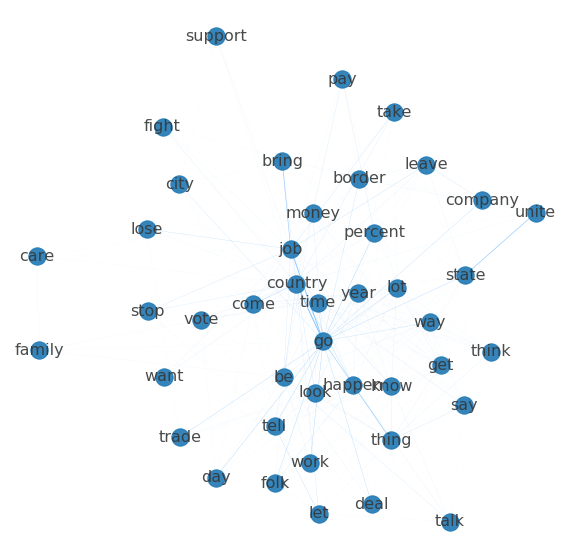

In [200]:
# draw the plot

layout_gnv_job2 = nx.spring_layout(gNV_job, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
centralities_job2 = nx.eigenvector_centrality(gNV_job)
maxC = max(centralities_job2.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNV_job.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNV_job.edges(data = True)))
nx.draw(gNV_job, ax = ax, pos = layout_gnv_job2, labels = {n:n for n in gNV_job.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNV_job.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma'),
       )

In [201]:
# create an ego-network around 'job' - three links away

jobNeighborsPlus2 = set(jobNeighborsPlus1)
for n in jobNeighborsPlus1:
    jobNeighborsPlus2 |= set(gNV_trump.neighbors(n))

gNV_job2 = gNV_trump.subgraph(jobNeighborsPlus2)
print(nx.info(gNV_job2))

Name: 
Type: Graph
Number of nodes: 47
Number of edges: 263
Average degree:  11.1915


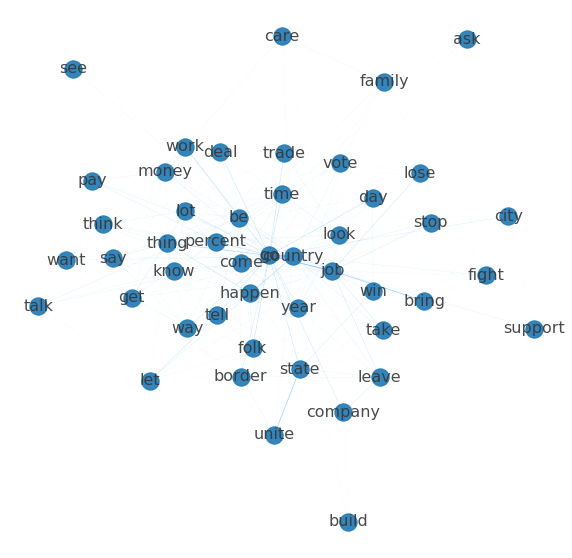

In [202]:
# draw the plot

layout_gnv_job2 = nx.spring_layout(gNV_job2, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
centralities_job2 = nx.eigenvector_centrality(gNV_job2)
maxC = max(centralities_job2.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNV_job2.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNV_job2.edges(data = True)))
nx.draw(gNV_job2, ax = ax, pos = layout_gnv_job2, labels = {n:n for n in gNV_job2.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNV_job2.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma'),
       )

In [203]:
# check top 10 words of the 3-link-away ego-network around "job" based on degree centrality

sorted(nx.degree_centrality(gNV_job2).items(), key = lambda x: x[1], reverse = True)[:10]

[('country', 0.5652173913043478),
 ('job', 0.4782608695652174),
 ('go', 0.45652173913043476),
 ('be', 0.41304347826086957),
 ('know', 0.3913043478260869),
 ('time', 0.3695652173913043),
 ('tell', 0.34782608695652173),
 ('come', 0.34782608695652173),
 ('year', 0.32608695652173914),
 ('percent', 0.32608695652173914)]

In [204]:
# check top 10 words of the 3-link-away ego-network around "job" based on eigenvector centrality

sorted(nx.eigenvector_centrality(gNV_job2).items(), key = lambda x: x[1], reverse = True)[:10]

[('country', 0.25015843165748813),
 ('go', 0.2337115926419917),
 ('job', 0.22845684583080697),
 ('be', 0.21832343508592508),
 ('know', 0.21672605923661847),
 ('come', 0.19675063537832158),
 ('tell', 0.19311931385900538),
 ('time', 0.18883940247633663),
 ('look', 0.18611367831094192),
 ('say', 0.18121500190724568)]

### Comment/Inference

For the verb-noun pairs, they are mostly potential policies and promises made by Trump during the campaign like "take job", "want border", "pay money", etc. Also, the basic verbs and conceptions again are in the center.

For the ego-network, I mainly focus on the word "job", and for one link away, we see the verb-noun pairs that deal with "job" like "take job", "bring job", "lose job", etc. The 2- and 3-link-away ego-networks do not have much insight, as "job" shift aside from the center and those verbs that are linked to "job" one link away have brought a lot new nodes in. 

In [205]:
# check the adj-noun pairs

gNJ_trump = posCooccurrence(trump_df['normalized_sents'].sum(), 'NN', 'JJ')
print(nx.info(gNJ_trump))

Name: 
Type: Graph
Number of nodes: 3666
Number of edges: 61742
Average degree:  33.6836


In [206]:
# remove the co-occurence between the same word type (NN and JJ)

gNJ_trump.remove_edges_from([(n1,n2) for n1,n2,d in gNJ_trump.edges(data = True) if gNJ_trump.nodes[n1]['bipartite'] == gNJ_trump.nodes[n2]['bipartite']])
print(nx.info(gNJ_trump))

Name: 
Type: Graph
Number of nodes: 3666
Number of edges: 25110
Average degree:  13.6989


In [207]:
# here I wanna try annother filtering method by a centrality measure (we have defined the func before)

# set the minweight=3, filter method=betweenness, rule=number, and value of rule as 35.

gNJ_trump_filtered = filterWords(gNJ_trump, minWeight=3, filter_='betweenness', rule='number', value_of_rule=35)
print(nx.info(gNJ_trump_filtered))

Total number of nodes(after filtering) in the graph is 35
Name: 
Type: Graph
Number of nodes: 35
Number of edges: 209
Average degree:  11.9429


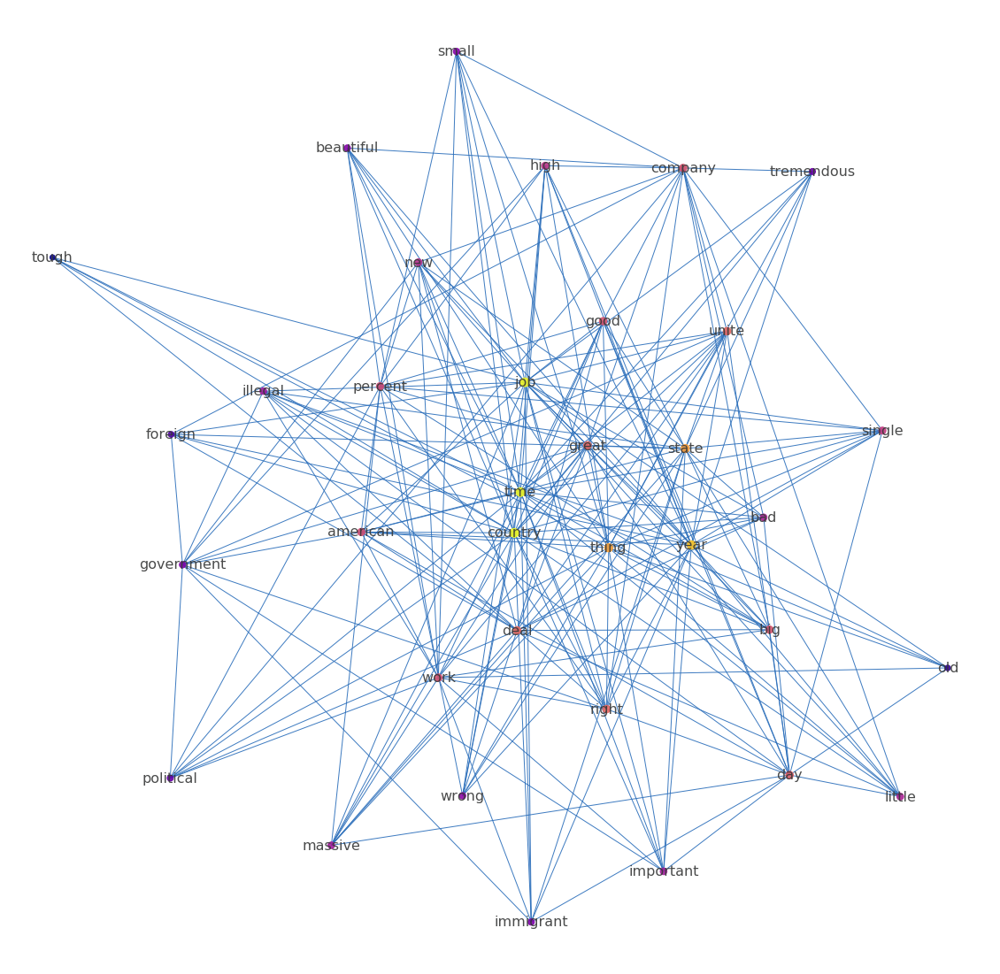

In [208]:
# draw the plot

layout_nj_trump = nx.spring_layout(gNJ_trump_filtered, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (20,20))
centralities_nj_trump = nx.eigenvector_centrality(gNJ_trump_filtered)
maxC = max(centralities_nj_trump.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNJ_trump_filtered.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNJ_trump_filtered.edges(data = True)))
nx.draw(gNJ_trump_filtered, ax = ax, pos = layout_nj_trump, labels = {n: n for n in gNJ_trump_filtered.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nj_trump[n] / maxC for n in gNJ_trump_filtered.nodes],
        node_size = [centralities_nj_trump[n] / maxC * 100 for n in gNJ_trump_filtered.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       ) 

In [209]:
# we still focus on "job"

# create an ego-network around 'job' - one link away

g_nj_job = gNJ_trump_filtered.subgraph(['job'] + list(gNJ_trump_filtered.neighbors('job')))
print(nx.info(g_nj_job))

Name: 
Type: Graph
Number of nodes: 23
Number of edges: 22
Average degree:   1.9130


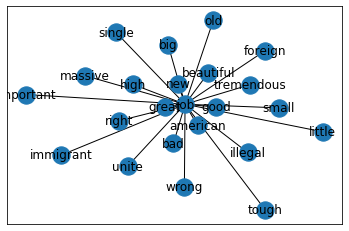

In [210]:
# draw the plot

nx.draw_networkx(g_nj_job)

In [211]:
# create an ego-network around 'job' - two links away

jobNeighbors_nj = set(gNJ_trump_filtered.neighbors('job'))
jobNeighborsPlus1_nj = set(jobNeighbors_nj)
for n in jobNeighbors_nj:
    jobNeighborsPlus1_nj |= set(gNJ_trump_filtered.neighbors(n))

gNJ_job2 = gNJ_trump_filtered.subgraph(jobNeighborsPlus1_nj)
print(nx.info(gNJ_job2))

Name: 
Type: Graph
Number of nodes: 34
Number of edges: 201
Average degree:  11.8235


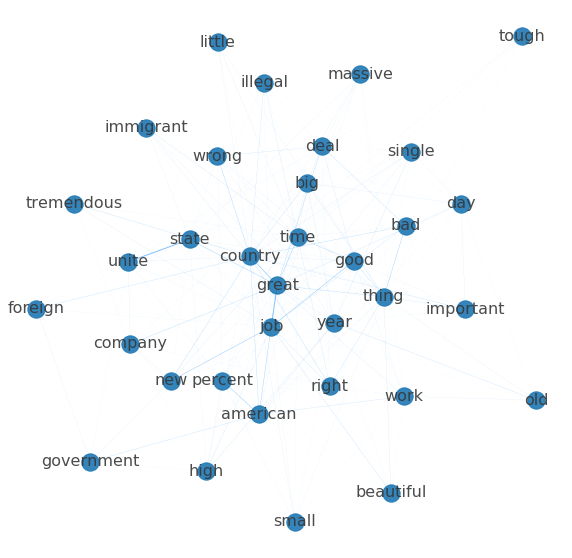

In [212]:
# draw the plot

layout_gnj_job2 = nx.spring_layout(gNJ_job2, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
centralities_job2 = nx.eigenvector_centrality(gNJ_job2)
maxC = max(centralities_job2.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNJ_job2.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNJ_job2.edges(data = True)))
nx.draw(gNJ_job2, ax = ax, pos = layout_gnj_job2, labels = {n:n for n in gNJ_job2.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNJ_job2.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma'),
       )

In [213]:
# create an ego-network around 'job' - three links away

jobNeighborsPlus2_nj = set(jobNeighborsPlus1_nj)
for n in jobNeighborsPlus1_nj:
    jobNeighborsPlus2_nj |= set(gNJ_trump_filtered.neighbors(n))

gNJ_job3 = gNJ_trump_filtered.subgraph(jobNeighborsPlus2_nj)
print(nx.info(gNJ_job3))

Name: 
Type: Graph
Number of nodes: 35
Number of edges: 209
Average degree:  11.9429


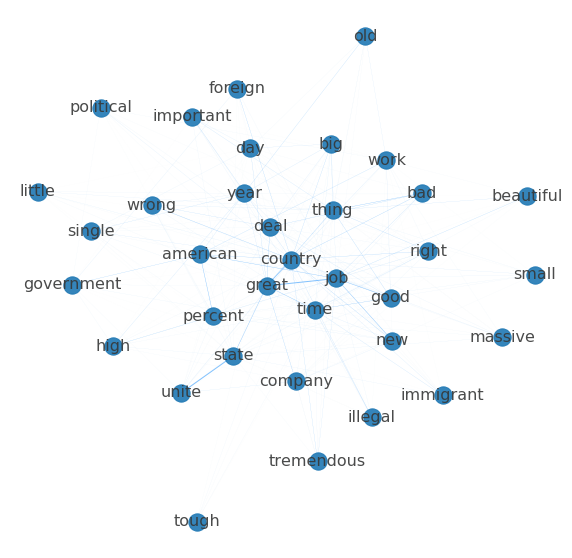

In [214]:
# draw the plot

layout_gnj_job3 = nx.spring_layout(gNJ_job3, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
centralities_job3 = nx.eigenvector_centrality(gNJ_job3)
maxC = max(centralities_job3.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNJ_job3.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNJ_job3.edges(data = True)))
nx.draw(gNJ_job3, ax = ax, pos = layout_gnj_job3, labels = {n:n for n in gNJ_job3.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNJ_job3.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma'),
       )

In [215]:
# check top 10 words of the 3-link-away ego-network around "job" based on degree centrality

sorted(nx.degree_centrality(gNJ_job3).items(), key = lambda x: x[1], reverse = True)[:10]

[('country', 0.6470588235294118),
 ('job', 0.6470588235294118),
 ('time', 0.6470588235294118),
 ('year', 0.5882352941176471),
 ('thing', 0.5588235294117647),
 ('state', 0.5294117647058824),
 ('deal', 0.47058823529411764),
 ('day', 0.4411764705882353),
 ('company', 0.4411764705882353),
 ('work', 0.4411764705882353)]

In [216]:
# check top 10 words of the 3-link-away ego-network around "job" based on eigenvector centrality

sorted(nx.eigenvector_centrality(gNJ_job3).items(), key = lambda x: x[1], reverse = True)[:10]

[('country', 0.2480460859724885),
 ('time', 0.24725726686175933),
 ('job', 0.24656761729579402),
 ('year', 0.22881487083982283),
 ('thing', 0.2147381528370495),
 ('state', 0.21223624361431476),
 ('deal', 0.18587961937292644),
 ('unite', 0.1848003012695287),
 ('great', 0.1848003012695287),
 ('right', 0.1848003012695287)]

### Comment/Inference

For the adj-noun pairs, they are actually into two sections. One kind of adjective is for description, i.e. "foreign government" and "american deal", while the other kind shows some attitudes of Trump, i.e. "bad job" and "wrong deal". What I wanna focus on is the latter one, and we again see that Trump often uses simple and direct adjectives to show his opinions on some issues. Audience and common people may better understand what Trump's attitudes are comparied with those politicians who use implicit words. 

For the ego-network, I still focus on the word "job", and for one link away, we see the adj-noun pairs are in opposite attitudes like "good job" and "wrong job". Further analysis may focus on the contexts of these adj-noun pairs. Still, the 2- and 3-link-away ego-networks do not have much insight.

## Creating networks of agents from corpora

Now that we have an idea of how we can use networks in python (a useful skill to know!), let us see how we can now use our knowledge of networks on extracting actors from corpora and building relations from them. Let us use the soap opera corpus now. 

In the last notebook we wrote methods to load corpora - this has been added to lucem_illud_2020.
The code returns a dictionary with each id mapping to the text associated with it. 

We would then use the source file to create the dataframe with the data - since this varies for each corpora, there is no built in function, but would follow a similar process.

This function might take some time.

In [217]:
corpora_address = "/Users/timqzhang/Desktop/UChicago/MACSS_Spring_2020/content_local/SOAP"

In [218]:
soap_texts = lucem_illud_2020.loadDavies(corpora_address, num_files=2000)

text_7-jss.zip
text_6-egn.zip
text_5-rag.zip
text_2-wts.zip
text_3-pem.zip
text_4-jfy.zip
text_8-sbo.zip
text_9-jtw.zip
text_0-tez.zip
text_1-teh.zip


We now use the source to see how the data is stored. Note that this is different from the movies corpus, and that we will need to use a different aggregating method to store the data. Each dataset would have a different approach, but they are all very similar, it depends on how the data is stored. Here multiple textids match multiple scripts, so our soap dataframe would be structured a little differently. 

You can see the first 20 lines of the source file here.

In [219]:
import zipfile

In [220]:
zfile = zipfile.ZipFile(corpora_address + "/soap_sources.zip")
source = []

In [221]:
for file in zfile.namelist():
    with zfile.open(file) as f:
        for line in f:
            source.append(line)

In [222]:
source[0:20]

[b'textID\tyear\tshow\t\turl\r\n',
 b'-----\t-----\t-----\t\t-----\r\n',
 b'\r\n',
 b'1\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-04-09-01.shtml\r\n',
 b'2\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-05-09-01.shtml\r\n',
 b'3\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-06-20-01.shtml\r\n',
 b'4\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-07-01.shtml\r\n',
 b'5\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-08-01.shtml\r\n',
 b'6\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-09-01.shtml\r\n',
 b'7\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-10-01.shtml\r\n',
 b'8\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-13-01.shtml\r\n',
 b'9\t2001\tAll My Childen\thttp://tvmegasite.net/tra

In [223]:
import pandas as pd

In [224]:
soap_dict = {}

In [225]:
for soap in source[3:]:
    try:
        textID, year, show, url = soap.decode("utf-8").split("\t")
    except UnicodeDecodeError:
        continue
    if show.strip() not in soap_dict:
        soap_dict[show.strip()] = []
    if show.strip() in soap_dict:
        try:
            soap_dict[show.strip()].append(soap_texts[textID.strip()])
        except KeyError:
            continue

In [226]:
soap_dict.keys()

dict_keys(['All My Childen', 'As the World Turns', 'Bold and Beautiful', 'Days of Our Lives', 'General Hospital', 'Guiding Light', 'One Life to Live', 'Passions', 'Port Charles', 'Young and Restless'])

In [227]:
soap_df = pd.DataFrame(columns=["Soap Name", "Tokenized Texts"])

In [228]:
i = 0

In [229]:
for soap in soap_dict:
    # since there were multiple lists
    print(soap)
    full_script = []
    for part in soap_dict[soap]:
        full_script = full_script + part
    soap_df.loc[i] = [soap, full_script]
    i += 1

All My Childen
As the World Turns
Bold and Beautiful
Days of Our Lives
General Hospital
Guiding Light
One Life to Live
Passions
Port Charles
Young and Restless


In [230]:
soap_df

,Soap Name,Tokenized Texts
0,All My Childen,"[@!Reporter, Is, there, anything, you, regret,..."
1,As the World Turns,"[@!Katie, Okay, I, know, these, words, are, lo..."
2,Bold and Beautiful,"[@!Bridget, What, did, you, say, @!Deacon, Jus..."
3,Days of Our Lives,"[@!Maggie, How, are, you, doing, @!Victor, Fin..."
4,General Hospital,"[@!Luke, I, signed, my, divorce, papers, You, ..."
5,Guiding Light,"[@!Dax, I, take, it, everything, is, well, wit..."
6,One Life to Live,"[@!Blair, Excuse, me, @!Todd, Why, Did, you, d..."
7,Passions,"[@!Julian, Let, 's, drink, up, It, 's, not, ev..."
8,Port Charles,"[@!Frank, Hey, @!Karen, Hey, You, still, on, d..."
9,Young and Restless,"[@!Katherine, Any, sign, of, your, daddy, swee..."


We now have each Soap, and each of the Tokenized texts. Let us see what kind of information we can get. These are American soap operas, and are likely to be cheesy and dramatic (an understatment). A fun start would be to make networks of each of the actors and actresses in these soaps. 

What would be a good way to create a network? Maybe everytime someone talks to someone we add one weight? But we wouldn't want to add weights whenever it's a different scene - or maybe we do? Let us look at the text and figure it out.

Note that we didn't add the year here because it spans over multiple years. If we are doing different kinds of analysis we would want to a years column as well.

In my dataframe, Days of Our Lives is the 4th corpora, and I conducted my basic analysis on that.

In [231]:
dool = soap_df['Tokenized Texts'][3]

In [232]:
' '.join(dool[0:1500])

"@!Maggie How are you doing @!Victor Fine @!Nicole Humming this ought to ease the pain @!Victor You wo n't be offended if I tell you I 'm not in the mood @!Nicole Oh come on @!Victor Looking around at what 's been going on here I hardly see what we have to toast to @!Nicole How about to us To survivors @!Maggie You all right @!Nicole Yeah @!Maggie Okay @!Philip Hey Chloe @!Chloe How 's Lexie @!Philip Does n't look so good but John and Marlena did everything they can How are you How are you holding up @!Chloe I 'm fine Philip okay I just need to be alone @!John It 's not enough Wounds are too severe @!Marlena We have no choice She 's got to get to the hospital @!Maggie Okay @!Hope Is there any news @!Maggie Mickey said there were explosions all over town and no one knows why Most of the roads are still blocked and they 're telling My daughter There 's no time We have to get her to the hospital @!Maggie Even if the roads were clear Stefano the ambulances are all in use There are victims 

Hmmm... we can't do our normal text processing. But this provides us with an interesting oppurtunity: every '@!' is followed by some useeful information. Let us do a quick check of how many characters exist here, and how many times they speak.

In [233]:
characters = {}

In [234]:
for token in dool:
    if token[0] == '@':
        # all characters or actions start with @, so we add that to character
        if token[2:] not in characters:
            characters[token[2:]] = 0
        if token[2:] in characters:
            characters[token[2:]] += 1


In [235]:
len(characters)

833

Wow, that's a lot of characters: but we notice a '@!' between certain actions too, such as screaming and sobbing. Let us maybe only look for characters with a high number of appearances?

In [236]:
for character in characters:
    if characters[character] > 2000:
        print(character, characters[character])

Nicole 3399
Philip 2568
John 2403
Hope 3520
Belle 2783
Shawn 2952
Brady 2183
Jennifer 2163
Bo 3830
Sami 5246
Kate 2419
Lucas 2380


Let's check these folks out on the interwebz...a image of search of the name + "days of our lives":

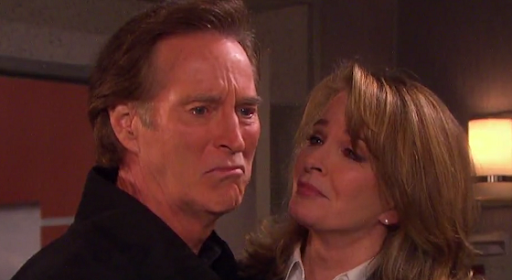

In [237]:
Image(filename='../data/dool/dool_john.png') 

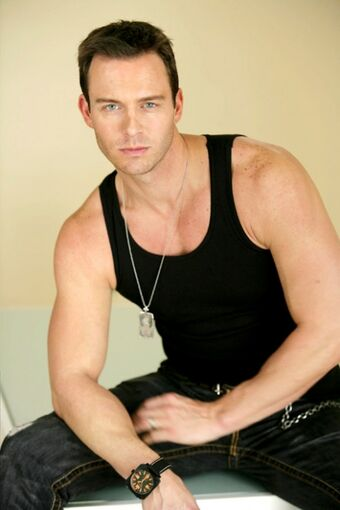

In [238]:
Image(filename='../data/dool/dool_brady.jpg') 

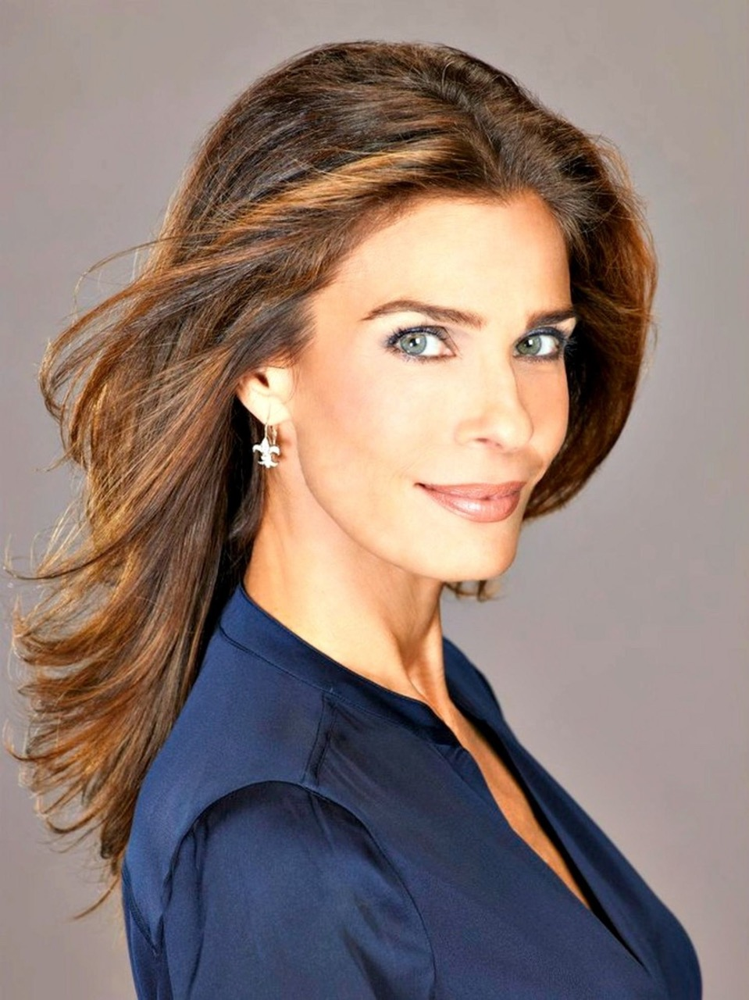

In [239]:
Image(filename='../data/dool/dool_hope.jpeg')

In [240]:
# Image(filename='../data/dool/dool_philip.jpeg')

In [241]:
# Image(filename='../data/dool/dool_marlena.jpg')

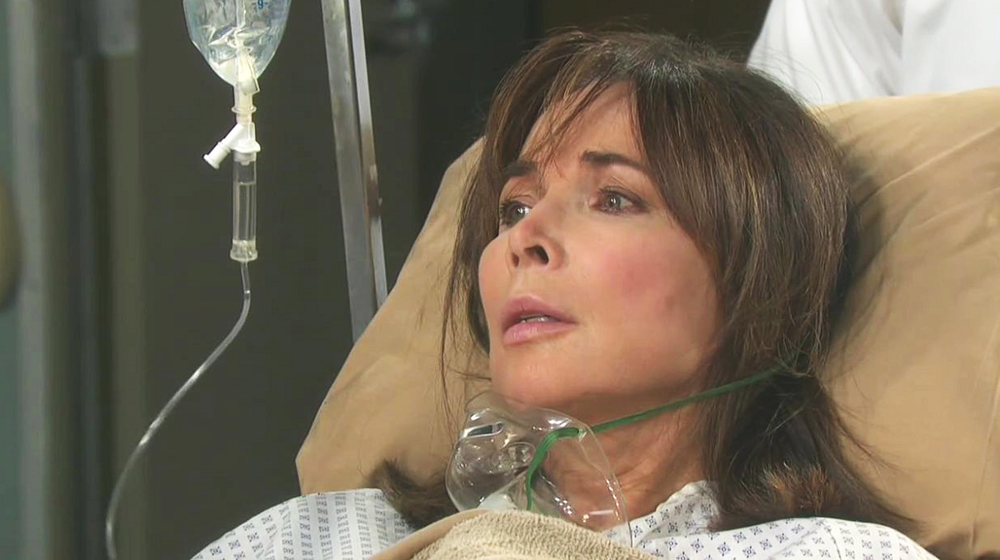

In [242]:
Image(filename='../data/dool/dool_kate.png')

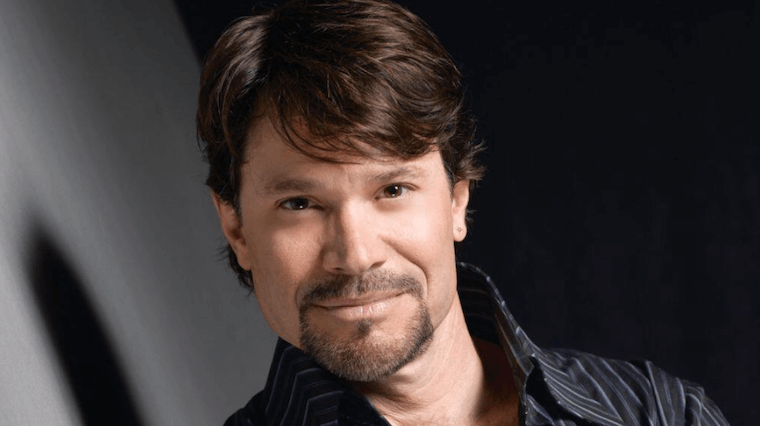

In [243]:
Image(filename='../data/dool/dool_bo.png')

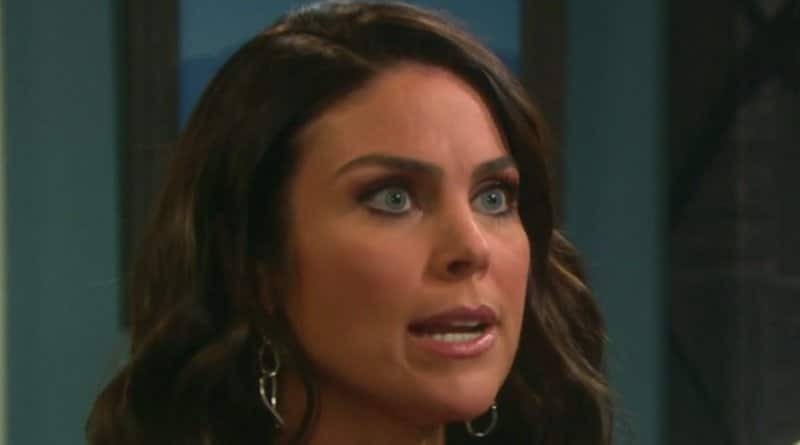

In [244]:
Image(filename='../data/dool/dool_chloe.jpg')

In [245]:
# Image(filename='../data/dool/dool_sami.jpg')

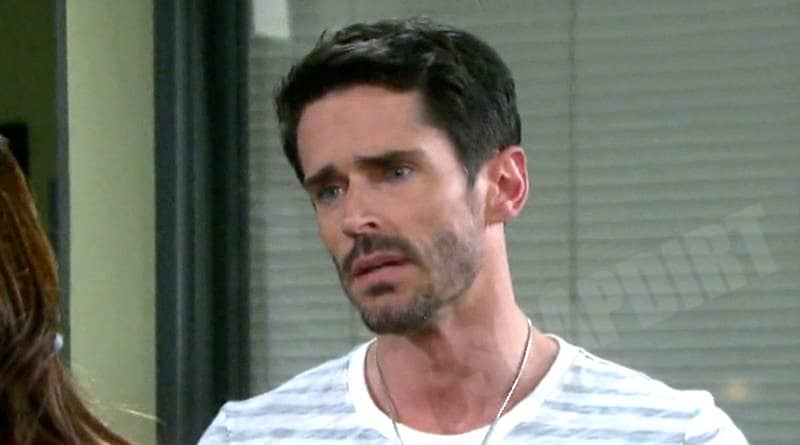

In [246]:
Image(filename='../data/dool/dool_shawn.jpg')

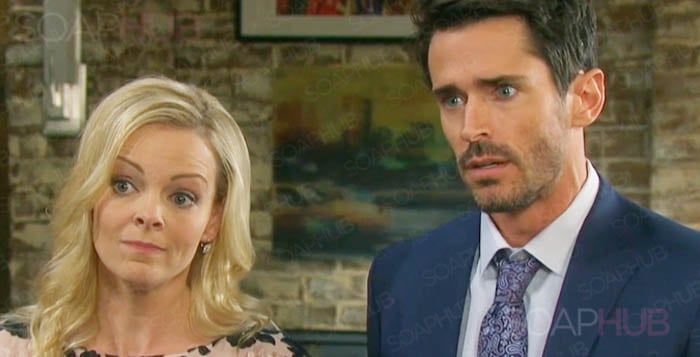

In [247]:
Image(filename='../data/dool/dool_belle.jpg')

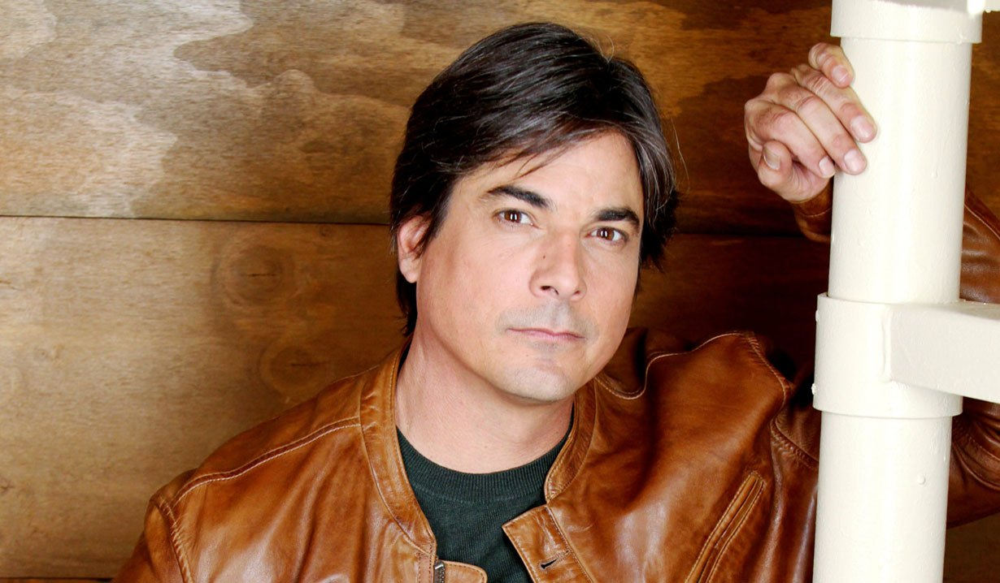

In [248]:
Image(filename='../data/dool/dool_lucas.jpg')

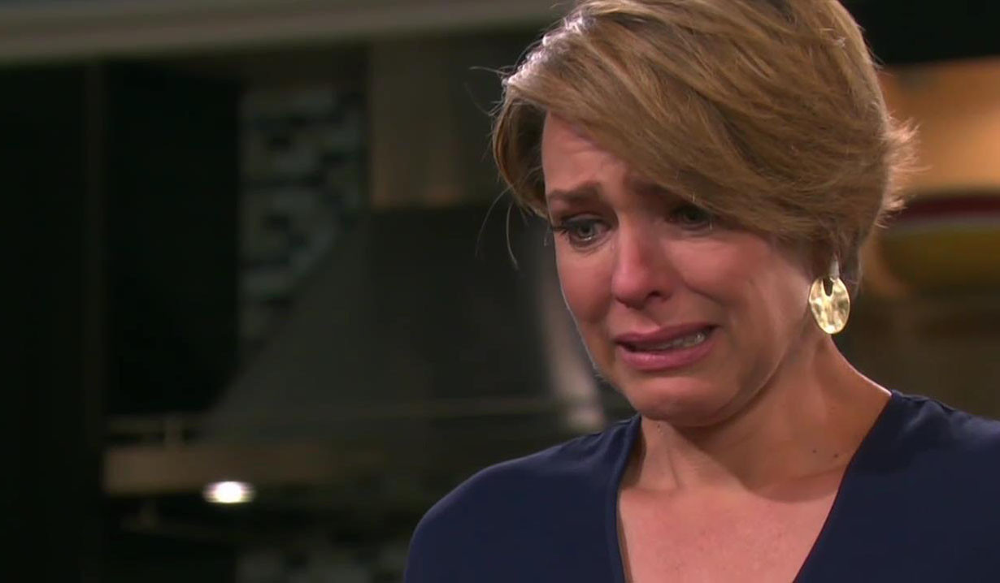

In [249]:
Image(filename='../data/dool/dool_nicole.jpg')

These are definitely big, long-time players in the dramatic Days narrative. It would make sense to create a graph where each character who appears over 2000 times is a node, and each time they talk to each other, we add one to their weight. We should also store all the things these chracters say: that's useful information.

So we now iterate through the tokens in a manner where we can capture this information.

In [250]:
actor_network = nx.Graph()

In [251]:
for character in characters:
    if characters[character] > 2000:
        actor_network.add_node(character, lines_spoken= characters[character], words=[])

In [252]:
len(actor_network.nodes.data())

12

In [253]:
actor_network.nodes.data()

NodeDataView({'Nicole': {'lines_spoken': 3399, 'words': []}, 'Philip': {'lines_spoken': 2568, 'words': []}, 'John': {'lines_spoken': 2403, 'words': []}, 'Hope': {'lines_spoken': 3520, 'words': []}, 'Belle': {'lines_spoken': 2783, 'words': []}, 'Shawn': {'lines_spoken': 2952, 'words': []}, 'Brady': {'lines_spoken': 2183, 'words': []}, 'Jennifer': {'lines_spoken': 2163, 'words': []}, 'Bo': {'lines_spoken': 3830, 'words': []}, 'Sami': {'lines_spoken': 5246, 'words': []}, 'Kate': {'lines_spoken': 2419, 'words': []}, 'Lucas': {'lines_spoken': 2380, 'words': []}})

In [254]:
actor_network.nodes['Sami']['lines_spoken']

5246

In [255]:
i = 0

The following lines of code creates the graph. Please carefully go through the code: you should be able to understand (more or less) what is going on here. 

In [256]:
for token in dool:
    i += 1
    if i > len(dool):
        break
    if token[0] == "@":
        if token[2:] in actor_network.nodes():
            j = i
            for token_ in dool[i:]:
                if token_[0] == "@":
                    # if both the characters exist in the graph, add a weight
                    if token_[2:] != token[2:] and token_[2:] in actor_network.nodes():
                        if (token[2:], token_[2:]) not in actor_network.edges():
                            actor_network.add_edge(token[2:], token_[2:], weight=0)
                        if (token[2:], token_[2:]) in actor_network.edges():
                            actor_network.edges[(token[2:], token_[2:])]['weight'] += 1
                    break
                j += 1
            # adding characters sentences
            actor_network.nodes[token[2:]]['words'].append(dool[i:j])

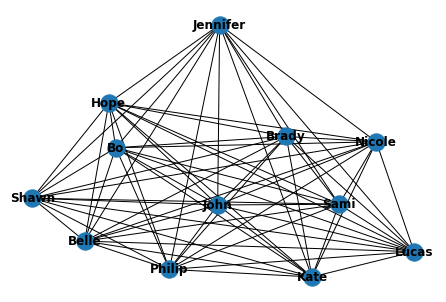

In [257]:
nx.draw(actor_network, with_labels=True, font_weight='bold')

In [258]:
import seaborn as sns

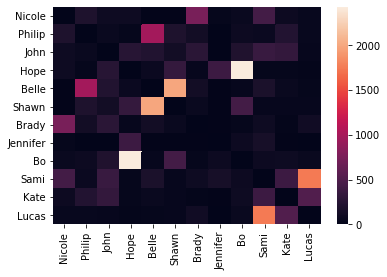

In [259]:
L = []
for node in actor_network.nodes():
    l = []
    for node_ in actor_network.nodes():
        if node == node_:
            l.append(0)
        else:
            l.append(actor_network.edges[(node, node_)]['weight'])
    L.append(l)
M_ = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M_, columns = list(actor_network.nodes()), index = list(actor_network.nodes()))
ax = sns.heatmap(div)
plt.show()

In [260]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(actor_network))

In [261]:
c

[frozenset({'Belle',
            'Bo',
            'Brady',
            'Hope',
            'Jennifer',
            'John',
            'Kate',
            'Lucas',
            'Nicole',
            'Philip',
            'Sami',
            'Shawn'})]

### Finding structure in networks

We now have a lot of useful information: we have a graph of all the characters, with their relationships with other characters, as well as all the words they've said. We tried finding communities, but it seems like everyone is connected to everyone: each of them form their own 'community'. Seems like people talk to each other a bunch in soaps.

This is however, not the best network to find any meaningful patterns, as we can see with everyone connected to everyone. But as we can see with our heatmap, not everyone talks to everyone an equal amount. How about we only keep our "important" ties, where people are talking to each other a lot?

In [262]:
smaller_actor_network = nx.Graph()

In [263]:
for actor_1 in actor_network.nodes():
    smaller_actor_network.add_node(actor_1, lines_spoken= actor_network.nodes[actor_1]['lines_spoken'], words=actor_network.nodes[actor_1]['words'])
    for actor_2 in actor_network.nodes():
        if actor_2!=actor_1 and actor_network.edges[(actor_1, actor_2)]['weight'] > 250:
            smaller_actor_network.add_edge(actor_1, actor_2, weight=actor_network.edges[(actor_1, actor_2)]['weight'])


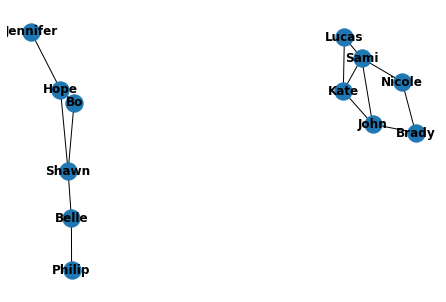

In [264]:
nx.draw(smaller_actor_network, with_labels=True, font_weight='bold')

This is a lot more interesting: while the sets of characters overlap, there is still two distinct communities if you look at characters who regularly talk to each other!

Let us see what our centrality measures look like, as well as communities.

In [265]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(smaller_actor_network))

In [266]:
c

[frozenset({'Belle', 'Bo', 'Hope', 'Jennifer', 'Philip', 'Shawn'}),
 frozenset({'Brady', 'John', 'Kate', 'Lucas', 'Nicole', 'Sami'})]

In [267]:
dcentralities = nx.degree_centrality(smaller_actor_network)

In [268]:
dcentralities['John'], dcentralities['Philip']

(0.2727272727272727, 0.09090909090909091)

Our two different communities show up as detected by the networkx algorithm, and when we look at centralities, we can see that John is a lot more central than Philip.

Let us go back to our original graph, and see if the weight or number of similar appearences matches the text... how do we do this? Well, we already have the graph, and we also have information of who spoke to who. So we have our framework!

This means we can explore ideas contained in two of the papers you will be reading: . “No country for old members: User lifecycle and linguistic change in online communities.”, and  “Fitting In or Standing Out? The Tradeoffs of Structural and Cultural Embeddedness”, both of which you can access on Canvas. 

Let us use a simplified version of the papers, and check if a higher number of conversations might lead to a higher similarity between the word distributions for two characters. We can use the same divergences we used in the last notebook. Do you think it will match with the number of times each character was associated with each other?

In [269]:
import nltk

In [270]:
def kl_divergence(X, Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    D_kl = scipy.stats.entropy(p, q)
    return D_kl

def chi2_divergence(X,Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    return scipy.stats.chisquare(p, q).statistic

def Divergence(corpus1, corpus2, difference="KL"):
    """Difference parameter can equal KL, Chi2, or Wass"""
    freqP = nltk.FreqDist(corpus1)
    P = pandas.DataFrame(list(freqP.values()), columns = ['frequency'], index = list(freqP.keys()))
    freqQ = nltk.FreqDist(corpus2)
    Q = pandas.DataFrame(list(freqQ.values()), columns = ['frequency'], index = list(freqQ.keys()))
    if difference == "KL":
        return kl_divergence(P, Q)
    elif difference == "Chi2":
        return chi2_divergence(P, Q)
    elif difference == "KS":
        try:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency']).statistic
        except:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency'])
    elif difference == "Wasserstein":
        try:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None).statistic
        except:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None)

In [271]:
corpora = []
for character in actor_network.nodes():
    character_words = []
    for sentence in actor_network.nodes[character]['words']:
        for word in sentence:
            character_words.append(word)
    corpora.append(lucem_illud_2020.normalizeTokens(character_words))

In [272]:
L = []

In [273]:
for p in corpora:
    l = []
    for q in corpora:
        l.append(Divergence(p,q, difference='KS'))
    L.append(l)
M = np.array(L)

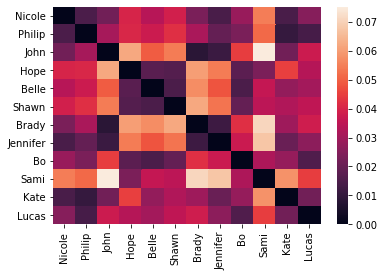

In [274]:
fig = plt.figure()
div = pandas.DataFrame(M, columns = list(actor_network.nodes()), index = list(actor_network.nodes()))
ax = sns.heatmap(div)
plt.show()

In [275]:
# np.corrcoef(M_, M)[0]

With our two heatplots, we can attempt to do some rudimentary analysis. We can see from our previous plot that Shawn and Belle talk to each other a lot, so do Hope and Bo, and Nicole and Brady, and Lucas and Sami. Do they also talk *like* each other?

Kind of, actually: all four of these pairs have a lower distance between them. Now I don't know anything about this particular soap... are these four pairs related? Are they in a relationship, either married or dating, or are they just really good friends?

This lays out the frameworks which you can now use to explore your own networks. 

# Interactional influence

In a recent paper by Fangjian Guo, Charles Blundell, Hanna Wallach, and Katherine Heller entitled ["The Bayesian Echo Chamber: Modeling Social Influence via Linguistic Accommodation"](https://arxiv.org/pdf/1411.2674.pdf), the authors develop a method to estimate the influence of one speaker on another in order to estimate a kind of interpersonal influence network. Here we walk through this method, which relies on a kind of point process called a Hawkes process that estimate the influence of one point on another. Specifically, what they estimate is the degree to which one actor to an interpersonal interaction engaged in "accomodation" behaviors relative to the other, generating a directed edge from the one to the other.

### First let's look at the output of their analysis:

In [276]:
example_name = '12-angry-men'   #example datasets: "12-angry-men" or "USpresident"

In [277]:
result_path = '../data/Bayesian-echo/results/{}/'.format(example_name)
if not os.path.isdir(result_path):
    raise ValueError('Invalid example selected, only "12-angry-men" or "USpresident" are avaliable')

In [278]:
df_meta_info = pandas.read_table(result_path + 'meta-info.txt',header=None)
df_log_prob = pandas.read_csv(result_path + "SAMPLE-log_prior_and_log_likelihood.txt",delim_whitespace=True) #log_prob samples
df_influence = pandas.read_csv(result_path + 'SAMPLE-influence.txt',delim_whitespace=True) # influence samples
df_participants = pandas.read_csv(result_path + 'cast.txt', delim_whitespace=True)
person_id = pandas.Series(df_participants['agent.num'].values-1,index=df_participants['agent.name']).to_dict()
print()
print ('Person : ID')
person_id


Person : ID


{'Juror 8': 0,
 'Juror 3': 1,
 'Juror 10': 2,
 'Foreman': 3,
 'Juror 7': 4,
 'Juror 4': 5,
 'Juror 11': 6,
 'Juror 12': 7,
 'Juror 6': 8,
 'Juror 2': 9,
 'Juror 9': 10,
 'Juror 5': 11}

In [279]:
def getDensity(df):
    data = df#_log_prob['log.prior']
    density = scipy.stats.gaussian_kde(data)
    width = np.max(data) - np.min(data)
    xs = np.linspace(np.min(data)-width/5, np.max(data)+width/5,600)
    density.covariance_factor = lambda : .25
    density._compute_covariance()
    return xs, density(xs)

### Plot MCMC (Markov Monte Carlo) trace and the density of log-likelihoods

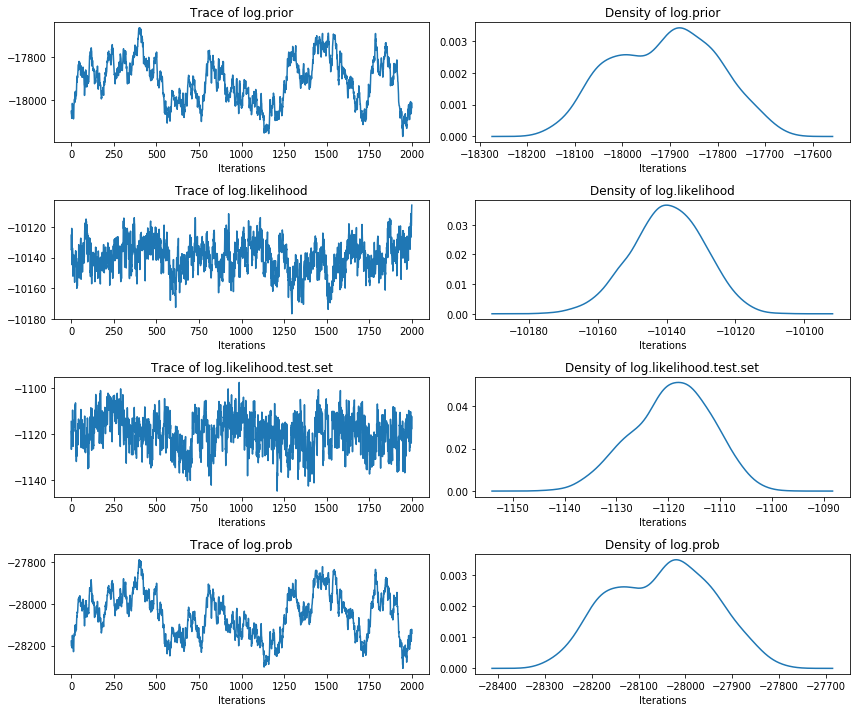

In [280]:
fig = plt.figure(figsize=[12,10])

plt.subplot(4,2,1)
plt.plot(df_log_prob['log.prior'])
plt.xlabel('Iterations')
plt.title('Trace of log.prior')

plt.subplot(4,2,2)
x,y = getDensity(df_log_prob['log.prior'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.prior')

plt.subplot(4,2,3)
plt.plot(df_log_prob['log.likelihood'])
plt.title('Trace of log.likelihood')
plt.xlabel('Iterations')
plt.tight_layout()

plt.subplot(4,2,4)
x,y = getDensity(df_log_prob['log.likelihood'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.likelihood')

plt.subplot(4,2,5)
plt.plot(df_log_prob['log.likelihood.test.set'])
plt.title('Trace of log.likelihood.test.set')
plt.xlabel('Iterations')
plt.tight_layout()

plt.subplot(4,2,6)
x,y = getDensity(df_log_prob['log.likelihood.test.set'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.likelihood.test.set')

plt.subplot(4,2,7)
plt.plot(df_log_prob['log.prior']+df_log_prob['log.likelihood'])
plt.title('Trace of log.prob')
plt.xlabel('Iterations')

plt.subplot(4,2,8)
x,y = getDensity(df_log_prob['log.prior']+df_log_prob['log.likelihood'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.prob')

plt.tight_layout()

plt.show()

### Plot the influence matrix between participants

In [281]:
A = int(np.sqrt(len(df_influence.columns))) #number of participants
id_person = {}
for p in person_id:
    id_person[person_id[p]]=p

In [282]:
def getmatrix(stacked,A):
    influence_matrix = [[0 for i in range(A)] for j in range(A)]
    for row in stacked.iteritems():
        from_ = int(row[0].split('.')[1])-1
        to_ = int(row[0].split('.')[2])-1
        value = float(row[1])
        influence_matrix[from_][to_]=value
    df_ = pandas.DataFrame(influence_matrix) 
    
    df_ =df_.rename(index = id_person)
    df_ =df_.rename(columns = id_person)
    return df_

In [283]:
stacked = df_influence.mean(axis=0)
df_mean = getmatrix(stacked,A)

stacked = df_influence.std(axis=0)
df_std = getmatrix(stacked,A)

In [284]:
df_mean

,Juror 8,Juror 3,Juror 10,Foreman,Juror 7,Juror 4,Juror 11,Juror 12,Juror 6,Juror 2,Juror 9,Juror 5
Juror 8,0.000000,3.757957,8.089079,0.930180,5.167497,0.794645,0.845335,1.336329,6.106684,0.916765,6.385205,7.300776
Juror 3,8.529312,0.000000,6.673916,4.150076,2.534751,4.902852,1.092571,0.509942,3.825015,3.861767,0.266426,1.561626
Juror 10,8.413188,7.427932,0.000000,4.540236,3.216307,1.030049,1.004598,0.529232,2.426582,0.407460,1.233599,0.885871
Foreman,1.137060,0.612615,1.945196,0.000000,1.521390,0.834870,1.338554,3.230634,1.013511,3.534036,1.311436,4.115411
Juror 7,2.603853,5.901169,0.648844,1.969868,0.000000,1.110101,0.279870,0.608548,1.047693,2.910670,1.619475,1.570038
Juror 4,5.791320,0.200669,0.266484,0.582956,0.094200,0.000000,3.347982,0.316963,0.300770,2.112033,0.370973,0.673364
Juror 11,0.378515,0.544628,0.779340,0.454645,0.290575,0.447512,0.000000,0.614536,0.821143,0.951222,0.476986,0.844157
Juror 12,5.961338,0.695831,0.519459,1.253033,0.247939,0.162463,0.388620,0.000000,2.500976,2.375977,0.481394,0.834032
Juror 6,4.526244,0.923784,0.503503,1.049825,1.288920,0.451562,0.375776,0.904313,0.000000,2.861587,0.905421,0.310822
Juror 2,0.583732,2.303417,0.529583,1.722894,2.005939,0.299311,0.652302,1.623813,0.841376,0.000000,1.691612,1.756225


MEAN of influence matrix (row=from, col=to)


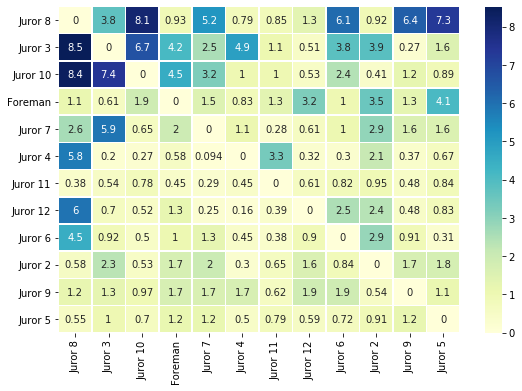

In [285]:
f, ax = plt.subplots(figsize=(9, 6))
seaborn.heatmap(df_mean, annot=True,  linewidths=.5, ax=ax,cmap="YlGnBu")
print('MEAN of influence matrix (row=from, col=to)')
plt.show()

SD of influence matrix (row=from, col=to)


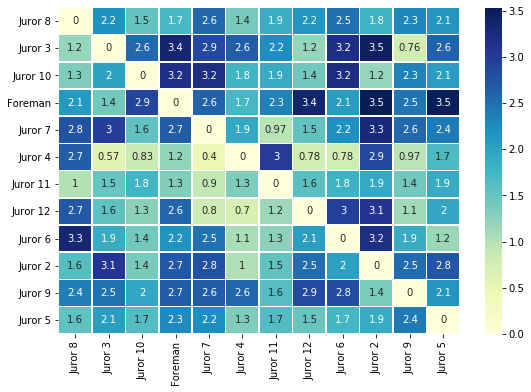

In [286]:
f, ax = plt.subplots(figsize=(9, 6))
seaborn.heatmap(df_std, annot=True,  linewidths=.5, ax=ax,cmap="YlGnBu")
print('SD of influence matrix (row=from, col=to)')
plt.show()

### Barplot of total influences sent/received

In [287]:
sender_std = {} #sd of total influence sent
reciever_std = {} #sd of total influence recieved
for i in range(A):
    reciever_std[id_person[i]] = df_influence[df_influence.columns[i::A]].sum(axis=1).std()
    sender_std[id_person[i]] = df_influence[df_influence.columns[i*A:(i+1)*A:]].sum(axis=1).std()

sent = df_mean.sum(axis=1) #mean of total influence sent
recieved =df_mean.sum(axis=0) #mean of total influence recieved

Total influence:

		Total linguistic influence sent/received 


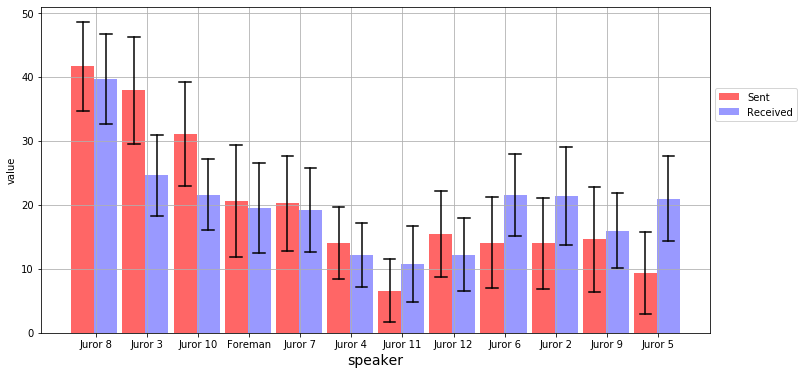

In [288]:
print ("\t\tTotal linguistic influence sent/received ")
ax.fig = plt.figure(figsize=[np.min([A,20]),6])

plt.grid()
wd=0.45
ii=0
for p in sender_std:
    plt.bar(person_id[p],sent.loc[p],width=wd,color='red',alpha=0.6,label = "Sent" if ii == 0 else "")
    plt.plot([person_id[p]-wd/4,person_id[p]+wd/4],[sent.loc[p]+sender_std[p],sent.loc[p]+sender_std[p]],color='k')
    plt.plot([person_id[p]-wd/4,person_id[p]+wd/4],[sent.loc[p]-sender_std[p],sent.loc[p]-sender_std[p]],color='k')
    plt.plot([person_id[p],person_id[p]],[sent.loc[p]-sender_std[p],sent.loc[p]+sender_std[p]],color='k')
    ii+=1
ii=0
for p in reciever_std:
    plt.bar(person_id[p]+wd,recieved.loc[p],width=wd,color='blue',alpha=0.4,label = "Received" if ii == 0 else "")
    plt.plot([person_id[p]+wd-wd/4,person_id[p]+wd+wd/4],[recieved.loc[p]+reciever_std[p],recieved.loc[p]+reciever_std[p]],color='k')
    plt.plot([person_id[p]+wd-wd/4,person_id[p]+wd+wd/4],[recieved.loc[p]-reciever_std[p],recieved.loc[p]-reciever_std[p]],color='k')
    plt.plot([person_id[p]+wd,person_id[p]+wd],[recieved.loc[p]-reciever_std[p],recieved.loc[p]+reciever_std[p]],color='k')
    ii+=1
plt.legend(loc='center left', bbox_to_anchor=(1, 0.7))
plt.xticks([i+0.25 for i in range(A)],list(zip(*sorted(id_person.items())))[1])
plt.ylabel('value')
plt.xlabel('speaker',fontsize=14)
plt.show()

## Visualize Influence Network!

You can visualize any of the influence matrices above:

Using networkx:

In [289]:
def drawNetwork(df,title):
    fig = plt.figure(figsize=[8,8])
    G = nx.DiGraph()
    for from_ in df.index:
        for to_ in df.columns:
            G.add_edge(from_,to_,weight = df.loc[from_][to_])
            
    pos = nx.spring_layout(G,k=0.55,iterations=20)
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())
    weights = np.array(weights)
    #weights = weights*weights
    weights = 6*weights/np.max(weights)
    print(title)
    
    edge_colors=20*(weights/np.max(weights))
    edge_colors = edge_colors.astype(int)
#     nx.draw_networkx_nodes(G,pos,node_size=1200,alpha=0.7,node_color='#99cef7')
#     nx.draw_networkx_edges(G,pos,edge_color=edge_colors)
#     nx.draw_networkx_labels(G,pos,font_weight='bold')
    nx.draw(G,pos,with_labels=True, font_weight='bold',width=weights,\
            edge_color=255-edge_colors,node_color='#99cef7',node_size=1200,\
            alpha=0.75,arrows=True,arrowsize=20)
    return edge_colors

In [290]:
# get quantile influence matrices for 25%, 50%, 75% quantile
stacked = df_influence.quantile(0.25)
df_q25 = getmatrix(stacked,A)

stacked = df_influence.quantile(0.5)
df_q50 = getmatrix(stacked,A)

stacked = df_influence.quantile(0.75)
df_q75 = getmatrix(stacked,A)

Mean Influence Network


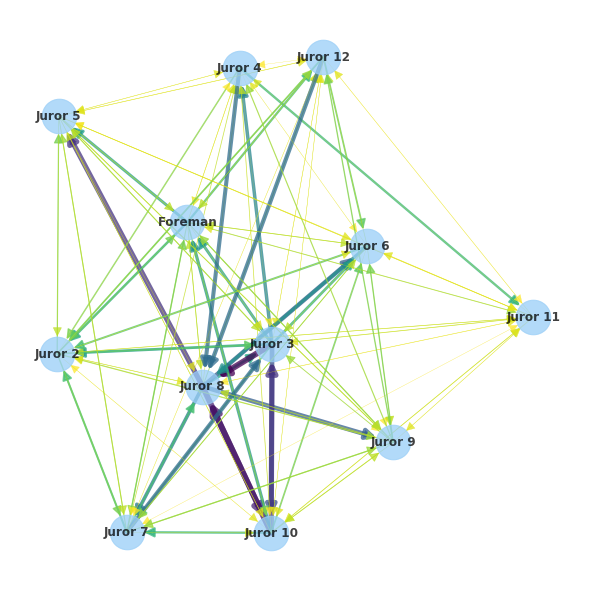

In [291]:
G_mean = drawNetwork(df_mean,'Mean Influence Network')

25 Quantile Influence Network


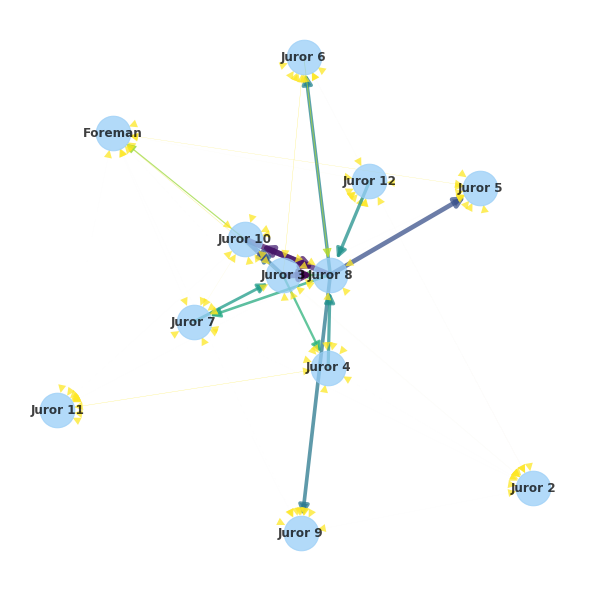

In [292]:
G_q25 = drawNetwork(df_q25,'25 Quantile Influence Network')

75 Quantile Influence Network


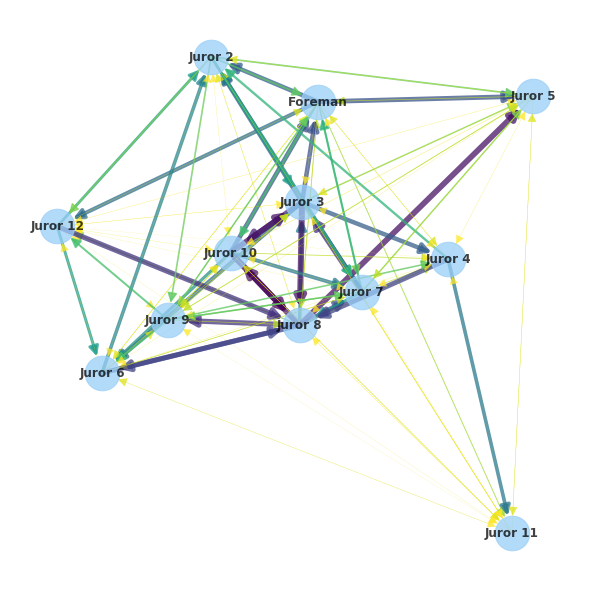

In [293]:
G_q75 = drawNetwork(df_q75,'75 Quantile Influence Network')

In [294]:
import lucem_illud_2020
import pandas
def fakeEnglish(length):
    listd=['a','b','c','d','e','f','g','s','h','i','j','k','l']
    return ''.join(np.random.choice(listd,length))

Your own dataset should contains 4 columns (with the same column names) as the artificial one below:

- name: name of the participant
- tokens: a list of tokens in one utterance
- start: starting time of utterance (unit doesn't matter, can be 'seconds','minutes','hours'...)
- end: ending time of utterance (same unit as start)

There is no need to sort data for the moment.

Below, we generate a fake collection of data from "Obama", "Trump", "Clinton"...and other recent presidents. You can either create your own simulation OR (better), add real interactional data from a online chat forum, comment chain, or transcribed from a conversation.

In [295]:
script= []
language = 'eng' #parameter, no need to tune if using English, accept:{'eng','chinese'}
role = 'Adult' #parameter, no need to tune 

for i in range(290):
    dt = []
    dt.append(np.random.choice(['Obama','Trump','Clinton','Bush','Reagan','Carter','Ford','Nixon','Kennedy','Roosevelt']))
    faketokens = [fakeEnglish(length = 4) for j in range(30)]
    dt.append(faketokens) #fake utterance
    dt.append(i*2+np.random.random()) # start time
    dt.append(i*2+1+np.random.random()) # end time
    script.append(dt)

df_transcript = pandas.DataFrame(script,columns=['name','tokens','start','end']) #"start", "end" are timestamps of utterances, units don't matter
df_transcript[:2]

,name,tokens,start,end
0,Roosevelt,"[ceej, defi, gche, lkia, jjih, dfsi, jbkh, bhj...",0.08864,1.262505
1,Ford,"[fcjk, ghsh, hcef, csja, hsda, flsj, feal, ffg...",2.98274,3.464078


Transform data into TalkbankXML format:

In [296]:
output_fname = 'USpresident.xml'  #should be .xml
language = 'eng' 
#language = 'chinese'
lucem_illud_2020.make_TalkbankXML(df_transcript, output_fname, language = language )

New File saved to ./data/USpresident/USpresident.xml


0

Run Bayesian Echo Chamber to get estimation.

- It may take a couple of hours. ( About 4-5 hours if Vocab_size=600 and sampling_time =2000)
- Larger "Vocab_size" (see below) will cost more time
- Larger "sampling_time" will also consume more time

In [297]:
Vocab_size = 90 # up to Vocab_size most frequent words will be considered, it should be smaller than the total vocab
sampling_time = 1500  #The times of Gibbs sampling sweeps  (500 burn-in not included)
lucem_illud_2020.bec_run(output_fname, Vocab_size, language, sampling_time)

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">Construct cells immediately below this that perform a similar social similarity or influence analysis on a dataset relevant to your final project. Create relationships between actors in a network based on your dataset (e.g., person to person or document to document), and perform analyses that interrogate the structure of their interactions, similarity, and/or influence on one another. (For example, if relevant to your final project, you could explore different soap operas, counting how many times a character may have used the word love in conversation with another character, and identify if characters in love speak like each other. Or do opposites attract?) What does that analysis and its output reveal about the relative influence of each actor on others? What does it reveal about the social game being played?

<span style="color:red">Stretch 1:
Render the social network with weights (e.g., based on the number of scenes in which actors appear together), then calculate the most central actors in the show.Realtime output can be viewed in shell.

<span style="color:red">Stretch 2:
Implement more complex measures of similarity based on the papers you have read.

As the speeches made by Trump and Clinton mainly contain two actors (two candidates), which is not suitable to build a social-actor network and run the social influence/similarity analysis, in the exercise I will explore just one different soup opera to proceed, and hope that TAs will understand this issue, thank you !

I will choose the another soup called "Young and Restless". 

In [298]:
# redo the loading and tokenizing, and gen the corpus of "young and restless"

corpora_address = "/Users/timqzhang/Desktop/UChicago/MACSS_Spring_2020/content_local/SOAP"
soap_texts = lucem_illud_2020.loadDavies(corpora_address, num_files=2000)
import zipfile
zfile = zipfile.ZipFile(corpora_address + "/soap_sources.zip")
source = []
for file in zfile.namelist():
    with zfile.open(file) as f:
        for line in f:
            source.append(line)
import pandas as pd
soap_dict = {}

for soap in source[3:]:
    try:
        textID, year, show, url = soap.decode("utf-8").split("\t")
    except UnicodeDecodeError:
        continue
    if show.strip() not in soap_dict:
        soap_dict[show.strip()] = []
    if show.strip() in soap_dict:
        try:
            soap_dict[show.strip()].append(soap_texts[textID.strip()])
        except KeyError:
            continue

soap_df = pd.DataFrame(columns=["Soap Name", "Tokenized Texts"])

i=0

for soap in soap_dict:
    # since there were multiple lists
    print(soap)
    full_script = []
    for part in soap_dict[soap]:
        full_script = full_script + part
    soap_df.loc[i] = [soap, full_script]
    i += 1

yar=soap_df['Tokenized Texts'][9]

text_7-jss.zip
text_6-egn.zip
text_5-rag.zip
text_2-wts.zip
text_3-pem.zip
text_4-jfy.zip
text_8-sbo.zip
text_9-jtw.zip
text_0-tez.zip
text_1-teh.zip
All My Childen
As the World Turns
Bold and Beautiful
Days of Our Lives
General Hospital
Guiding Light
One Life to Live
Passions
Port Charles
Young and Restless


In [299]:
# identify the characters

characters = {}

for token in yar:
    if token[0] == '@':
        # all characters or actions start with @, so we add that to character
        if token[2:] not in characters:
            characters[token[2:]] = 0
        if token[2:] in characters:
            characters[token[2:]] += 1
len(characters)

875

In [300]:
# so many characters, so we further identify main characters

for character in characters:
    if characters[character] > 2000:
        print(character, characters[character])

Nikki 3720
Victoria 3365
Billy 2246
Paul 2022
Michael 3568
Brad 2177
Ashley 2988
Victor 4981
Sharon 3733
Jill 2487
Jack 4739
Neil 2907
Phyllis 4736
J.T. 2170
Lauren 2220
Nick 4048
Kay 2205
Lily 3233
Sighs 2879
Kevin 2507
Daniel 2380


In [301]:
# gen a network for main characters

yar_actor_network = nx.Graph()

for character in characters:
    if characters[character] > 2000:
        yar_actor_network.add_node(character, lines_spoken= characters[character], words=[])

In [302]:
len(yar_actor_network.nodes.data())

21

In [303]:
yar_actor_network.nodes.data()

NodeDataView({'Nikki': {'lines_spoken': 3720, 'words': []}, 'Victoria': {'lines_spoken': 3365, 'words': []}, 'Billy': {'lines_spoken': 2246, 'words': []}, 'Paul': {'lines_spoken': 2022, 'words': []}, 'Michael': {'lines_spoken': 3568, 'words': []}, 'Brad': {'lines_spoken': 2177, 'words': []}, 'Ashley': {'lines_spoken': 2988, 'words': []}, 'Victor': {'lines_spoken': 4981, 'words': []}, 'Sharon': {'lines_spoken': 3733, 'words': []}, 'Jill': {'lines_spoken': 2487, 'words': []}, 'Jack': {'lines_spoken': 4739, 'words': []}, 'Neil': {'lines_spoken': 2907, 'words': []}, 'Phyllis': {'lines_spoken': 4736, 'words': []}, 'J.T.': {'lines_spoken': 2170, 'words': []}, 'Lauren': {'lines_spoken': 2220, 'words': []}, 'Nick': {'lines_spoken': 4048, 'words': []}, 'Kay': {'lines_spoken': 2205, 'words': []}, 'Lily': {'lines_spoken': 3233, 'words': []}, 'Sighs': {'lines_spoken': 2879, 'words': []}, 'Kevin': {'lines_spoken': 2507, 'words': []}, 'Daniel': {'lines_spoken': 2380, 'words': []}})

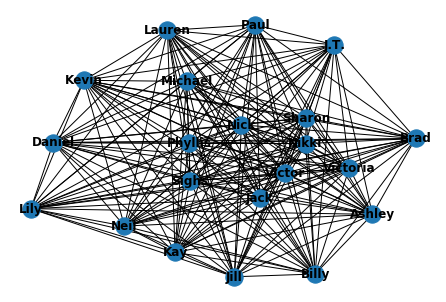

In [304]:
# create the graph

i = 0
for token in yar:
    i += 1
    if i > len(yar):
        break
    if token[0] == "@":
        if token[2:] in yar_actor_network.nodes():
            j = i
            for token_ in yar[i:]:
                if token_[0] == "@":
                    # if both the characters exist in the graph, add a weight
                    if token_[2:] != token[2:] and token_[2:] in yar_actor_network.nodes():
                        if (token[2:], token_[2:]) not in yar_actor_network.edges():
                            yar_actor_network.add_edge(token[2:], token_[2:], weight=0)
                        if (token[2:], token_[2:]) in yar_actor_network.edges():
                            yar_actor_network.edges[(token[2:], token_[2:])]['weight'] += 1
                    break
                j += 1
            # adding characters sentences
            yar_actor_network.nodes[token[2:]]['words'].append(yar[i:j])

nx.draw(yar_actor_network, with_labels=True, font_weight='bold')

In [305]:
print(nx.info(yar_actor_network))

Name: 
Type: Graph
Number of nodes: 21
Number of edges: 210
Average degree:  20.0000


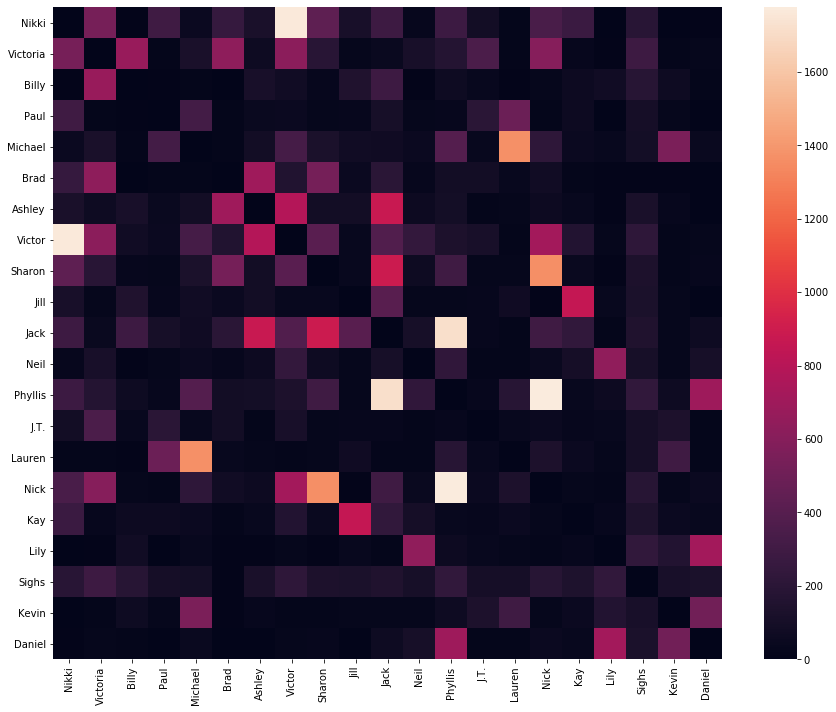

In [306]:
import seaborn as sns

L = []
for node in yar_actor_network.nodes():
    l = []
    for node_ in yar_actor_network.nodes():
        if node == node_:
            l.append(0)
        else:
            l.append(yar_actor_network.edges[(node, node_)]['weight'])
    L.append(l)
M_ = np.array(L)
fig = plt.figure(figsize=(15,12))
div = pandas.DataFrame(M_, columns = list(yar_actor_network.nodes()), index = list(yar_actor_network.nodes()))
ax = sns.heatmap(div)
plt.show()

In [307]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(yar_actor_network))
c

[frozenset({'Ashley',
            'Billy',
            'Brad',
            'Daniel',
            'J.T.',
            'Jack',
            'Jill',
            'Kay',
            'Kevin',
            'Lauren',
            'Lily',
            'Michael',
            'Neil',
            'Nick',
            'Nikki',
            'Paul',
            'Phyllis',
            'Sharon',
            'Sighs',
            'Victor',
            'Victoria'})]

### Comment/Inference

We have built a network of main characters above, and see that the relationships between characters are quite complex.. which makes sense as this soup is a long-lasting soup opera. Also, from the heatmap we see that the amount of conversations between each character pair is different, so we need to further dig out the structure of this network. 

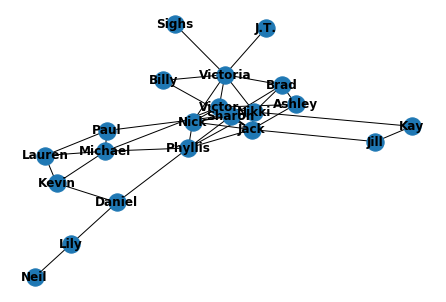

In [308]:
# try a smaller network and check structure

yar_smaller_actor_network = nx.Graph()

for actor_1 in yar_actor_network.nodes():
    yar_smaller_actor_network.add_node(actor_1, lines_spoken= yar_actor_network.nodes[actor_1]['lines_spoken'], words=yar_actor_network.nodes[actor_1]['words'])
    for actor_2 in yar_actor_network.nodes():
        if actor_2!=actor_1 and yar_actor_network.edges[(actor_1, actor_2)]['weight'] > 250:
            yar_smaller_actor_network.add_edge(actor_1, actor_2, weight=yar_actor_network.edges[(actor_1, actor_2)]['weight'])
nx.draw(yar_smaller_actor_network, with_labels=True, font_weight='bold')

In [309]:
print(nx.info(yar_smaller_actor_network))

Name: 
Type: Graph
Number of nodes: 21
Number of edges: 42
Average degree:   4.0000


In [310]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(yar_smaller_actor_network))
c

[frozenset({'Ashley',
            'Billy',
            'Brad',
            'Daniel',
            'J.T.',
            'Jack',
            'Jill',
            'Kay',
            'Kevin',
            'Lauren',
            'Lily',
            'Michael',
            'Neil',
            'Nick',
            'Nikki',
            'Paul',
            'Phyllis',
            'Sharon',
            'Sighs',
            'Victor',
            'Victoria'})]

In [311]:
# check the degree centrality of main characters

dcentralities_yar = nx.degree_centrality(yar_smaller_actor_network)
sorted(nx.degree_centrality(yar_smaller_actor_network).items(), key = lambda x: x[1], reverse = True)

[('Nikki', 0.45),
 ('Jack', 0.4),
 ('Victoria', 0.35000000000000003),
 ('Victor', 0.35000000000000003),
 ('Sharon', 0.30000000000000004),
 ('Phyllis', 0.30000000000000004),
 ('Nick', 0.30000000000000004),
 ('Michael', 0.25),
 ('Brad', 0.2),
 ('Paul', 0.15000000000000002),
 ('Lauren', 0.15000000000000002),
 ('Kevin', 0.15000000000000002),
 ('Ashley', 0.15000000000000002),
 ('Daniel', 0.15000000000000002),
 ('Kay', 0.1),
 ('Billy', 0.1),
 ('Jill', 0.1),
 ('Lily', 0.1),
 ('J.T.', 0.05),
 ('Sighs', 0.05),
 ('Neil', 0.05)]

### Comment/Inference

It can be seen from the graph that the characters in Young and Restless do not have seperated cliques/communities, but they are all connected. Note that even they are in the same clique as a whole, we can see clearly that there exists a central circle including Nikki, Jack, Victor, Sharon, etc., while some other characters like Neil, Lily, Jill are on the outside. 

To verify this, I further calculate the degree centrality of different characters, and find that the most central actors include Nikki, Jack, Victoria, Victor, Sharon, Phyllis and Nick (I list here the top 7 characters based on degree centrality). 

In [312]:
# the next task will find out which characters are in love, and see whether they speak like each other due to that they are in relationship.

# set a graph for love, with the same main characters

yar_actor_network_love = nx.Graph()

for character in characters:
    if characters[character] > 2000:
        yar_actor_network_love.add_node(character, lines_spoken= characters[character], words=[])

# if two characters in the graph and there are word of "love" in their conversations, add one weight

# set the initial value

i = 0
i_love = False

for token in yar:
    i += 1
    if i > len(yar):
        break
    if token[0] == "@":
        if token[2:] in yar_actor_network_love.nodes():
            j = i
            for token_ in yar[i:]:
                if token_ == "love":
                    i_love = True
                if token_[0] == "@":
                    # if both the characters exist in the graph and "love" show up, add a weight
                    if token_[2:] != token[2:] and token_[2:] in yar_actor_network_love.nodes() and i_love == True:
                        if (token[2:], token_[2:]) not in yar_actor_network_love.edges():
                            yar_actor_network_love.add_edge(token[2:], token_[2:], weight=0)
                        if (token[2:], token_[2:]) in yar_actor_network_love.edges():
                            yar_actor_network_love.edges[(token[2:], token_[2:])]['weight'] += 1
                        i_love = False
                    break
                j += 1
            # adding characters sentences
            yar_actor_network_love.nodes[token[2:]]['words'].append(yar[i:j])


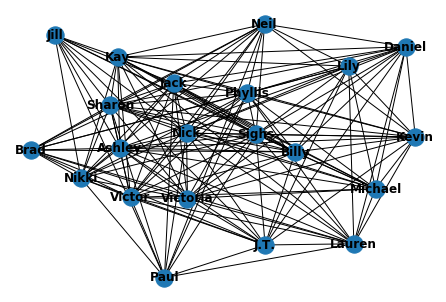

In [313]:
nx.draw(yar_actor_network_love, with_labels=True, font_weight='bold')

In [314]:
print(nx.info(yar_actor_network_love))

Name: 
Type: Graph
Number of nodes: 21
Number of edges: 155
Average degree:  14.7619


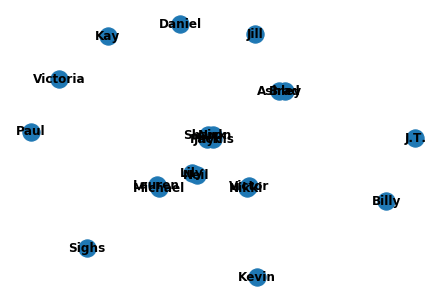

In [315]:
# similarly, try make a smaller network of "love" by removing those edges with weight less than or equal to 20

yar_smaller_actor_network_love = nx.Graph()

for actor_1 in yar_actor_network_love.nodes():
    yar_smaller_actor_network_love.add_node(actor_1, lines_spoken= yar_actor_network_love.nodes[actor_1]['lines_spoken'], words=yar_actor_network_love.nodes[actor_1]['words'])
    for actor_2 in yar_actor_network_love.nodes():
        if (actor_1, actor_2) in yar_actor_network_love.edges() and actor_2!=actor_1 and yar_actor_network_love.edges[(actor_1, actor_2)]['weight'] >= 20:
            yar_smaller_actor_network_love.add_edge(actor_1, actor_2, weight=yar_actor_network_love.edges[(actor_1, actor_2)]['weight'])
nx.draw(yar_smaller_actor_network_love, with_labels=True, font_weight='bold')

In [316]:
print(nx.info(yar_smaller_actor_network_love))

Name: 
Type: Graph
Number of nodes: 21
Number of edges: 8
Average degree:   0.7619


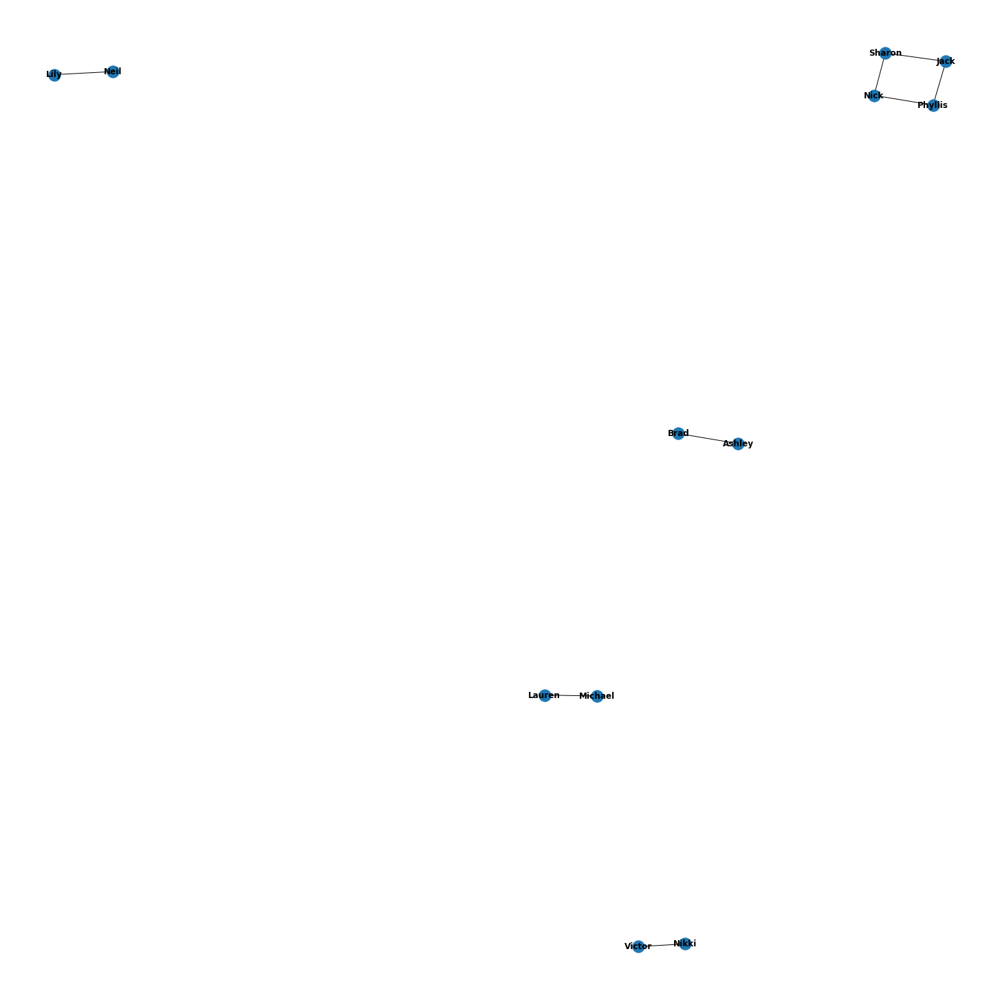

In [317]:
# cut the isolated nodes

plt.figure(figsize=(20,20)) 
yar_smaller_actor_network_love.remove_nodes_from(list(nx.isolates(yar_smaller_actor_network_love)))

# draw the plot (I here enlarge the figsize, otherwise the nodes squeeze together and the relationship cannot be plotted clearly)

nx.draw(yar_smaller_actor_network_love, with_labels=True, font_weight='bold')
plt.show()

### Comment/Inference

It can be seen that the raw graph of love relations is quite messy, indicating that the characters may all love each other, but since the appearance of word "love" may not indicate a love relation, I further cut those edges with weight of love less than 20, and form the smaller graph above. When two people say love more than 20 times, we may consider that they are in the relationship. Further, I cut off the isolated nodes to make the graph clearer. 

From the even smaller network graph above, I find five relations in all. It can be inferred that (Ashley,Brad), (Neil, Lily), (Nikki, Victor) and (Lauren, Michael) are four stable couples. Each pair love each other and there are no other people involved. One quite interesting relation is among (Phyllis, Nick, Jack, Sharon), whose edges perfectly form a square, indicating that their love relations are complex..but also exciting lol. I can imagine how these four people perform their love in the soup opera, with probably some betray and conflicts.

In [318]:
# then I will check two things: 

# 1. check if higher number of conversations will make two characters speak like each other
# 2. check if couples in love will speak like each other

# initial settings

import nltk

def kl_divergence(X, Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    D_kl = scipy.stats.entropy(p, q)
    return D_kl

def chi2_divergence(X,Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    return scipy.stats.chisquare(p, q).statistic

def Divergence(corpus1, corpus2, difference="KL"):
    """Difference parameter can equal KL, Chi2, or Wass"""
    freqP = nltk.FreqDist(corpus1)
    P = pandas.DataFrame(list(freqP.values()), columns = ['frequency'], index = list(freqP.keys()))
    freqQ = nltk.FreqDist(corpus2)
    Q = pandas.DataFrame(list(freqQ.values()), columns = ['frequency'], index = list(freqQ.keys()))
    if difference == "KL":
        return kl_divergence(P, Q)
    elif difference == "Chi2":
        return chi2_divergence(P, Q)
    elif difference == "KS":
        try:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency']).statistic
        except:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency'])
    elif difference == "Wasserstein":
        try:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None).statistic
        except:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None)

In [319]:
# prepare the heatmap

yar_corpora = []
for character in yar_actor_network.nodes():
    character_words = []
    for sentence in yar_actor_network.nodes[character]['words']:
        for word in sentence:
            character_words.append(word)
    yar_corpora.append(lucem_illud_2020.normalizeTokens(character_words))

L = []

# use the KS distance

for p in yar_corpora:
    l = []
    for q in yar_corpora:
        l.append(Divergence(p,q, difference='KS'))
    L.append(l)
M = np.array(L)

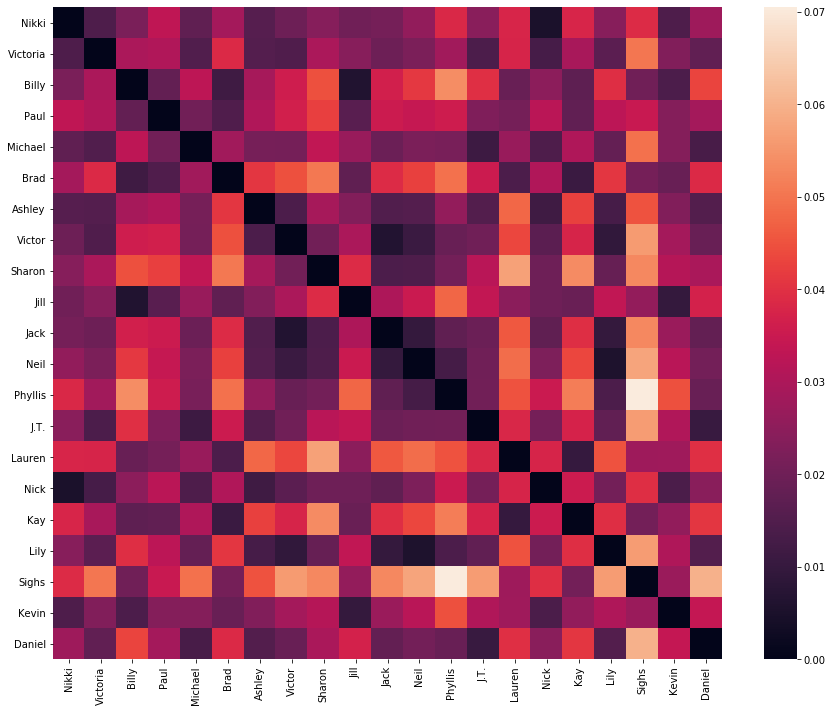

In [320]:
# draw the heatmap

fig = plt.figure(figsize=(15,12))
div = pandas.DataFrame(M, columns = list(yar_actor_network.nodes()), index = list(yar_actor_network.nodes()))
ax = sns.heatmap(div)
plt.show()

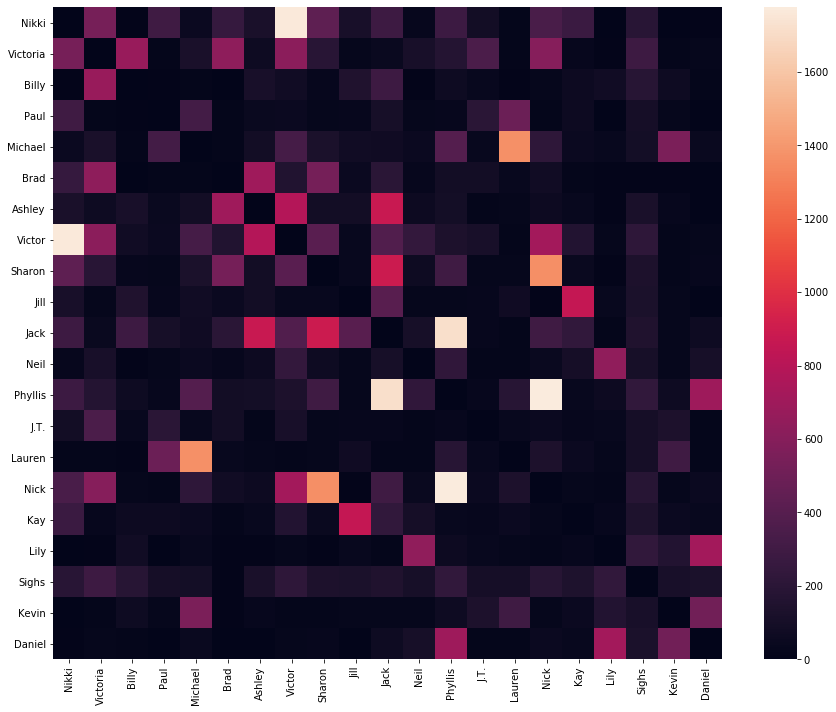

In [321]:
# redraw the heatmap of number of conversation to make comparison

L = []
for node in yar_actor_network.nodes():
    l = []
    for node_ in yar_actor_network.nodes():
        if node == node_:
            l.append(0)
        else:
            l.append(yar_actor_network.edges[(node, node_)]['weight'])
    L.append(l)
M_ = np.array(L)
fig = plt.figure(figsize=(15,12))
div = pandas.DataFrame(M_, columns = list(yar_actor_network.nodes()), index = list(yar_actor_network.nodes()))
ax = sns.heatmap(div)
plt.show()

### Comment/Inference

For the first task, we mainly check five pairs with largest number of conversations as shown in the heatmap: (Phyllis, Nick), (Phyllis, Jack), (Nikki, Victor), (Lauren, Michael) and (Nick, Sharon), and from the comparison of two heatmaps on these five pairs, their KS cells in the first heatmap are indeed not bright, with some quite dark, showing low distance. It to some degrees indicates that if two characters have more conversations, they will speak like each other.

For the second task, one interesting thing is that the five pairs in the first tasks cover most couples, and if we check the first heatmap on (Ashley,Brad), (Neil, Lily), (Nikki, Victor) and (Lauren, Michael) and (Phyllis, Nick, Jack, Sharon), we see that the KS cells of (Neil, Lily), (Nikki, Victor) and (Lauren, Michael) and (Phyllis, Nick, Jack, Sharon) are not bright, with some quite dark, while the KS cell of (Ashley,Brad) is quite bright. In general, we say that characters in love will to some degrees make them speak like each other. 

## Conversational Analysis using ConvoKit

The accompanying notebook [convokit](https://github.com/Computational-Content-Analysis-2020/Content-Analysis-2020/blob/master/week-4/convokit.ipynb) demonstrates the capacities of CornellNLP's package convokit, which provides multiple ways to analyse networks of conversations.

There are 6 different approaches illustrated:

1. Measures of linguistic coordination
2. Politeness strategy
3. Prompt type
4. Hypergraph conversation representation
5  Linguistic diversity in conversations
6. Forecasting of conversation outcomes

The examples illustrate these methods using the built in datasets which ConvoKit offers. This [Jupyter notebook](https://github.com/CornellNLP/Cornell-Conversational-Analysis-Toolkit/blob/master/examples/converting_movie_corpus.ipynb) demonstrates how to convert your own corpora so that you can easily use the metrics provided in convokit. 

## <span style="color:red">*Exercise 5*</span>

<span style="color:red"> Implement one (or more) of the metrics from ConvoKit on your dataset of choice; what does it reveal about the social game of your dataset?

I will choose the first approach called "Measures of linguistic coordination" in the `convokit` notebook to do the analysis, and the corpus in this exercise will be a corpus from ConvoKit, which is a collection of conversations from Wikipedia editor’s talk pages with metadata.

Detailed description of this corpus could be found here: https://convokit.cornell.edu/documentation/wiki.html.

In [322]:
# import necessary packages of convokit

import convokit
from convokit import download
from convokit.prompt_types import PromptTypeWrapper
from convokit import PolitenessStrategies
from convokit import Corpus

import matplotlib.pyplot as plt
%matplotlib inline

In [323]:
# download the corpus

corpus = convokit.Corpus(filename=convokit.download("wiki-corpus"))

Dataset already exists at /Users/timqzhang/Desktop/UChicago/MACSS_Spring_2020/Content-Analysis-2020/data/wiki-corpus


In [324]:
# compute coordination scores on this corpus
coord = convokit.Coordination()
coord.fit(corpus)

# get coordination scores
coord.transform(corpus)

In [325]:
# get set of admins and all editors

# "everyone" here is all wiki editors

admins = list(corpus.iter_users(lambda user: user.meta["is-admin"]))
everyone = list(corpus.iter_users())

In [326]:
# compute coordination from each admin to all editors

wiki_dict={}

print("Admin account name, ranked by how much they coordinate to others:")
admin_to_everyone = coord.score(corpus, admins, everyone)
for admin, score in sorted(admin_to_everyone.averages_by_user().items(),
    key=lambda x: x[1], reverse=True):
    print(admin.id, round(score, 5))
    
    # store the admin account name and their scores into dict
    wiki_dict[admin.id]=[round(score, 5),]
    
print()

Admin account name, ranked by how much they coordinate to others:
Jwrosenzweig 0.54167
Samulili 0.37597
Fribbler 0.22917
Briangotts 0.225
Drini 0.2
Sverdrup 0.19444
Nihonjoe 0.18333
Deepujoseph 0.18155
Benc 0.17083
Grandmasterka 0.16817
Conscious 0.16667
Anonymous editor 0.16553
PeaceNT 0.16271
Andres 0.15746
TigerShark 0.15208
CyborgTosser 0.15034
Cobaltbluetony 0.15011
Lostintherush 0.15
Willmcw 0.14471
Ahoerstemeier 0.14371
harej 0.14077
Ganeshk 0.1381
DO11.10 0.13726
Sango123 0.13333
Jedi6 0.13333
Spangineer 0.13333
Whouk 0.13333
Redvers 0.13118
Urhixidur 0.13095
Woggly 0.13021
Epbr123 0.12634
Lquilter 0.125
Andonic 0.12421
Joy Stovall 0.11905
SimonP 0.11905
Justinc 0.11825
Pengo 0.11726
Extreme Unction 0.11667
Joy 0.11613
Savidan 0.11429
Ww 0.1125
Thunderbrand 0.1122
Lifebaka 0.1121
Stevenfruitsmaak 0.11171
Mlaffs 0.11136
Inter 0.11111
Malcolm 0.1102
Keegan 0.10858
Jauerback 0.10833
Evilclown93 0.10774
Bellhalla 0.10764
Renata3 0.10719
Reflex Reaction 0.10714
Duja 0.1068
Amire80 0

William M. Connolley 8e-05
VanTucky 0.0
Kim Dent-Brown 0.0
Makemi 0.0
Gurubrahma 0.0
Michael Snow 0.0
DaGizza 0.0
thunderboltz 0.0
ChrisTheDude 0.0
Cprompt 0.0
DavidWBrooks 0.0
smoddy 0.0
Petaholmes 0.0
Graft 0.0
Harro5 0.0
Fastfission 0.0
Jogers 0.0
Rbrwr 0.0
Steve 0.0
The Placebo Effect 0.0
CanadianCaesar 0.0
Ixfd64 0.0
Duncharris 0.0
Aleta 0.0
Mushroom 0.0
KnightLago 0.0
Neutrality 0.0
Dravecky 0.0
Someguy1221 0.0
Sasquatch 0.0
Atlant 0.0
Rossami 0.0
Sheldon Rampton 0.0
EliminatorJR 0.0
La goutte de pluie 0.0
Metropolitan90 0.0
SGGH 0.0
Rama's Arrow 0.0
Climie.ca 0.0
Karmafist 0.0
Mackeriv 0.0
Elf-friend 0.0
TwinsMetsFan 0.0
Docu 0.0
Marumari 0.0
Kevin 0.0
Seattle Skier 0.0
Duk 0.0
Mtz206 0.0
Viajero 0.0
Ssd 0.0
Xymmax 0.0
Jiang 0.0
Paxse 0.0
Mattbr 0.0
DrKiernan 0.0
Optimist on the run 0.0
WilliamH 0.0
LiquidGhoul 0.0
Goldom 0.0
Melesse 0.0
Sanchom 0.0
Stephen 0.0
Pastordavid 0.0
Asbestos 0.0
Cimon Avaro 0.0
Tcncv 0.0
Quercusrobur 0.0
Jdavidb 0.0
Cholmes75 0.0
Icestorm815 0.0
Betac

In [327]:
# compute coordination from all editors to each admin

print("Admin account name, ranked by how much others coordinate to them:")
everyone_to_admin = coord.score(corpus, everyone, admins, focus="targets")
for admin, score in sorted(everyone_to_admin.averages_by_user().items(), 
    key=lambda x: x[1], reverse=True):
    print(admin.id, round(score, 5))
    
    # store the admin account name and their scores into dict
    if admin.id in wiki_dict.keys():
        wiki_dict[admin.id].append(round(score, 5))
    else:
        wiki_dict[admin.id]=[round(score, 5)]
    
print()

Admin account name, ranked by how much others coordinate to them:
Jake Wartenberg 0.66667
Bcorr 0.39286
Dgrant 0.34694
Dravecky 0.30769
Rockero 0.25
Fred chessplayer 0.25
GDonato 0.25
Mustafaa 0.25
Brian0918 0.25
Olivier 0.24703
Kilo-Lima 0.24286
Brighterorange 0.22791
Kaihsu 0.225
Ezeu 0.20816
Diberri 0.20347
DerHexer 0.2016
Anthere 0.2
DoomsDay349 0.19601
Patrick 0.19504
Anas Salloum 0.19048
CSTAR 0.1875
Garzo 0.16339
Nikki311 0.1619
Scm83x 0.15
Kwsn 0.14896
Wickethewok 0.14861
Isomorphic 0.14643
Firefoxman 0.14315
Tannin 0.1375
KrakatoaKatie 0.1369
Revolving Bugbear 0.1337
Meelar 0.13333
Ahoerstemeier 0.13234
Ancheta Wis 0.12917
Materialscientist 0.12602
Ruslik0 0.12569
Magnus animum 0.125
Android79 0.12256
Timotheus Canens 0.11799
AYArktos 0.1122
Joolz 0.11131
Wouterstomp 0.11111
Marianocecowski 0.11111
Drini 0.10744
Thatcher 0.10714
Dijxtra 0.10524
Malcolmxl5 0.10417
Walton One 0.10288
Gyrofrog 0.10207
Jujutacular 0.10198
Sortior 0.1
Conscious 0.1
Xenocidic 0.09844
Kylu 0.09837
Ae

David D. 0.002
RegentsPark 0.00196
AniMate 0.00195
Visorstuff 0.00191
Jza84 0.00186
Amatulic 0.00175
Karmafist 0.00172
Sadads 0.00163
Elkman 0.00162
Husond 0.00144
Random832 0.00136
BrownHairedGirl 0.00135
Petros471 0.00133
Redux 0.0012
harej 0.00118
Grant65 0.00114
BrendelSignature 0.00111
Rmhermen 0.00104
Journalist 0.00094
Gryffindor 0.00091
mic 0.00089
J04n 0.00086
John Carter 0.00075
Jimfbleak 0.00074
Stan Shebs 0.00053
Nightscream 0.00051
Grenavitar 0.00035
Essjay 0.00031
Jclemens 0.00031
FT2 0.00029
Angr 0.00026
Ynhockey 0.00018
Kizor 0.00011
JForget 0.0
Flowerparty 0.0
Timwi 0.0
Aqwis 0.0
Brendanconway 0.0
Eugene van der Pijll 0.0
Kakofonous 0.0
TheCatalyst31 0.0
Olaf Davis 0.0
Either way 0.0
Husnock 0.0
PresN 0.0
Seattle Skier 0.0
Electionworld 0.0
Ihcoyc 0.0
Valley2city 0.0
Kevin 0.0
Dbiv 0.0
Rich Farmbrough 0.0
Scimitar 0.0
Fastfission 0.0
CJLL Wright 0.0
Lid 0.0
Sn0wflake 0.0
Andrew Norman 0.0
Ilmari Karonen 0.0
Leithp 0.0
Bumm13 0.0
Triddle 0.0
Jareth 0.0
FreplySpang 0.0
L

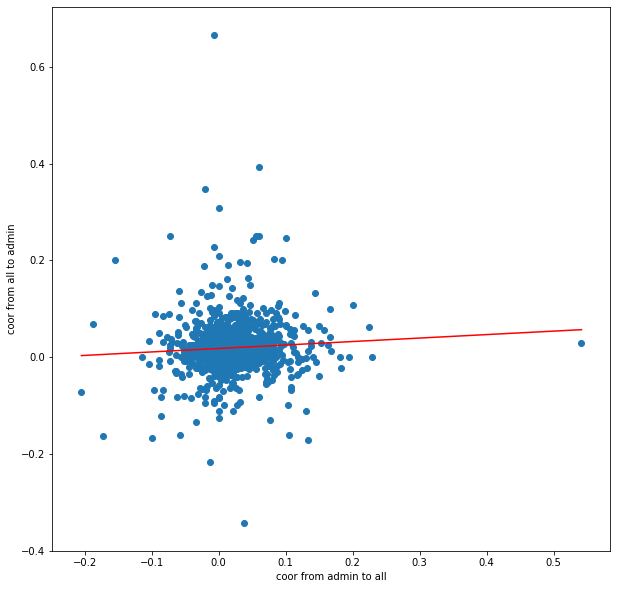

In [328]:
# to make scores clearer, combine them into one scatter plot

# as the coordination from two directions will generate two distict groups of admin, take the intersection of them.
        
coor_score=[score for score in wiki_dict.values() if len(score)==2]

coor_out=[s[0] for s in coor_score]
coor_in=[s[1] for s in coor_score]

plt.figure(figsize=(10,10))
plt.scatter(coor_out,coor_in)
plt.xlabel("coor from admin to all")
plt.ylabel('coor from all to admin')

# add a fitting line
plt.plot(np.unique(coor_out), np.poly1d(np.polyfit(coor_out, coor_in, 1))(np.unique(coor_out)),color='red')

### Comment/Inference

As there are so many admins, we cannot check them one by one, and that's why I draw this plot to have a general picture. From this plot, in general, we find a positive relation, and we can say that the more the coordination from admins to all editors, then the more the coordination from all editors to admins. It makes sense actually, as it is a good dynamics in people's relations, and here a good dynamic between admins and editors: if admins show more coordination to all editors, then all editors will also show more to admins. Note that the slope of the fitting line is not large, so this positive relation may not quite strong between wiki admins and all wiki editors. 